# Results Analysis for Jag6 Data

In [1]:
import json
import os
from os.path import join
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from rich import print as rich_print

In [2]:
from analysis.files import *

In [17]:
LOG_DIR = "../logs"

[f for f in sorted(os.listdir(LOG_DIR)) if f.startswith("act_lm")]

['act_lm_browsecomp_gt',
 'act_lm_browsecomp_gt_mt4k',
 'act_lm_snorkel_finance_aprm_fs1_15',
 'act_lm_snorkel_finance_aprm_fs1_45',
 'act_lm_snorkel_finance_gt',
 'act_lm_snorkel_finance_gt_mt4k_tt',
 'act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k',
 'act_lm_snorkel_insurance_gt',
 'act_lm_snorkel_insurance_gt_mt4k',
 'act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k',
 'act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k',
 'act_lm_taubench_airline_gt',
 'act_lm_taubench_airline_gt_mt4k',
 'act_lm_taubench_retail_gt_mt4k',
 'act_lm_tw_coin',
 'act_lm_tw_cooking_fsc_ms1_mt4k',
 'act_lm_tw_treasure']

In [18]:
TARGET_FILES = {
    "eval_gen_action_metrics.csv": "csv",
    "eval_lm_action_metrics.csv": "csv",
    "metrics.jsonl": "jsonl",
}

{'csv': [PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=

In [20]:
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_8B")

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)

In [21]:
valid_metrics_files

{'csv': [PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=3

In [12]:
valid_metrics_files

{'csv': [PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=

In [47]:
df = pd.read_json(valid_metrics_files['jsonl'][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]
eval_gen_cols, eval_lm_cols

,grad_step,global_step,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest,eval/eval_idx,eval/best_ppl,eval/best_ppl_step,train/loss,train/ppl,train/weight
0,0,0,1.752296,5.767832,0.173375,0.074553,0.0,0.0,0.0,5.767832,0.0,6.000000,404.000,0.348678
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.593750,13.375,0.729000
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.828125,16.875,0.531441
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.546875,12.750,0.590490
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.562500,35.250,0.166772


([],
 ['eval/nll',
  'eval/ppl',
  'eval/probs',
  'eval/step_act_acc',
  'eval/task_success',
  'eval/task_longest'])

## Plots

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, ScalarFormatter

plt.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 10,
    "lines.linewidth": 2.0,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

def _clean_axis(ax):
    ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
    ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style="plain", axis="y")
    ax.margins(y=0.10)


def _barplot_first_last(values_first, values_last, labels, title, ylabel, logy=False):
    # Keep a consistent order: sort by last value (often what you care about)
    order = np.argsort(values_last)
    labels = [labels[i] for i in order]
    values_first = [values_first[i] for i in order]
    values_last = [values_last[i] for i in order]

    for which, vals in [("first", values_first), ("last", values_last)]:
        fig, ax = plt.subplots(figsize=(7.5, 3.6))
        x = np.arange(len(labels))
        ax.bar(x, vals)

        ax.set_title(f"{title} ({which} grad_step)")
        ax.set_ylabel(ylabel)
        ax.set_xticks(x)
        ax.set_xticklabels(labels, rotation=35, ha="right")

        if logy:
            ax.set_yscale("log")

        _clean_axis(ax)
        fig.tight_layout()
        plt.show()
        plt.close(fig)

In [38]:
def make_group_color_getter(n_cool: int, n_warm: int):
    # sample evenly through each colormap so colors are distinct
    cool_cmap = plt.get_cmap("cool")     # bluish/cyan/magenta
    warm_cmap = plt.get_cmap("autumn")   # red/orange/yellow

    cool_ts = np.linspace(0.15, 0.90, max(n_cool, 1))
    warm_ts = np.linspace(0.15, 0.90, max(n_warm, 1))

    cool_colors = [cool_cmap(t) for t in cool_ts]
    warm_colors = [warm_cmap(t) for t in warm_ts]

    cool_i = 0
    warm_i = 0

    def get_color(label: str):
        nonlocal cool_i, warm_i
        if "Thoughts" in label:
            c = cool_colors[cool_i % len(cool_colors)]
            cool_i += 1
            return c
        else:
            c = warm_colors[warm_i % len(warm_colors)]
            warm_i += 1
            return c

    return get_color

### Try to reconcile keys

In [43]:
keys_v1 = ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
keys_v2 =['eval/lm_nll', 'eval/lm_step_acc', 'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs', 'eval/lm_best_ppl', 'eval/lm_best_ppl_step', 'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest']

KEY_MAP_FWD = {
    "eval/nll": "eval/lm_nll",
    "eval/ppl": "eval/lm_ppl",
    "eval/probs": "eval/lm_probs",
    "eval/step_act_acc": "eval/lm_step_acc",
    "eval/task_success": "eval/lm_success",
    "eval/task_longest": "eval/lm_longest",
}
KEY_MAP_REV = {v: k for k, v in KEY_MAP_FWD.items()}

In [61]:
for root, _dirs, files in os.walk(base):
    print(_dirs)

['act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-hiob=1-lera=1e_06-se=0-re=gen1_sl_al', 'act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-acon=1-hiob=1-lera=1e_06-mibasi=8-se=0-re=gen1_sl_al', 'act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al', 'act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-acon=1-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al', 'act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-hiob=1-lera=4e_05-se=0-re

In [67]:
sorted(valid_metrics_files[FILE_KIND], key=lambda x: "-acon=1" in str(x))

[PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-hiob=1-lera=1e_06-se=0-re=gen1_sl_al/metrics.jsonl'),
 PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl'),
 PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-hiob=1-lera=4e_05-se=0-re=gen0_sl/metrics.jsonl'),
 PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_

,grad_step,global_step,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest,eval/eval_idx,eval/best_ppl,eval/best_ppl_step,train/loss,train/ppl,train/weight
0,0,0,1.752296,5.767832,0.173375,0.074553,0.0,0.0,0.0,5.767832,0.0,6.000000,404.000,0.348678
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.593750,13.375,0.729000
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.828125,16.875,0.531441
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.546875,12.750,0.590490
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.562500,35.250,0.166772


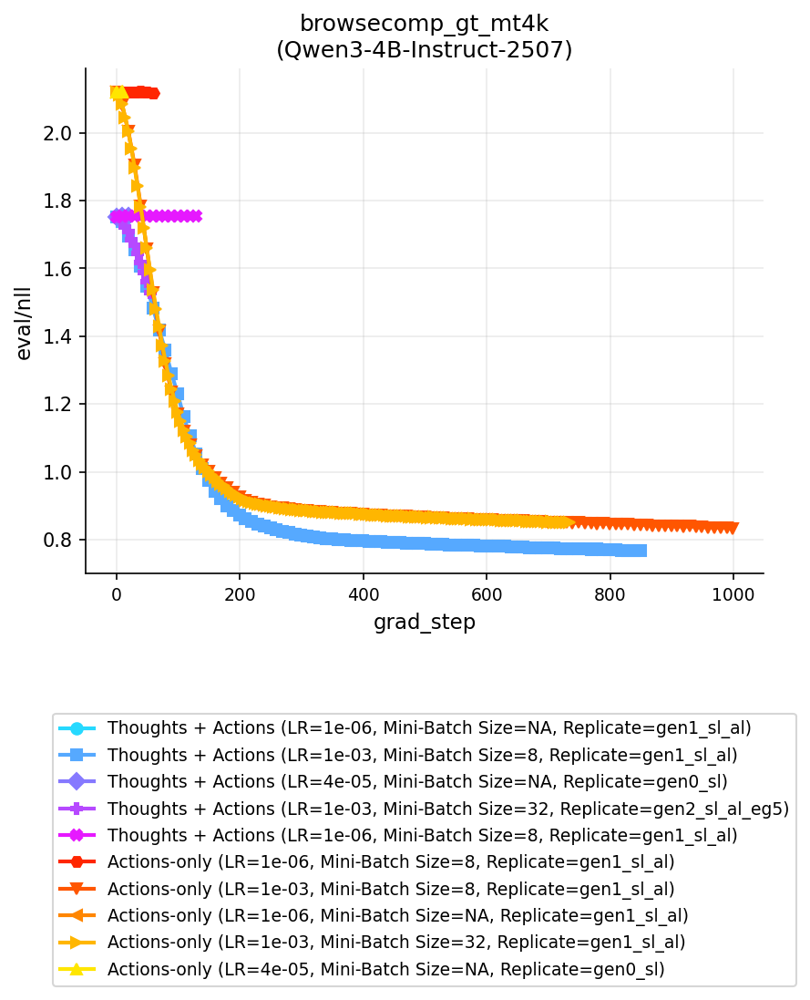

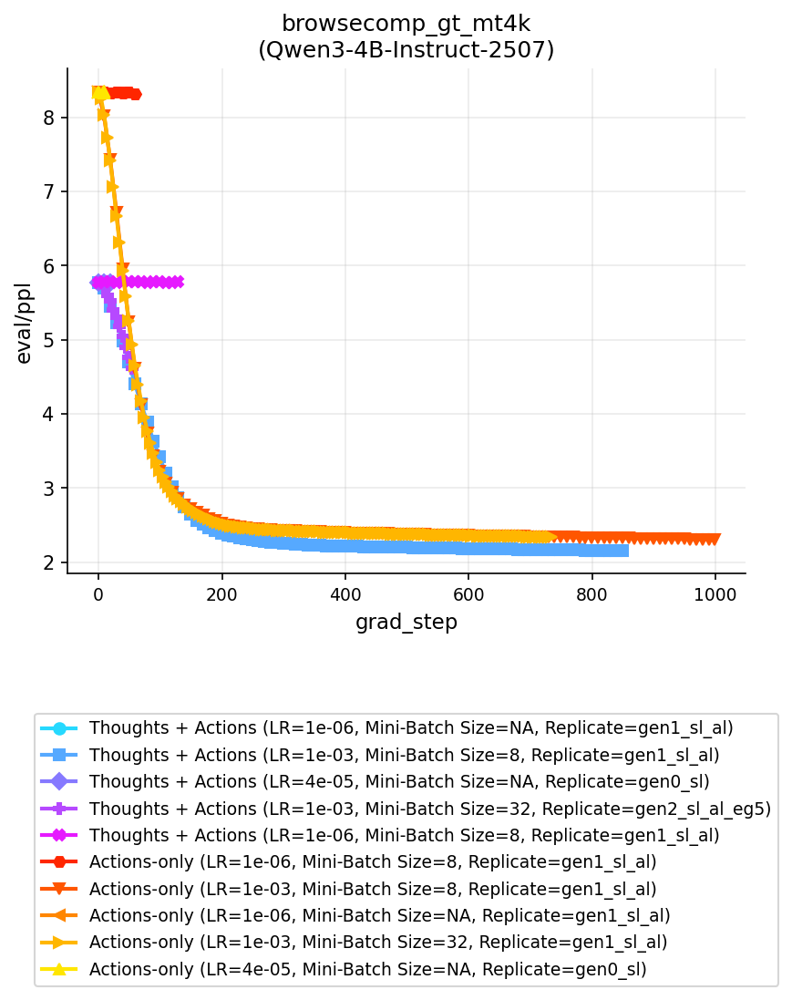

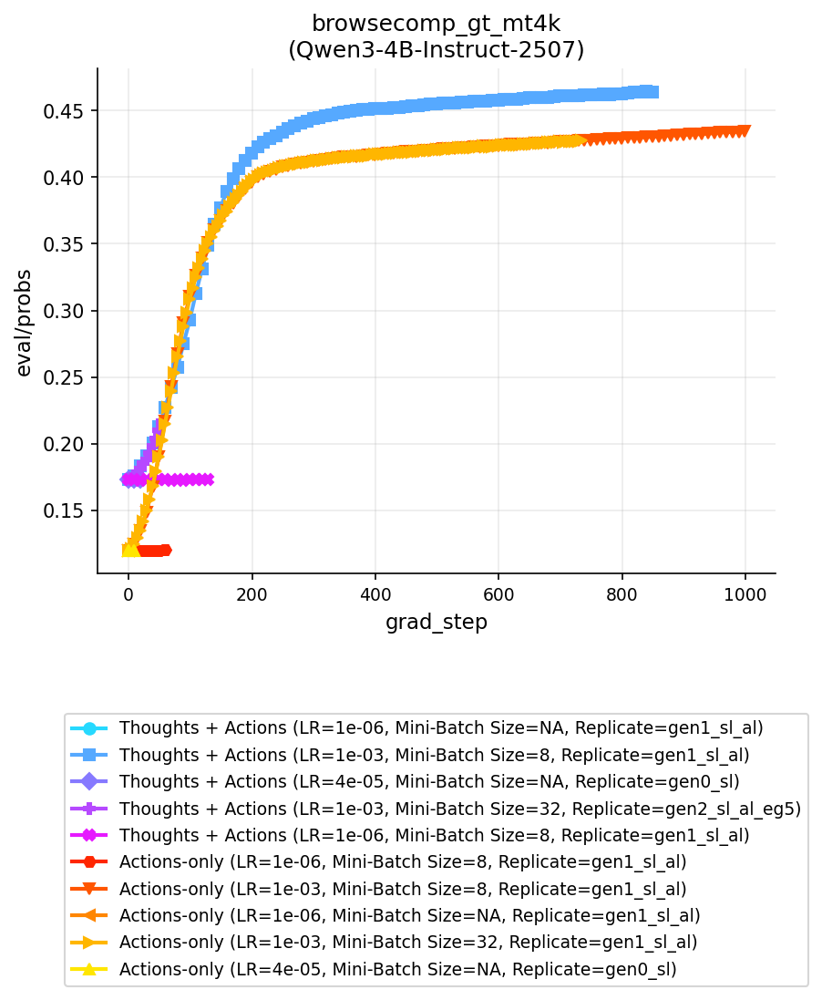

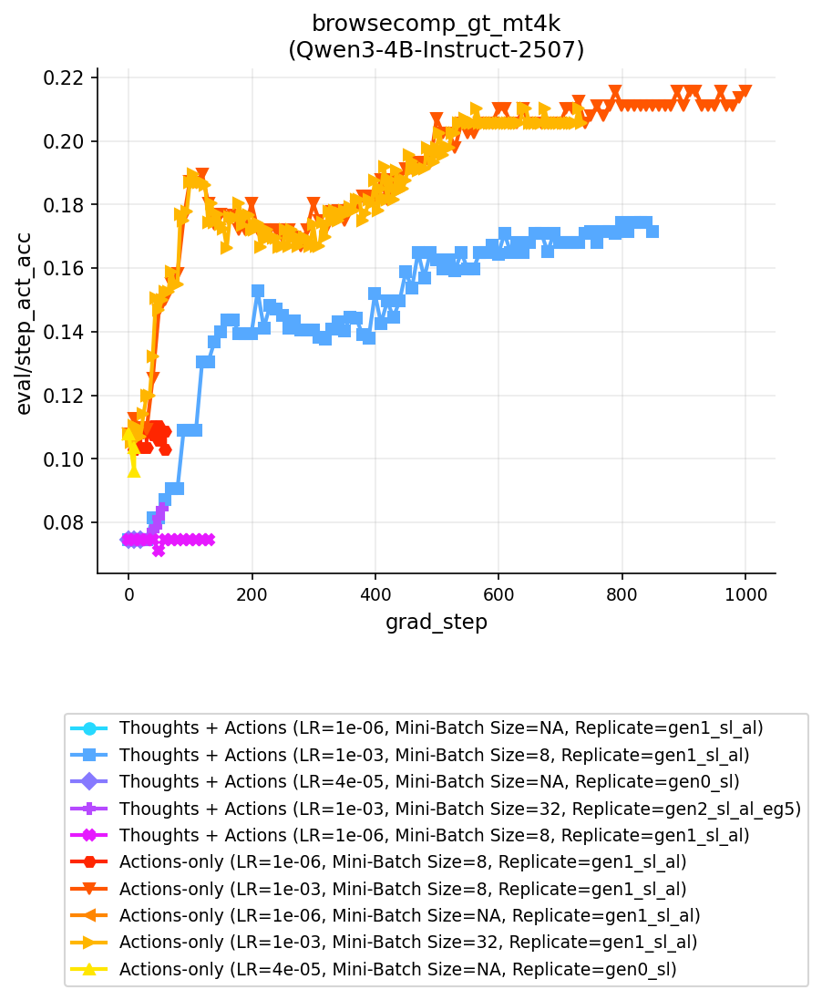

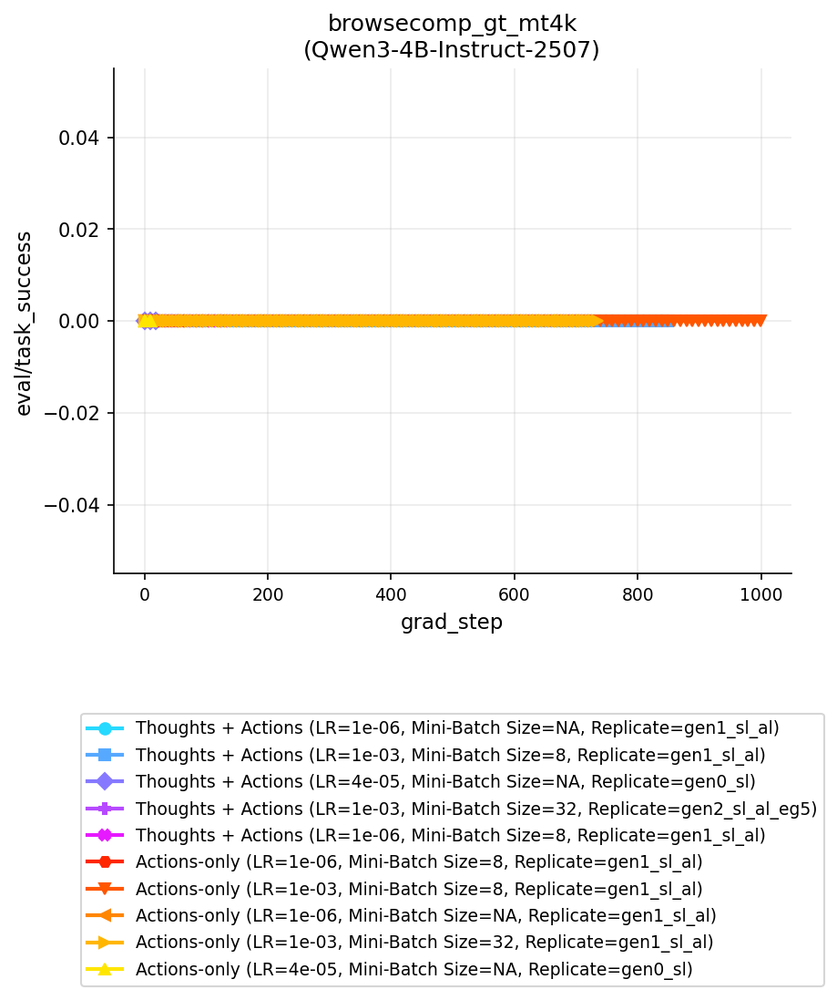

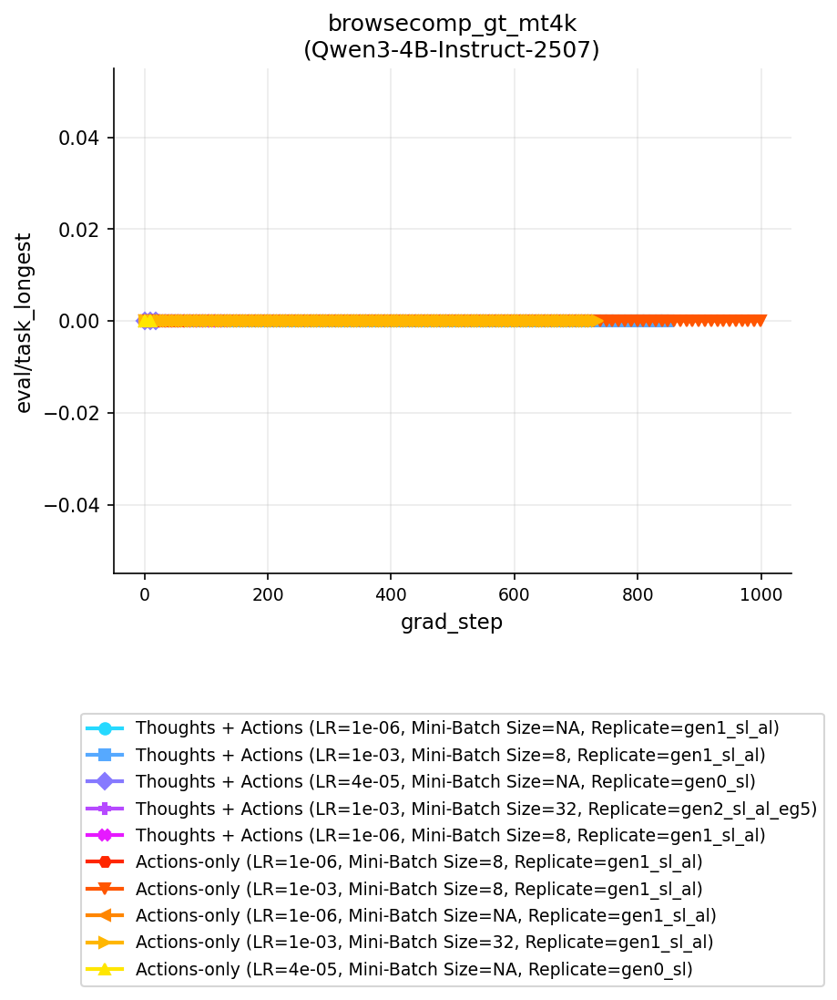

In [68]:
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_8B")

verbose_labels = True

FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files['jsonl'][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]
# eval_gen_cols, eval_lm_cols

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    # Build labels once so we can count cool vs warm
    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    # Optional: reset marker index per-figure
    marker_idx = 0

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception as e:
            # print(f"Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`\n{e.__class__.__name__}: {e}")
            # print(f"df.columns: {df.columns}")
            # Try to reconcile keys
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        # df = df.rename(columns={k: v})
                        df[v] = df[k]
                    elif v in df.columns:  # reverse mapping
                        # df = df.rename(columns={v: k})
                        df[k] = df[v]
                        
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print("Error with `df.rename(columns={KEY_MAP_FWD.items()})`")
                print(f"{e.__class__.__name__}: {e}")
                print(f"df.columns: {df.columns}")
                print(f"Offending file: {fname}")
                display(df.head())         
        label = labels[_idx]

        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=get_color(label),
        )
        marker_idx += 1

    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    # center-bottom legend (inside)
    y_anchor = -len(labels) / 6 * 0.5
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),   # x=middle, y=just above bottom
        # ncol=2,                       # optional: wrap into multiple columns
        ncol=1,
        frameon=True,
    )

    plt.show()
    plt.close()

In [73]:
p

PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-acon=1-hiob=1-lera=4e_05-se=0-re=gen0_sl/metrics.jsonl')

In [77]:
valid_metrics_files

{'jsonl': [PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-hiob=1-lera=1e_06-se=0-re=gen1_sl_al/metrics.jsonl'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-hiob=1-lera=4e_05-se=0-re=gen0_sl/metrics.jsonl'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3

In [83]:
valid_metrics_files

{'csv': [PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-acon=1-hiob=

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,1.827827,0.0,0.0,0.0,6.220353,0.160763,6.220353,0.0,./logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-...,3.906250,49.7500,0.205891,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.343750,77.0000,0.150095,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.500000,12.1875,0.656100,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.406250,82.0000,1.000000,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.109375,8.2500,0.656100,NaN,NaN,NaN,NaN


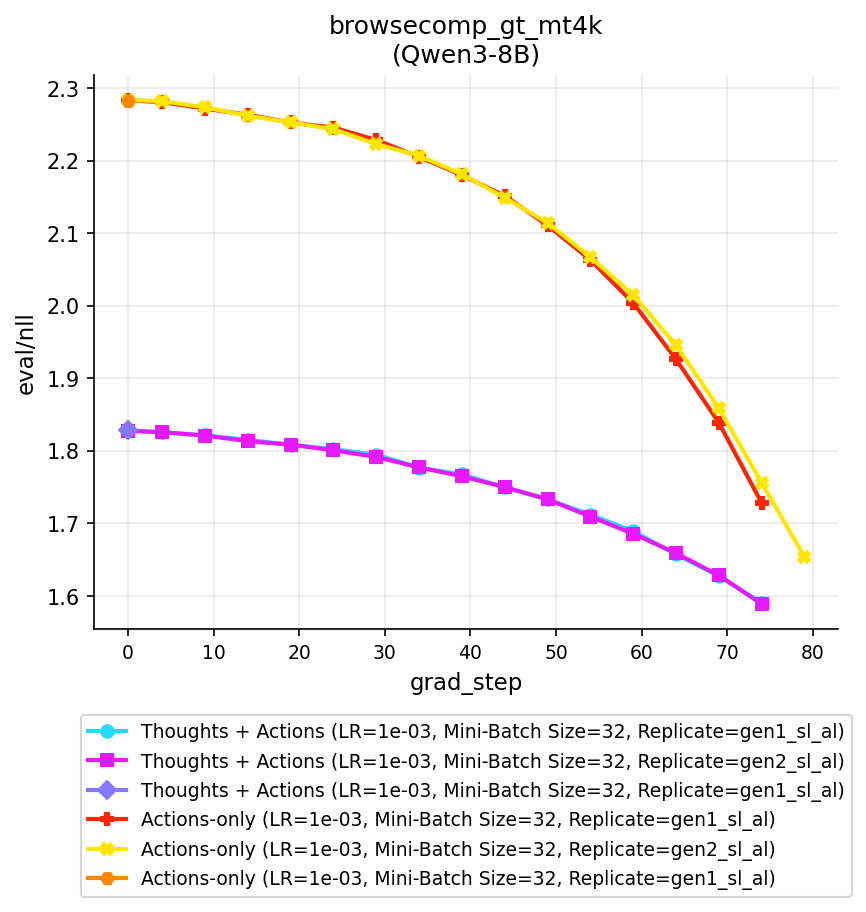

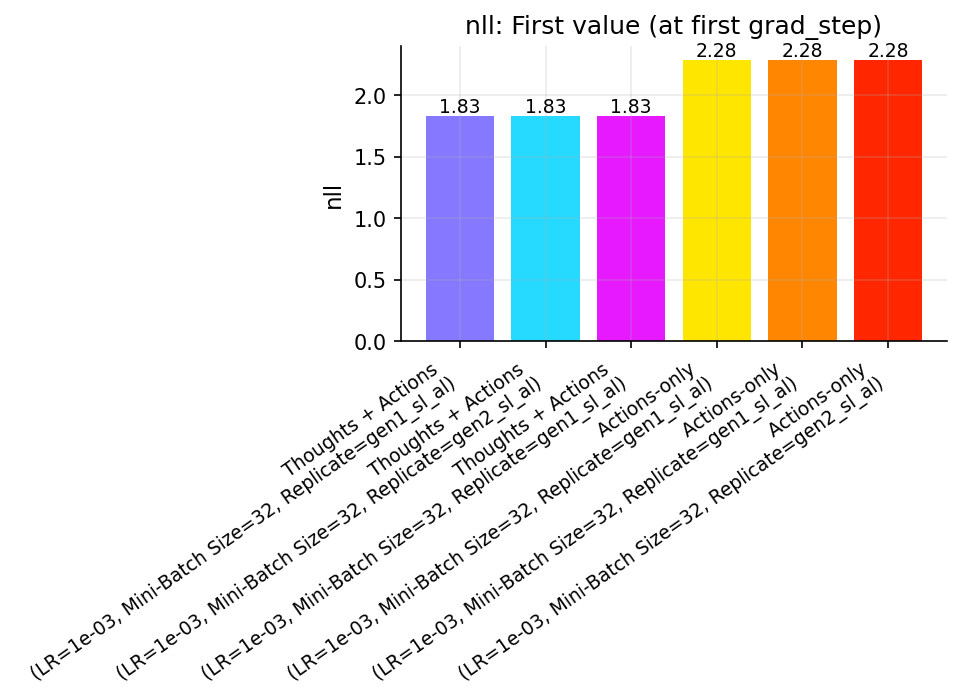

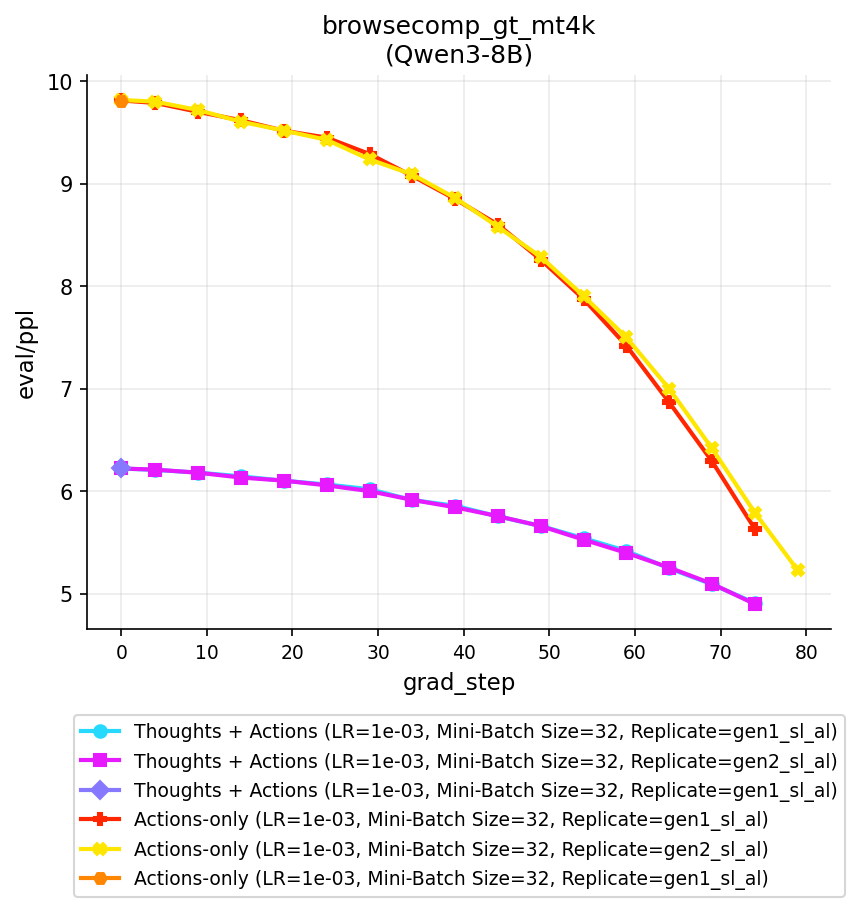

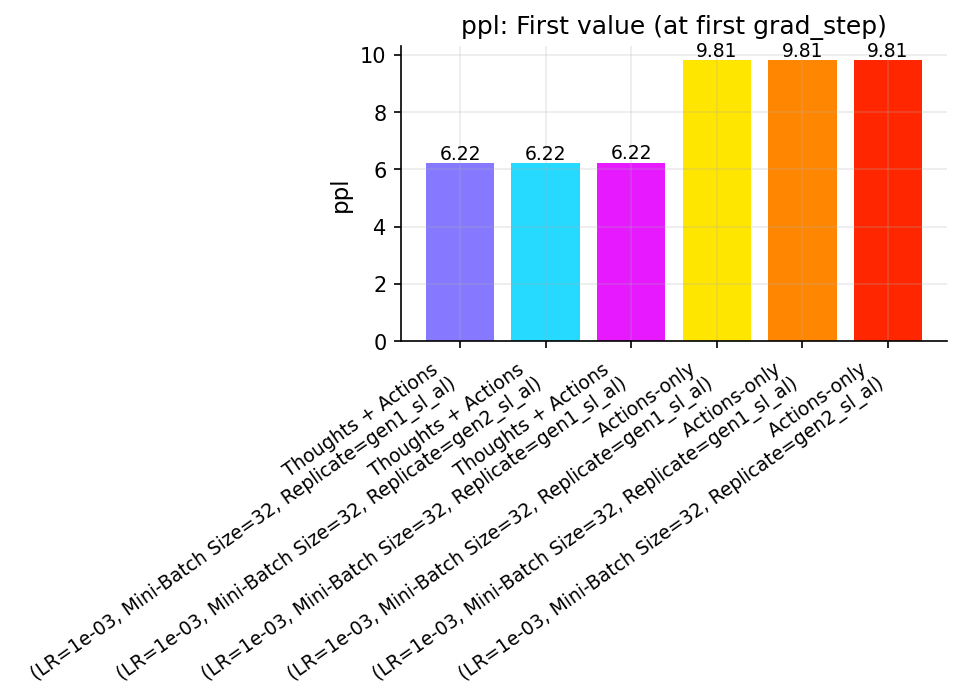

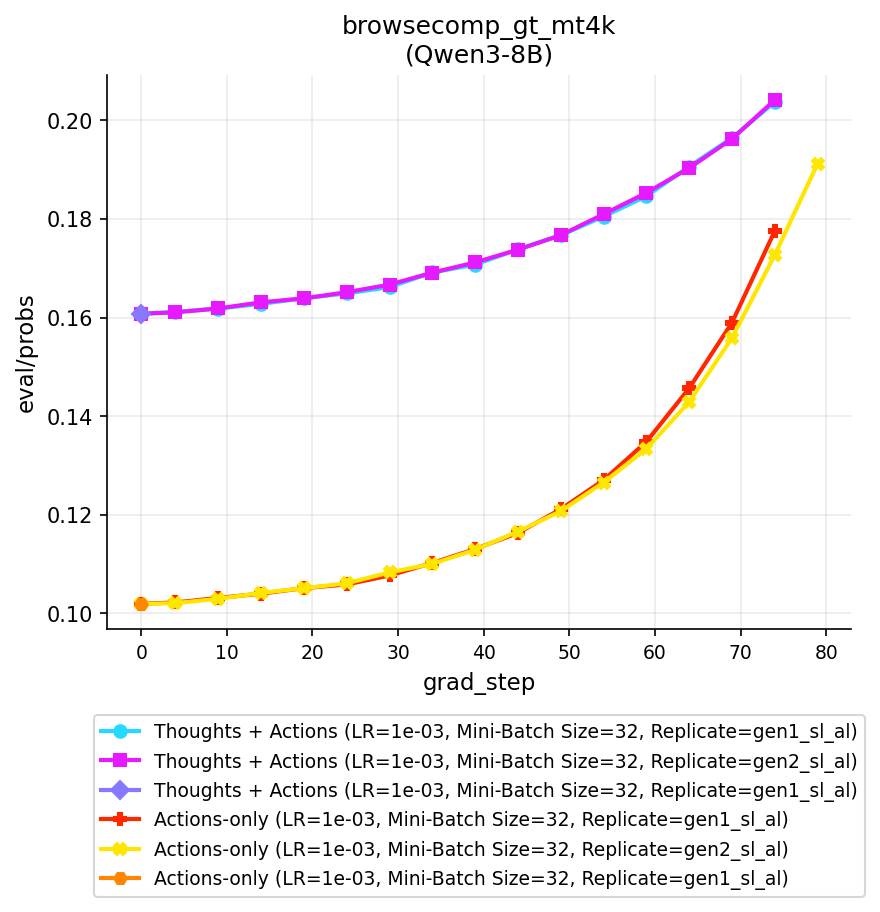

...

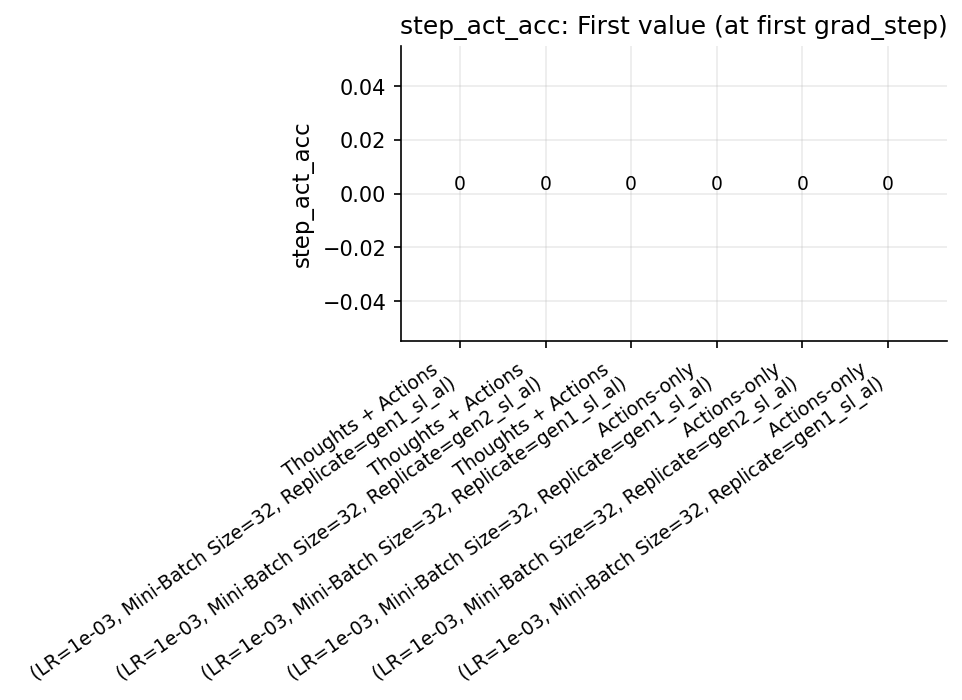

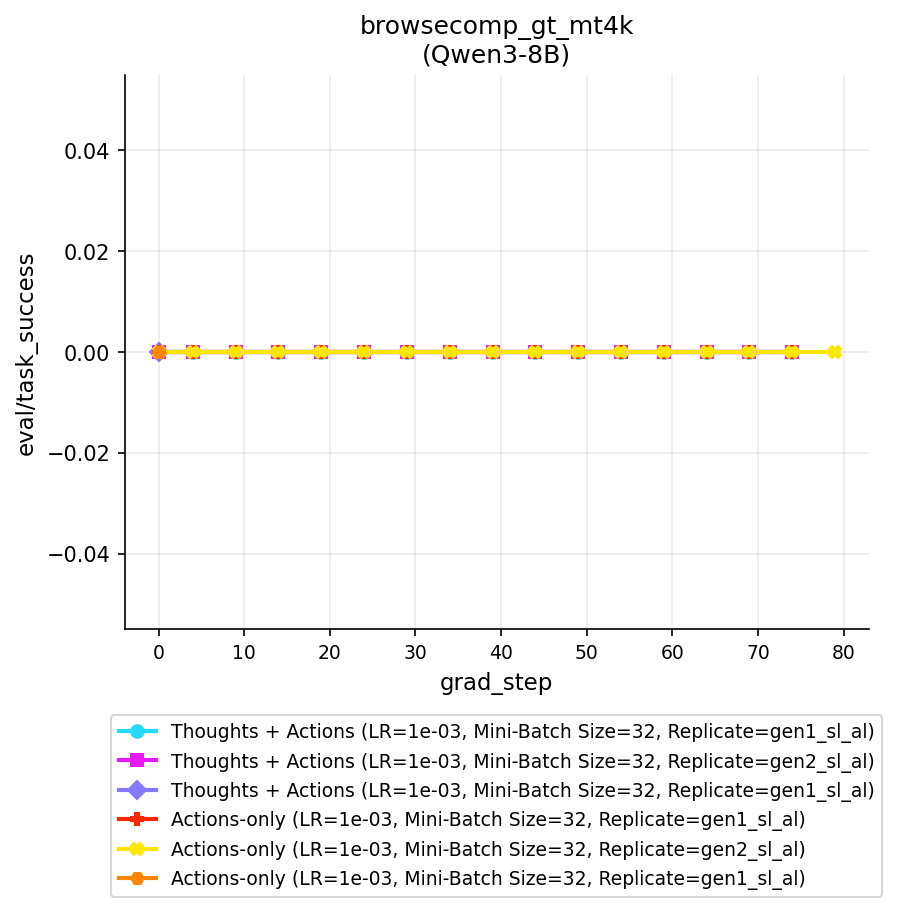

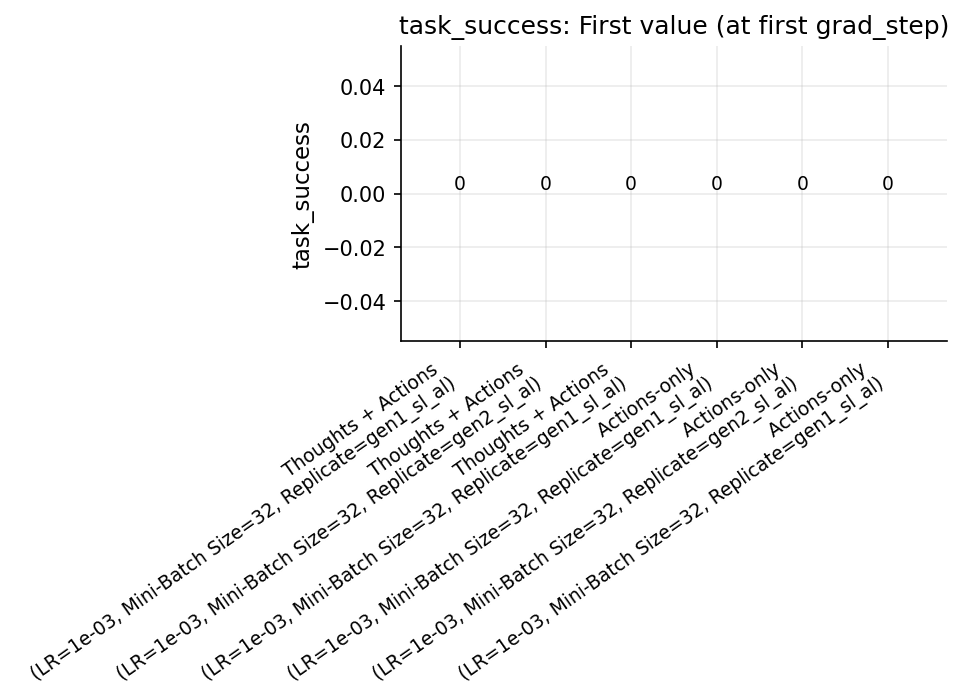

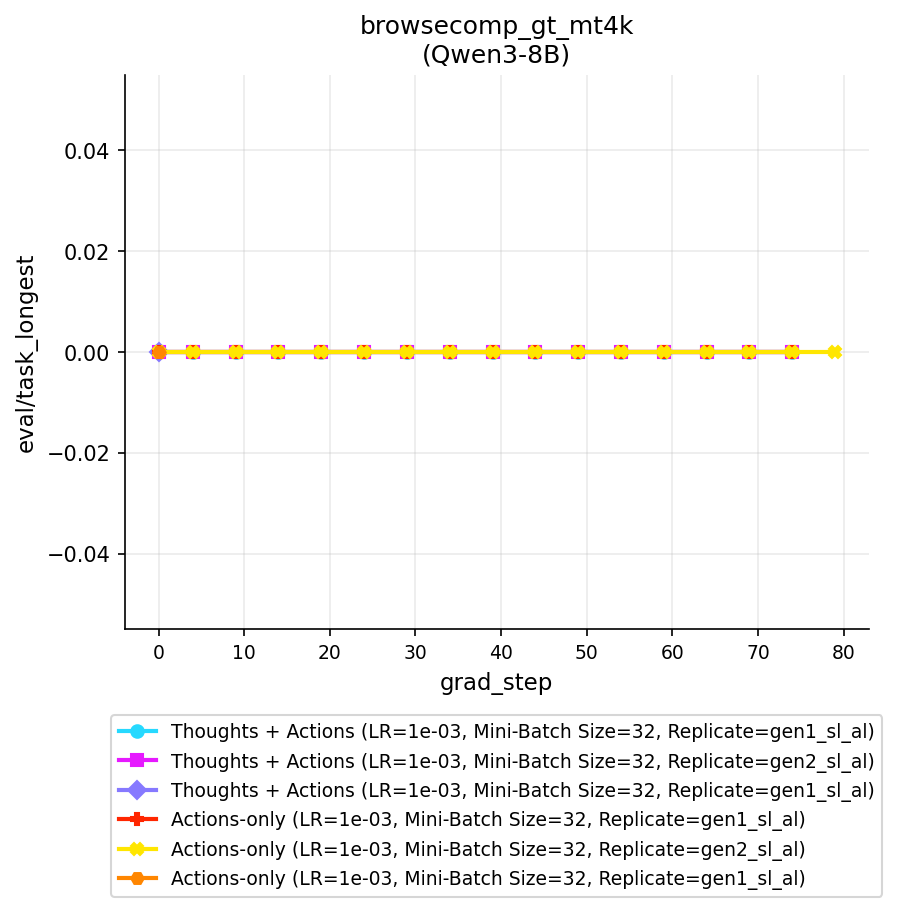

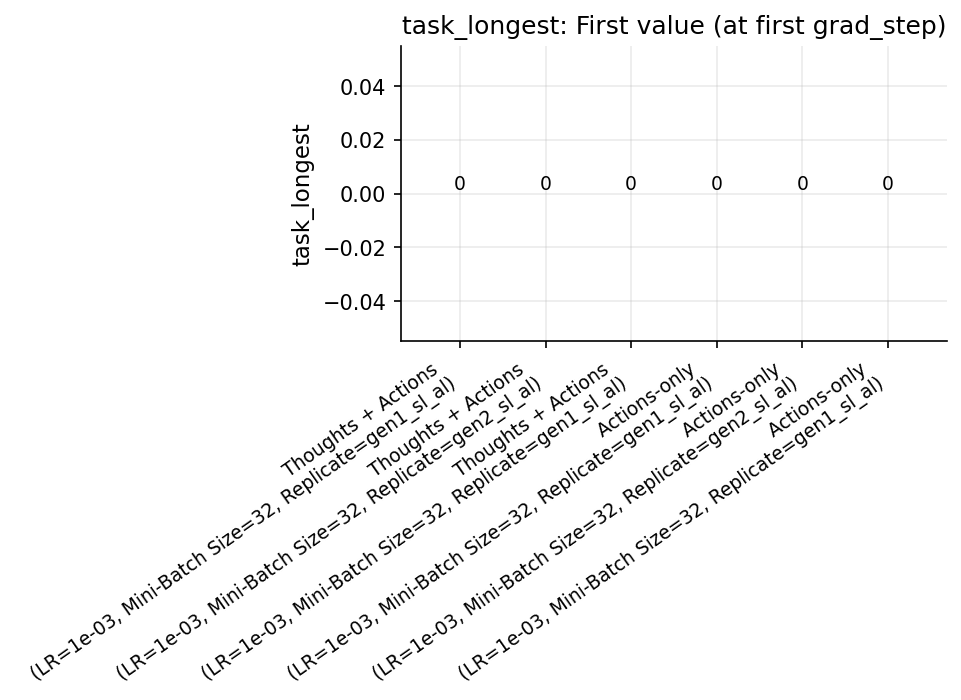

In [82]:
import numpy as np

# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_8B")

verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind) and "lera=0_001" in str(p):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=get_color(label),
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            bar_colors.append(get_color(label))  # use same palette logic per label
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            bar_colors.append(get_color(label))

    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) / 6 * 0.5
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar chart of first values ----
    # Filter out NaNs
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v)]
    if len(keep) == 0:
        continue

    # Optional: sort bars by value (makes comparison easier)
    order = sorted(keep, key=lambda i: first_vals[i])

    # fig, ax = plt.subplots(figsize=(8.0, 3.8))
    fig, ax = plt.subplots()
    x = np.arange(len(order))

    if BARCHART_TYPE == "first":
        vals = [first_vals[i] for i in order]
        steps = [first_steps[i] for i in order]
    else:
        vals = [last_vals[i] for i in order]
        steps = [last_steps[i] for i in order]
    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Split labels across multiple lines
    lbls = [lbl.replace("(", "\n(") for lbl in lbls]

    ax.bar(x, vals, color=cols)
    ax.set_title(f"{key.replace('eval/', '')}: {BARCHART_TYPE.capitalize()} value (at {BARCHART_TYPE} grad_step)")
    ax.set_ylabel(key.replace("eval/", ""))
    ax.set_xticks(x)
    ax.set_xticklabels(lbls, rotation=35, ha="right")

    # Print/annotate the value on top of each bar (what you asked for)
    for xi, v in zip(x, vals):
        ax.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)

    # Optional: also print which grad_step each “first value” came from
    # (useful if different runs start at different steps)
    # for xi, st in zip(x, steps):
    #     ax.text(xi, ax.get_ylim()[0], f"step={st:.0f}", ha="center", va="bottom", fontsize=8, rotation=90)

    fig.tight_layout()
    plt.show()
    plt.close(fig)


## Explore CSV data

In [85]:
valid_metrics_files["csv"]

[PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
 PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al/eval_lm_action_metrics.csv'),
 PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/eval_lm_action_metrics.csv'),
 PosixPath('../logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_8b-loco=r8_a16_qkvo-gracst=32-mainidle=2048-acon=1-hiob=1-lera=0_00

In [84]:
pd.read_csv(valid_metrics_files["csv"][0])

,train_step_idx,train_eval_idx,rollout_task_idx,task_idx,rollout_action_nll,rollout_action_ppl,rollout_action_correct,rollout_action_timestep
0,0,0,0,0,216.000,29.250000,0.0,0
1,0,0,0,0,65.000,5.812500,0.0,1
2,0,0,0,0,38.000,4.093750,0.0,2
3,0,0,0,0,115.000,26.625000,0.0,3
4,0,0,0,0,8.375,1.351562,0.0,4
...,...,...,...,...,...,...,...,...
5248,79,79,21,21,10.250,1.460938,0.0,9
5249,79,79,21,21,30.250,2.046875,0.0,10
5250,79,79,21,21,20.500,2.140625,0.0,11
5251,79,79,21,21,19.750,3.203125,0.0,12


In [94]:
_df = pd.read_csv(valid_metrics_files["csv"][0])

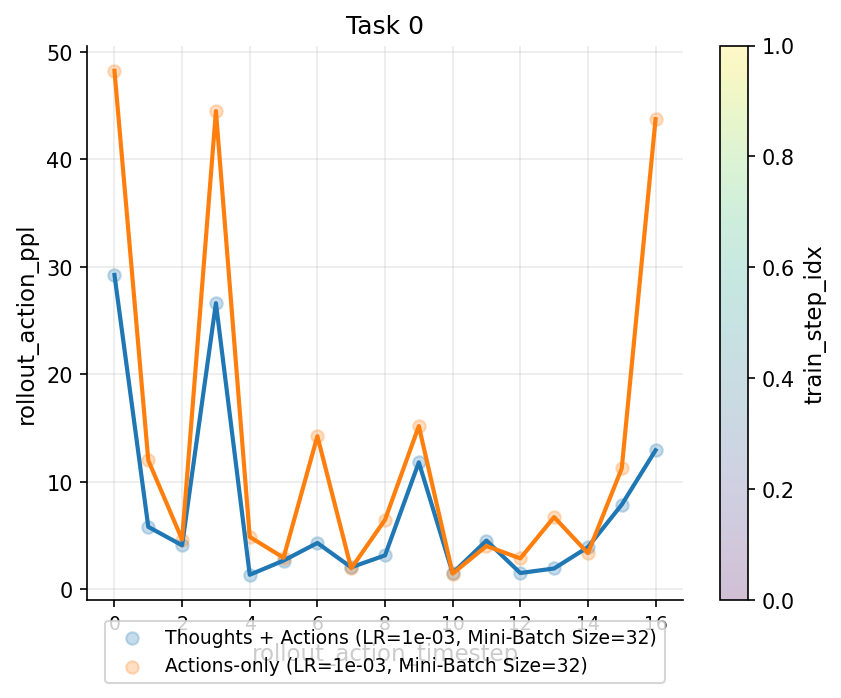

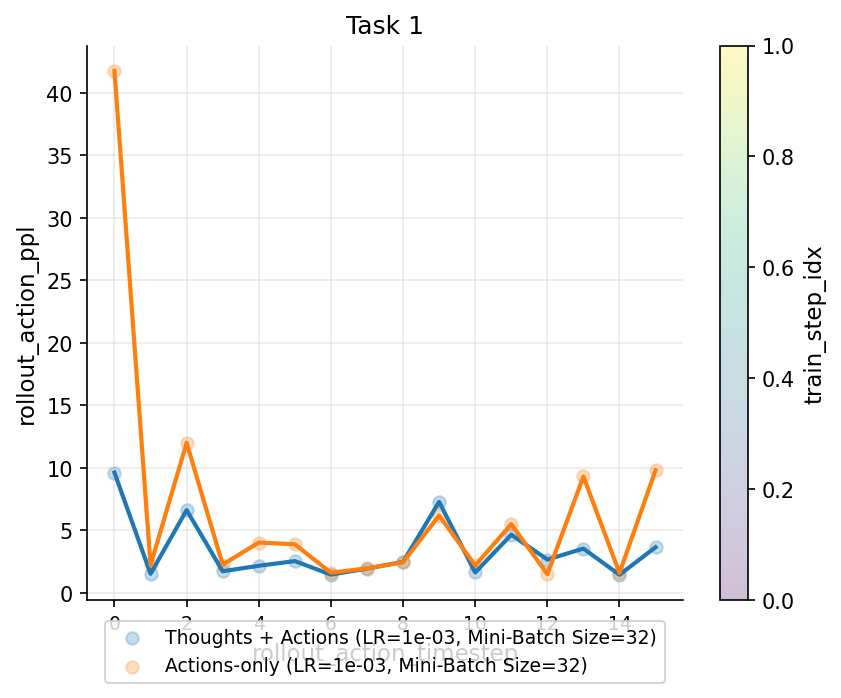

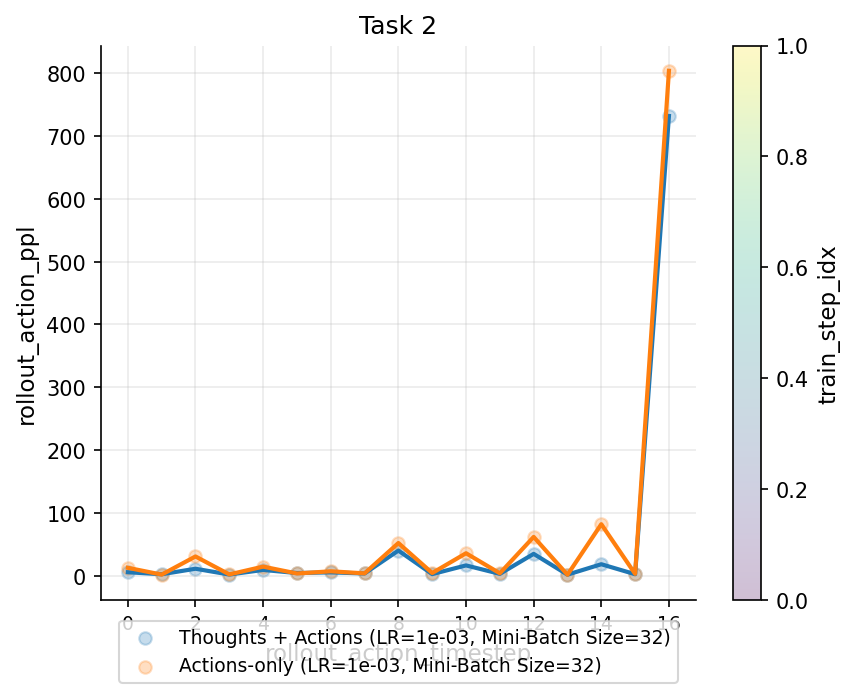

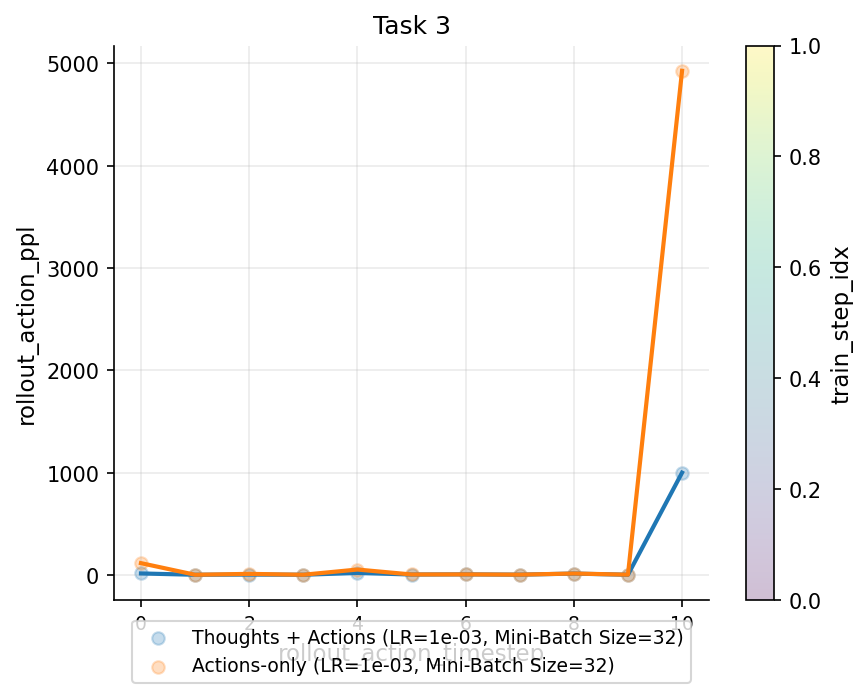

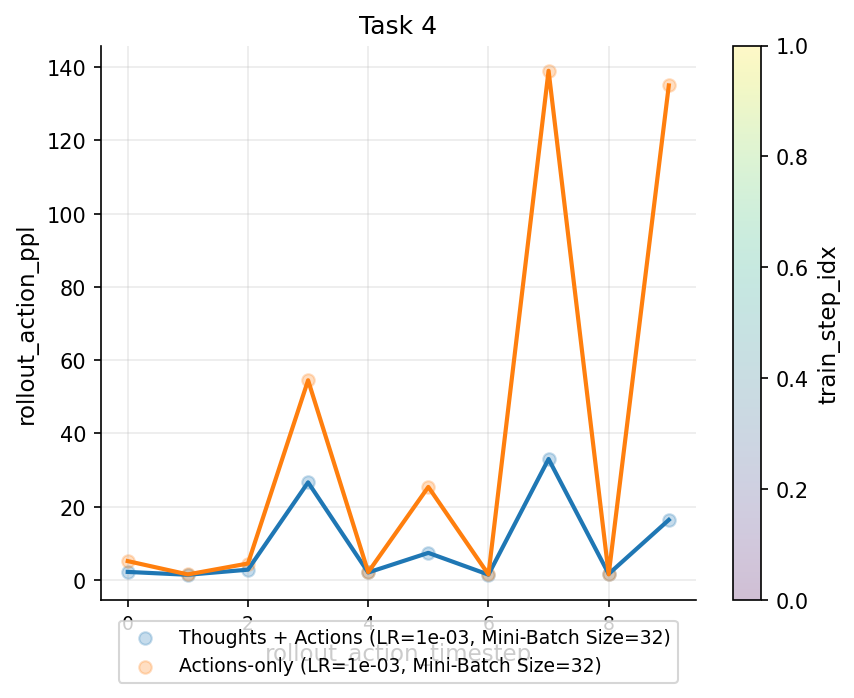

...

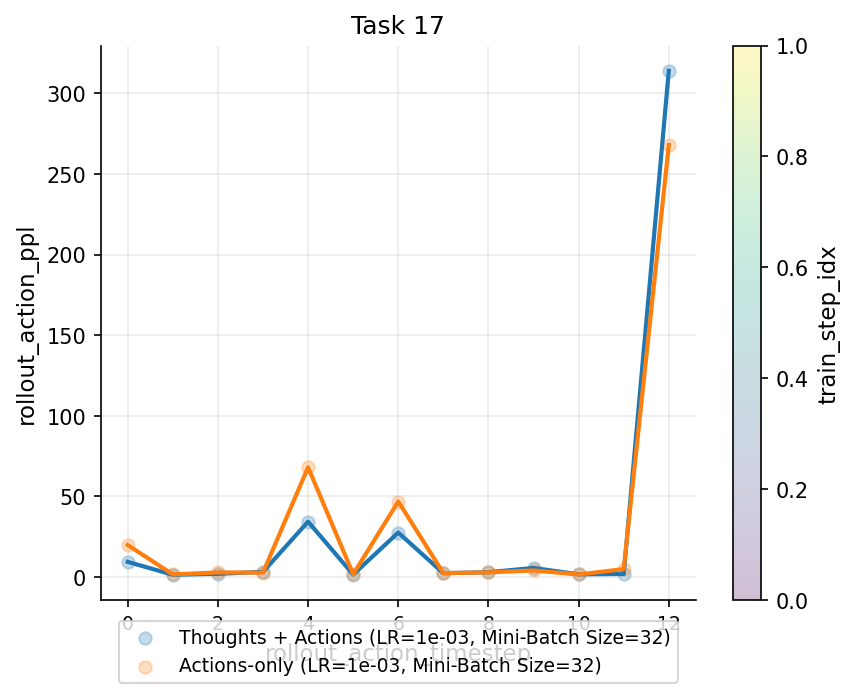

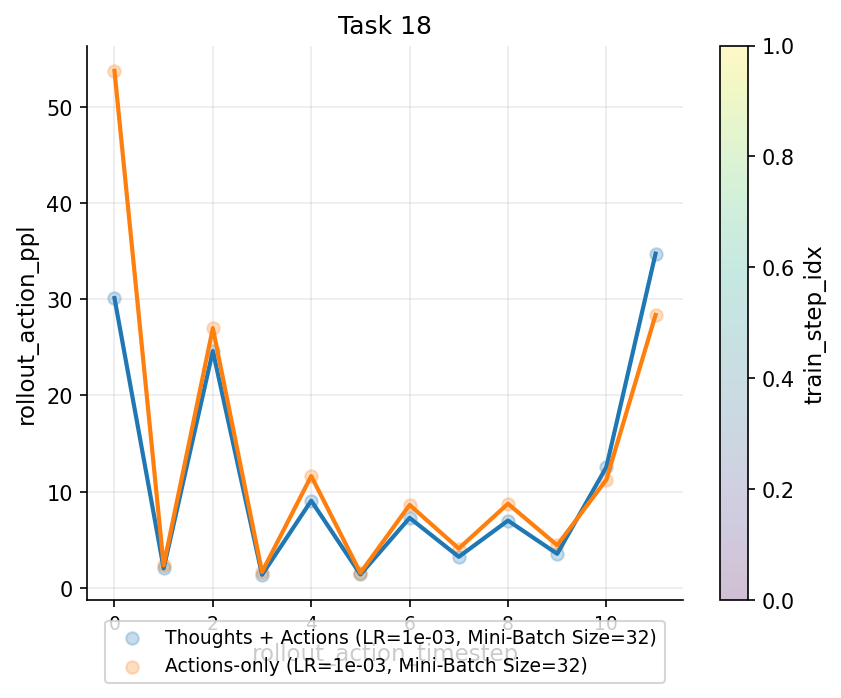

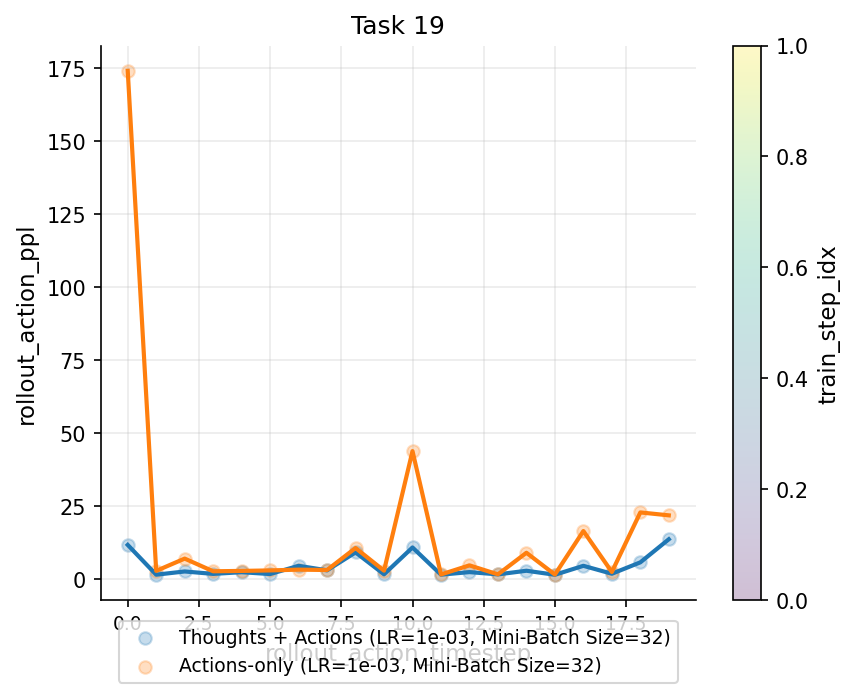

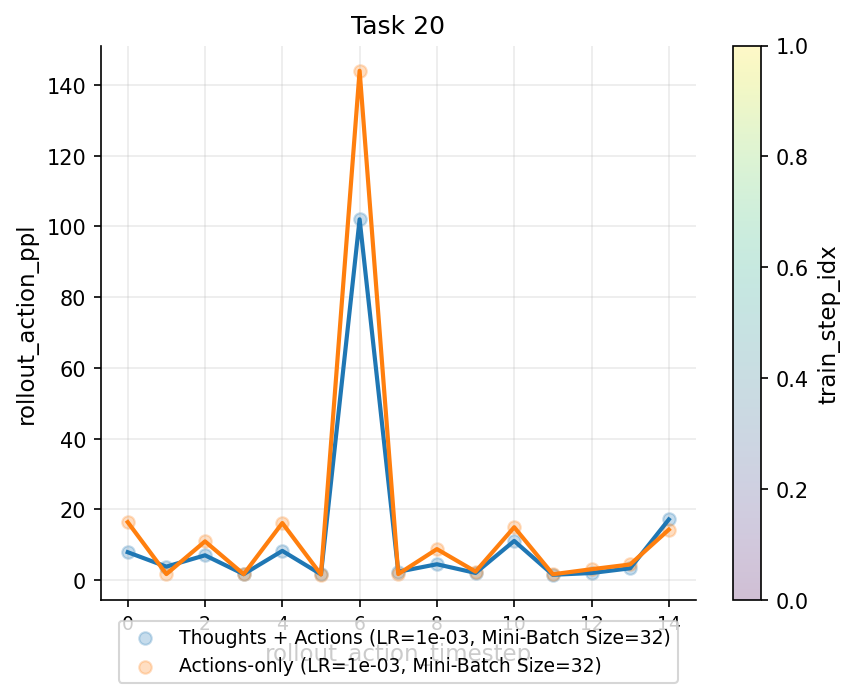

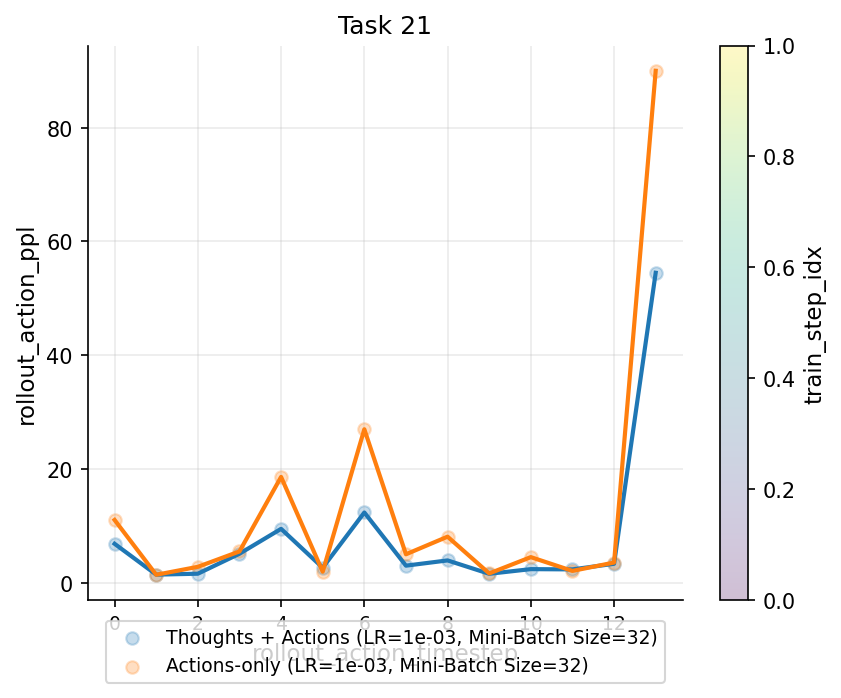

In [111]:
_x_label = "rollout_action_timestep"
# _y_label = "rollout_action_nll"
_y_label = "rollout_action_ppl"
_c_label = "train_step_idx"

verbose_labels = True

_valid_metrics_files = [f for f in valid_metrics_files["csv"] if "re=gen2" in str(f)]

task_indices = pd.read_csv(_valid_metrics_files[0])["task_idx"].unique()
names = unique_ids_from_strings(_valid_metrics_files)
labels = []
for _idx, fname in enumerate(_valid_metrics_files):
    _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
    labels.append(_name)

n_cool = sum("Thoughts" in s for s in labels)
n_warm = len(labels) - n_cool
get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

for _task_idx in task_indices:
    for _idx, path_df in enumerate(_valid_metrics_files):
        label = labels[_idx]
        # color = get_color(label)
        color = "tab:blue" if "Thoughts" in label else "tab:orange"
        _df = pd.read_csv(path_df)
        _df = _df[_df["train_step_idx"] == 0]
        _df_task = _df[_df["task_idx"] == _task_idx]
        # _df_task = _df
        plt.scatter(_df_task[_x_label], _df_task[_y_label], label=label, color=color, alpha=0.25)  # c=_df_task[_c_label], 
        _df_task_mean = _df_task.groupby(_x_label).mean().reset_index()
        plt.plot(_df_task_mean[_x_label], _df_task_mean[_y_label], color=color)
    
    plt.title(f"Task {_task_idx}")
    plt.xlabel(_x_label)
    plt.ylabel(_y_label)
    plt.colorbar(label=_c_label)
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, -len(labels) / 6 * 0.5),
        ncol=1,
        frameon=True,
    )
    plt.show()


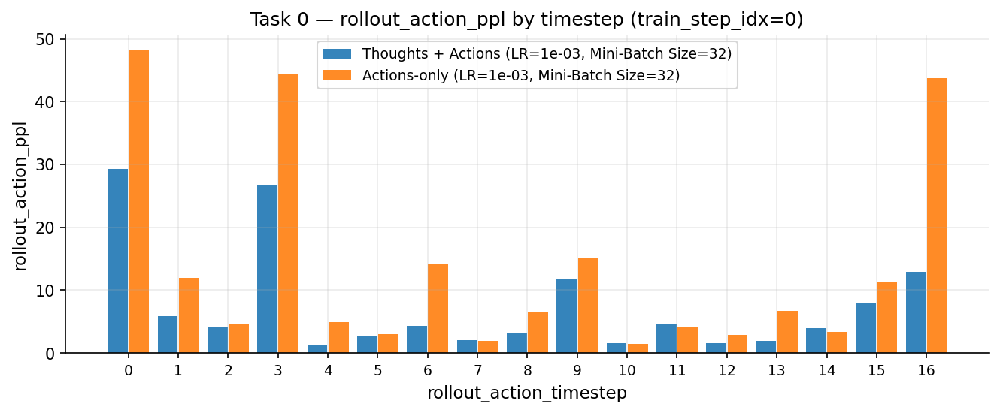

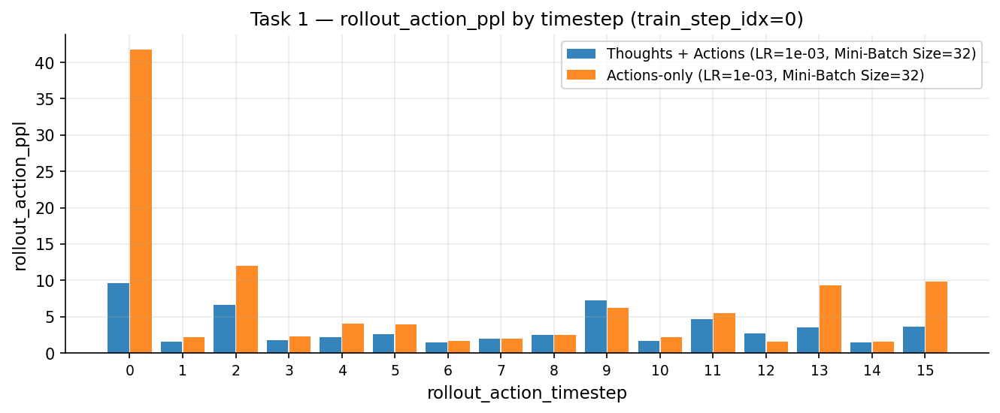

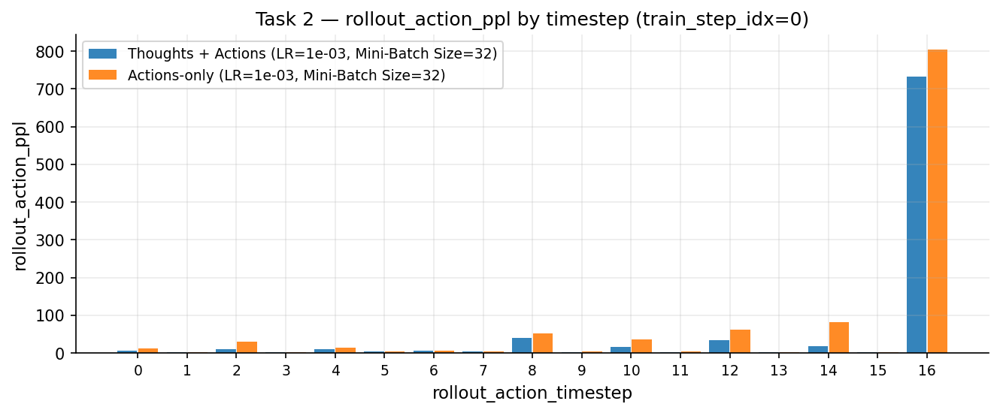

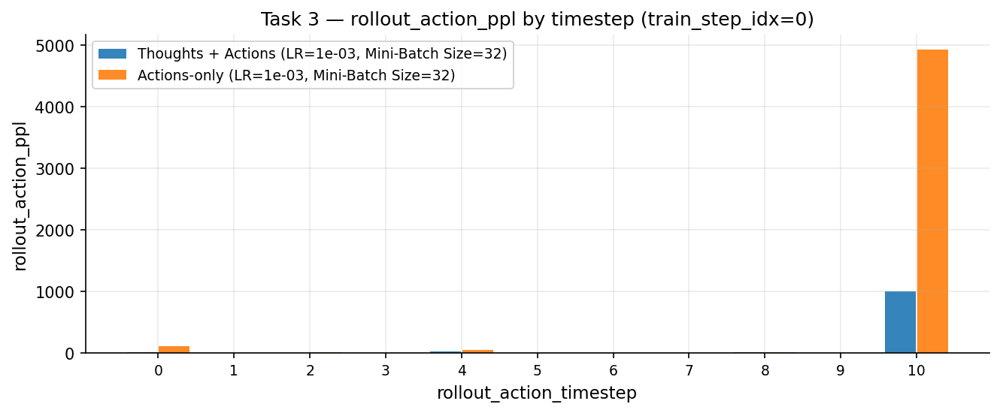

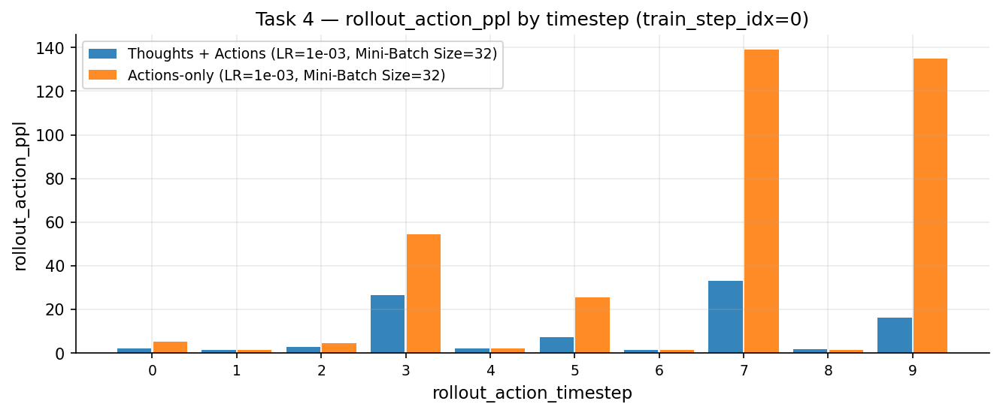

...

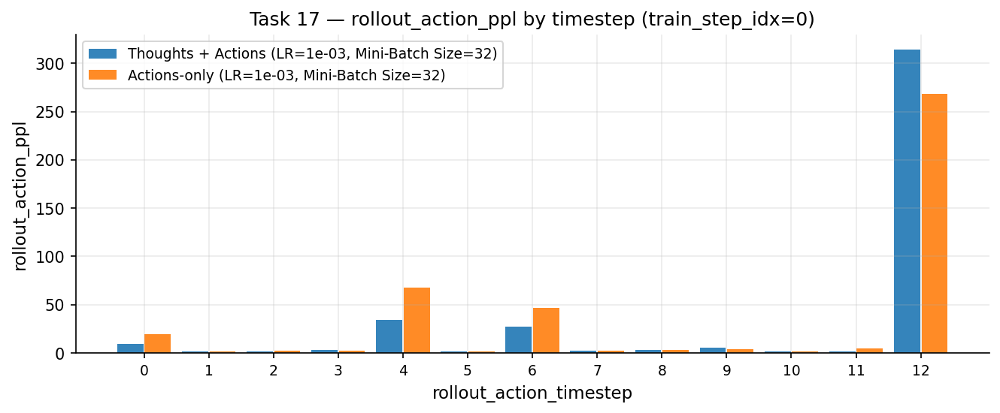

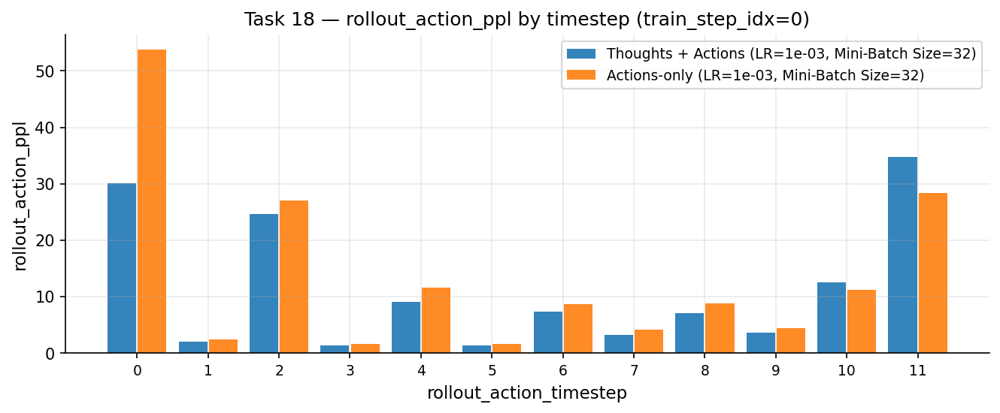

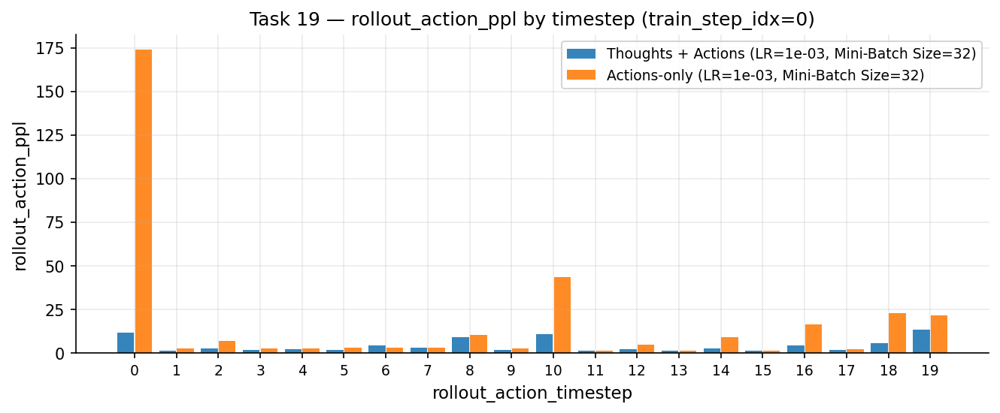

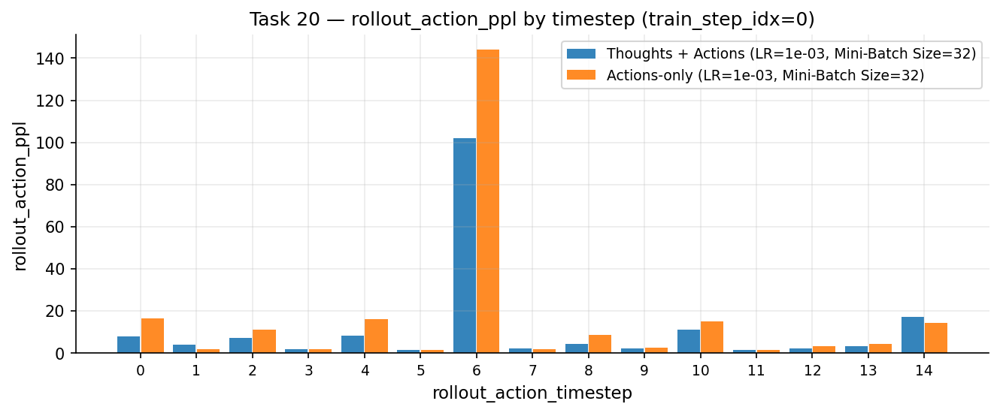

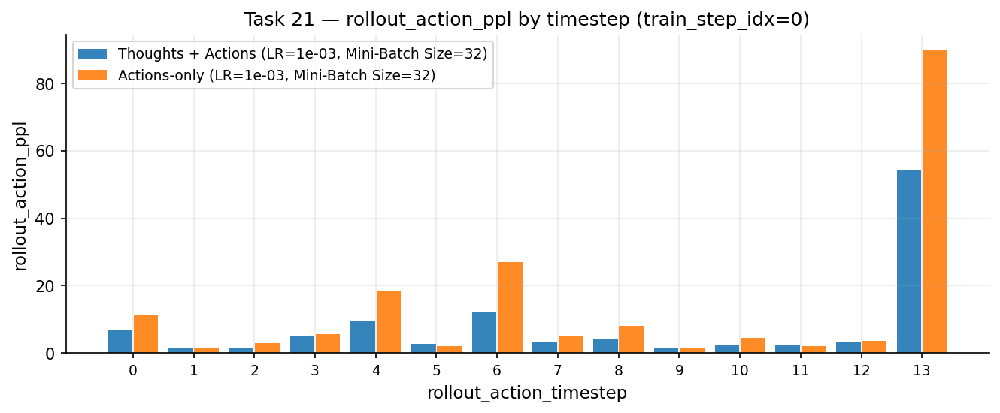

In [113]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

_x_label = "rollout_action_timestep"
_y_label = "rollout_action_ppl"
_c_label = "train_step_idx"  # not used for bar charts (no colorbar)

verbose_labels = True
_valid_metrics_files = [f for f in valid_metrics_files["csv"] if "re=gen2" in str(f)]

task_indices = pd.read_csv(_valid_metrics_files[0])["task_idx"].unique()

names = unique_ids_from_strings(_valid_metrics_files)
labels = [get_name_from_uid(names[i], verbose=verbose_labels) for i in range(len(_valid_metrics_files))]

def color_for_label(label: str) -> str:
    return "tab:blue" if "Thoughts" in label else "tab:orange"

# If you want consistent ordering by timestep:
def get_timesteps_for_task(task_idx: int) -> np.ndarray:
    df0 = pd.read_csv(_valid_metrics_files[0])
    df0 = df0[(df0["train_step_idx"] == 0) & (df0["task_idx"] == task_idx)]
    return np.sort(df0[_x_label].unique())

for _task_idx in task_indices:
    timesteps = get_timesteps_for_task(_task_idx)
    if len(timesteps) == 0:
        continue

    # one group per timestep, k bars per group
    k = len(_valid_metrics_files)
    x = np.arange(len(timesteps))

    # spacing within each group
    group_width = 0.85
    bar_width = group_width / max(k, 1)
    offsets = (np.arange(k) - (k - 1) / 2.0) * bar_width  # centered around each tick

    fig, ax = plt.subplots(figsize=(9.0, 3.8))

    for i, path_df in enumerate(_valid_metrics_files):
        label = labels[i]
        color = color_for_label(label)

        df = pd.read_csv(path_df)
        df = df[(df["train_step_idx"] == 0) & (df["task_idx"] == _task_idx)]

        if df.empty:
            continue

        # Aggregate per timestep
        g = df.groupby(_x_label)[_y_label]
        mean = g.mean()
        std = g.std()  # optional error bars

        # Align to the common timestep axis (fill missing with NaN so bars just disappear)
        y_mean = np.array([mean.get(t, np.nan) for t in timesteps], dtype=float)
        y_std  = np.array([std.get(t, np.nan) for t in timesteps], dtype=float)

        # Bars (with optional error bars)
        ax.bar(
            x + offsets[i],
            y_mean,
            width=bar_width * 0.95,
            label=label,
            color=color,
            yerr=y_std,              # comment out if you don't want error bars
            capsize=2,               # comment out if you don't want error bars
            alpha=0.9,
        )

    ax.set_title(f"Task {_task_idx} — {_y_label} by timestep (train_step_idx=0)")
    ax.set_xlabel(_x_label)
    ax.set_ylabel(_y_label)

    ax.set_xticks(x)
    ax.set_xticklabels(timesteps)  # or rotation=45 if crowded
    ax.grid(True, axis="y", alpha=0.25)

    ax.legend(
        # loc="lower center",
        # bbox_to_anchor=(0.5, -0.25),
        ncol=1,
        frameon=True,
    )

    fig.tight_layout()
    plt.show()
    plt.close(fig)


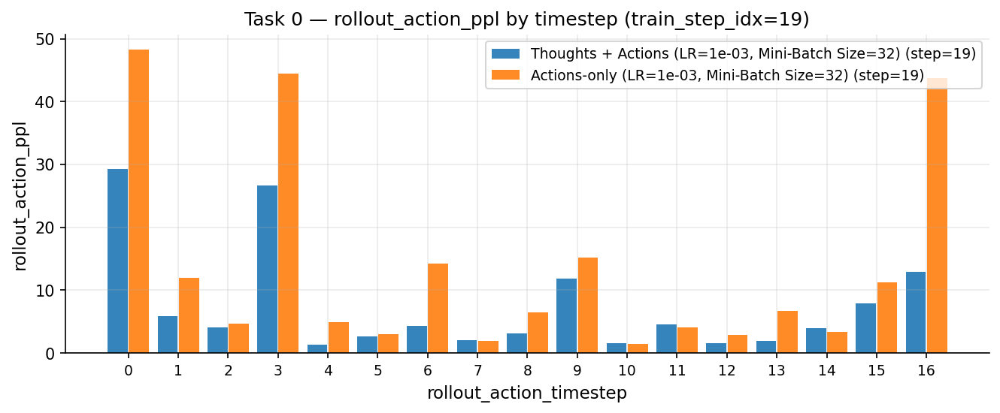

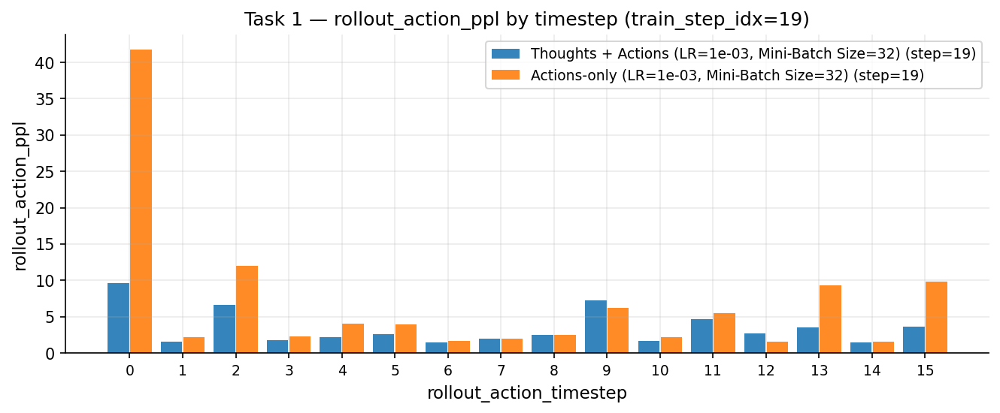

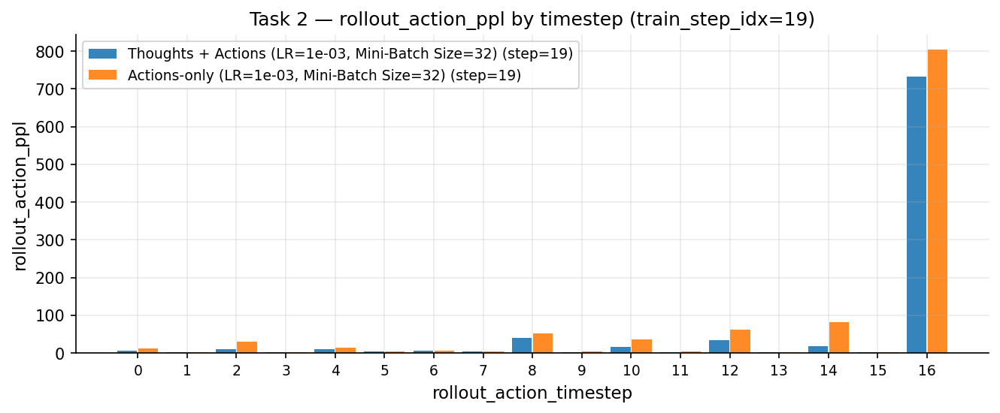

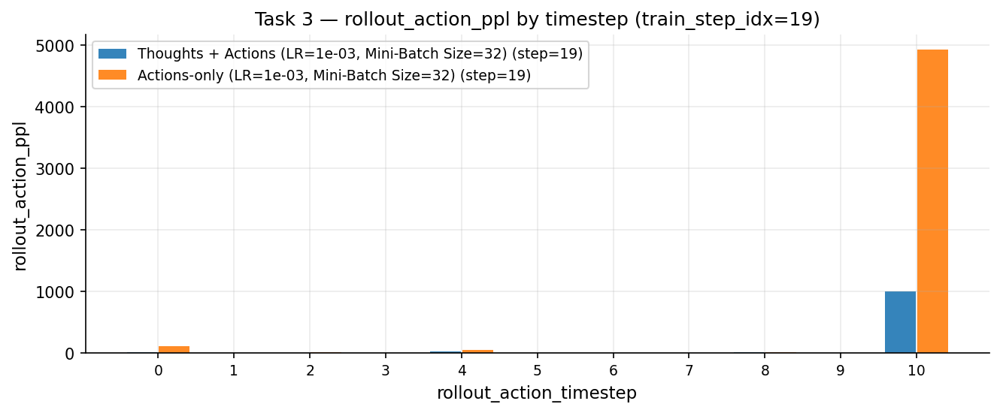

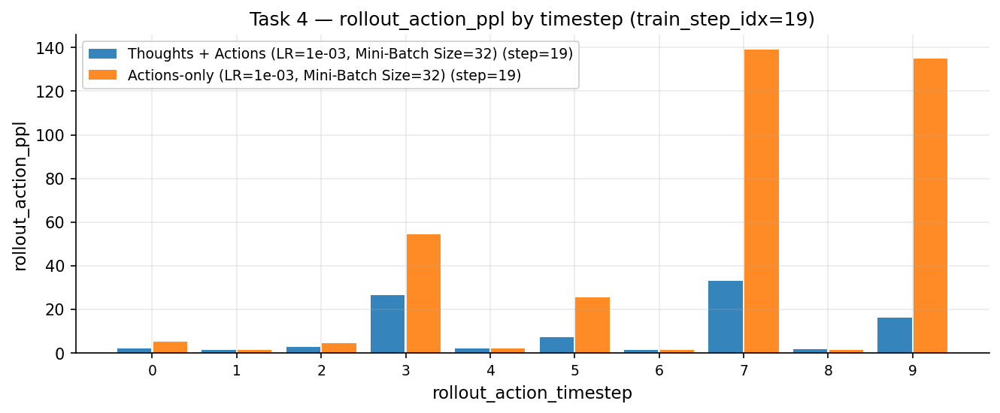

...

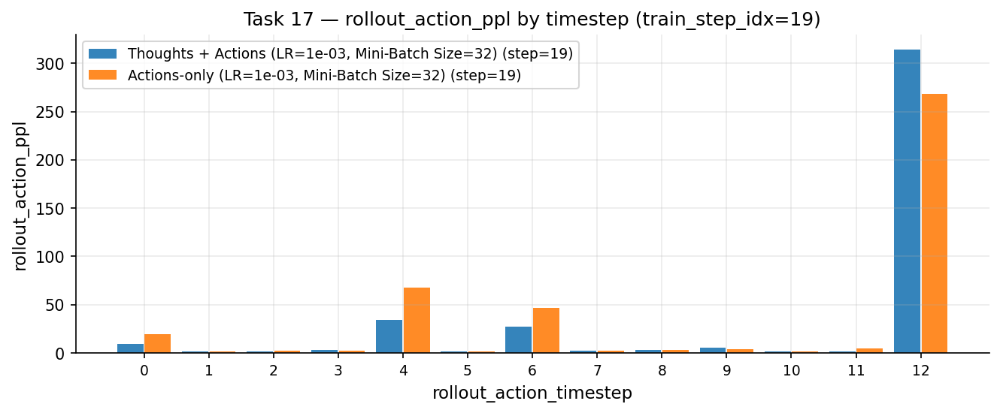

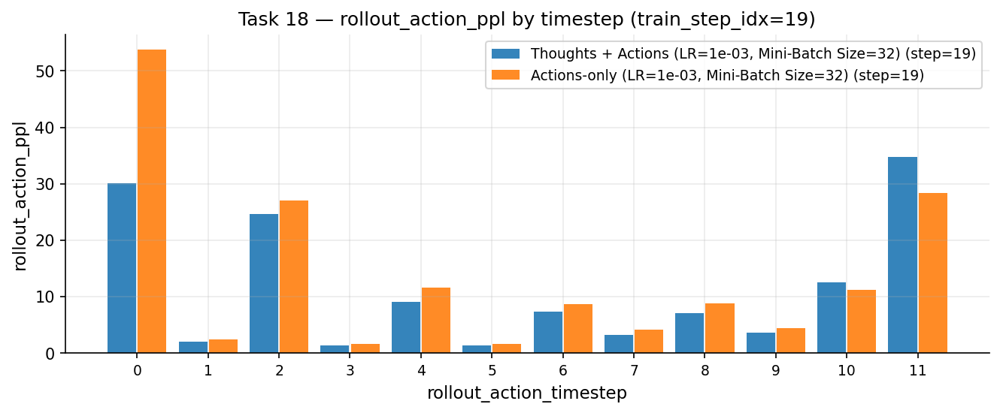

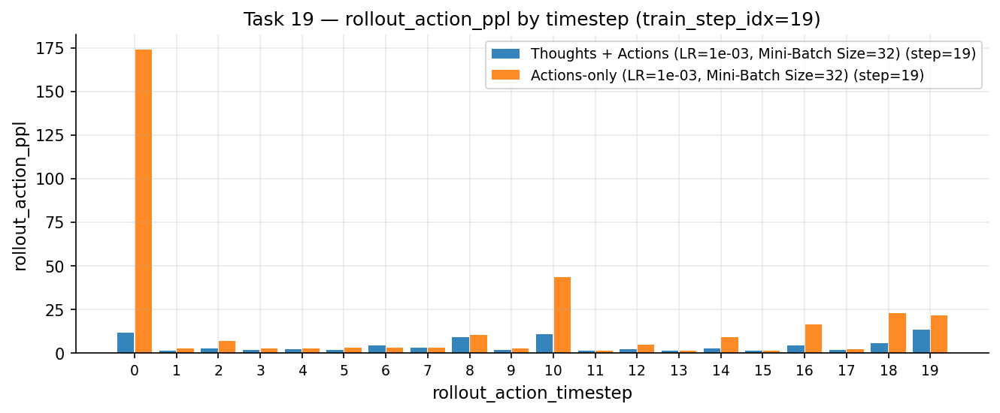

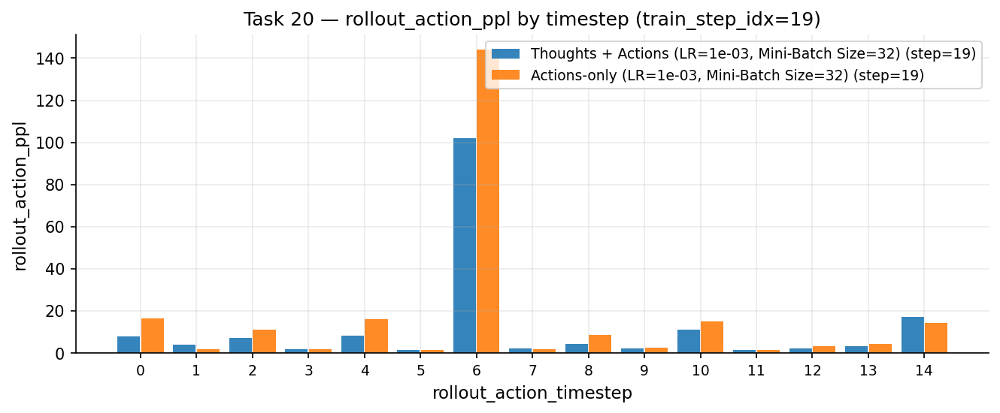

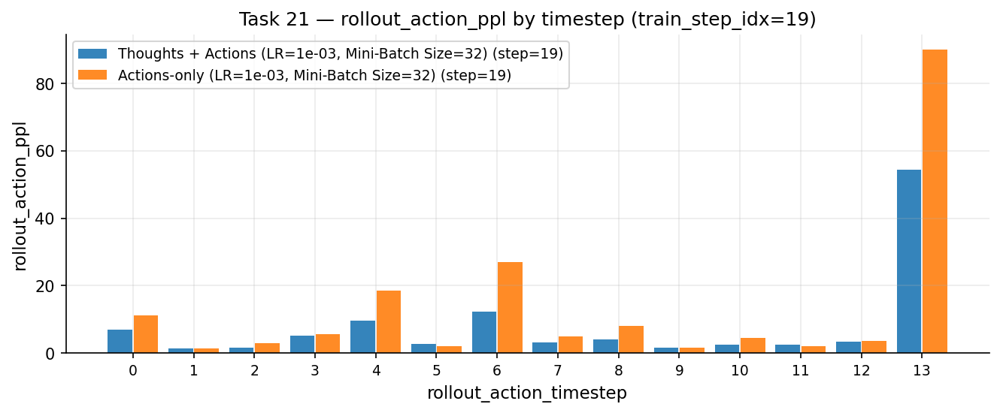

In [115]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

_x_label = "rollout_action_timestep"
_y_label = "rollout_action_ppl"
_c_label = "train_step_idx"  # not used for bar charts (no colorbar)

verbose_labels = True
_valid_metrics_files = [f for f in valid_metrics_files["csv"] if "re=gen2" in str(f)]

task_indices = pd.read_csv(_valid_metrics_files[0])["task_idx"].unique()

names = unique_ids_from_strings(_valid_metrics_files)
labels = [get_name_from_uid(names[i], verbose=verbose_labels) for i in range(len(_valid_metrics_files))]

def color_for_label(label: str) -> str:
    return "tab:blue" if "Thoughts" in label else "tab:orange"

# If you want consistent ordering by timestep:
def get_timesteps_for_task(task_idx: int) -> np.ndarray:
    df0 = pd.read_csv(_valid_metrics_files[0])
    max_timestep = df0[_x_label].max()
    df0 = df0[(df0["train_step_idx"] == max_timestep) & (df0["task_idx"] == task_idx)]
    return np.sort(df0[_x_label].unique()), max_timestep

for _task_idx in task_indices:
    timesteps, max_timestep = get_timesteps_for_task(_task_idx)
    if len(timesteps) == 0:
        continue

    # one group per timestep, k bars per group
    k = len(_valid_metrics_files)
    x = np.arange(len(timesteps))

    # spacing within each group
    group_width = 0.85
    bar_width = group_width / max(k, 1)
    offsets = (np.arange(k) - (k - 1) / 2.0) * bar_width  # centered around each tick

    fig, ax = plt.subplots(figsize=(9.0, 3.8))

    for i, path_df in enumerate(_valid_metrics_files):
        label = labels[i]
        color = color_for_label(label)

        df = pd.read_csv(path_df)
        df = df[(df["train_step_idx"] == 0) & (df["task_idx"] == _task_idx)]

        if df.empty:
            continue

        # Aggregate per timestep
        g = df.groupby(_x_label)[_y_label]
        mean = g.mean()
        std = g.std()  # optional error bars

        # Align to the common timestep axis (fill missing with NaN so bars just disappear)
        y_mean = np.array([mean.get(t, np.nan) for t in timesteps], dtype=float)
        y_std  = np.array([std.get(t, np.nan) for t in timesteps], dtype=float)

        # Bars (with optional error bars)
        ax.bar(
            x + offsets[i],
            y_mean,
            width=bar_width * 0.95,
            label=f"{label} (step={max_timestep})",
            color=color,
            yerr=y_std,              # comment out if you don't want error bars
            capsize=2,               # comment out if you don't want error bars
            alpha=0.9,
        )

    ax.set_title(f"Task {_task_idx} — {_y_label} by timestep (train_step_idx={max_timestep})")
    ax.set_xlabel(_x_label)
    ax.set_ylabel(_y_label)

    ax.set_xticks(x)
    ax.set_xticklabels(timesteps)  # or rotation=45 if crowded
    ax.grid(True, axis="y", alpha=0.25)

    ax.legend(
        # loc="lower center",
        # bbox_to_anchor=(0.5, -0.25),
        ncol=1,
        frameon=True,
    )

    fig.tight_layout()
    plt.show()
    plt.close(fig)


## Textworld

In [116]:
os.listdir(LOG_DIR)

['act_lm_tw_coin',
 'act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k',
 'act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k',
 'act_lm_snorkel_insurance_gt_mt4k',
 'act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k',
 'act_lm_browsecomp_gt_mt4k',
 'act_prm_browsecomp_fs1',
 'act_lm_taubench_airline_gt',
 'act_lm_tw_cooking_fsc_ms1_mt4k',
 'act_prm_taubench_airline_500_fs1',
 'act_prm_taubench_retail_fs1',
 'act_lm_snorkel_finance_aprm_fs1_15',
 'act_lm_taubench_airline_gt_mt4k',
 'act_prm_taubench_airline_fs1',
 'act_lm_snorkel_insurance_gt',
 'act_lm_browsecomp_gt',
 'act_lm_taubench_retail_gt_mt4k',
 'act_lm_snorkel_finance_gt_mt4k_tt',
 'act_prm_taubench_retail_500_fs1',
 'act_prm_taubench_airline_100_fs1',
 'act_prm_taubench_retail_100_fs1',
 'act_prm_snorkel_finance_fs1',
 'act_lm_snorkel_finance_gt',
 'act_lm_tw_treasure',
 'act_lm_snorkel_finance_aprm_fs1_45']

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight
0,0,0,0.071411,0.8875,0.0,8.0,1.074023,0.931079,1.074023,0.0,./logs/act_lm_tw_treasure/Qwen3_4B_Instruct_25...,1.398438,4.062500,0.999976
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.351562,3.859375,0.999978
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.179688,3.250000,0.999979
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.539062,4.656250,0.999979
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.468750,4.343750,0.999975


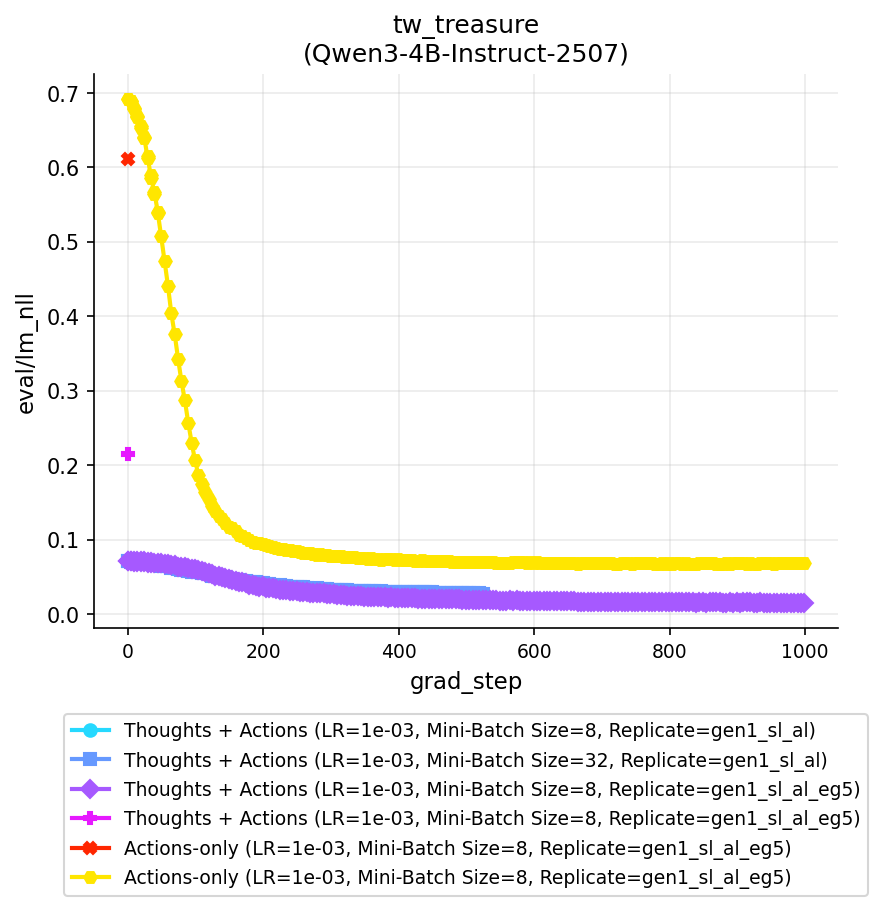

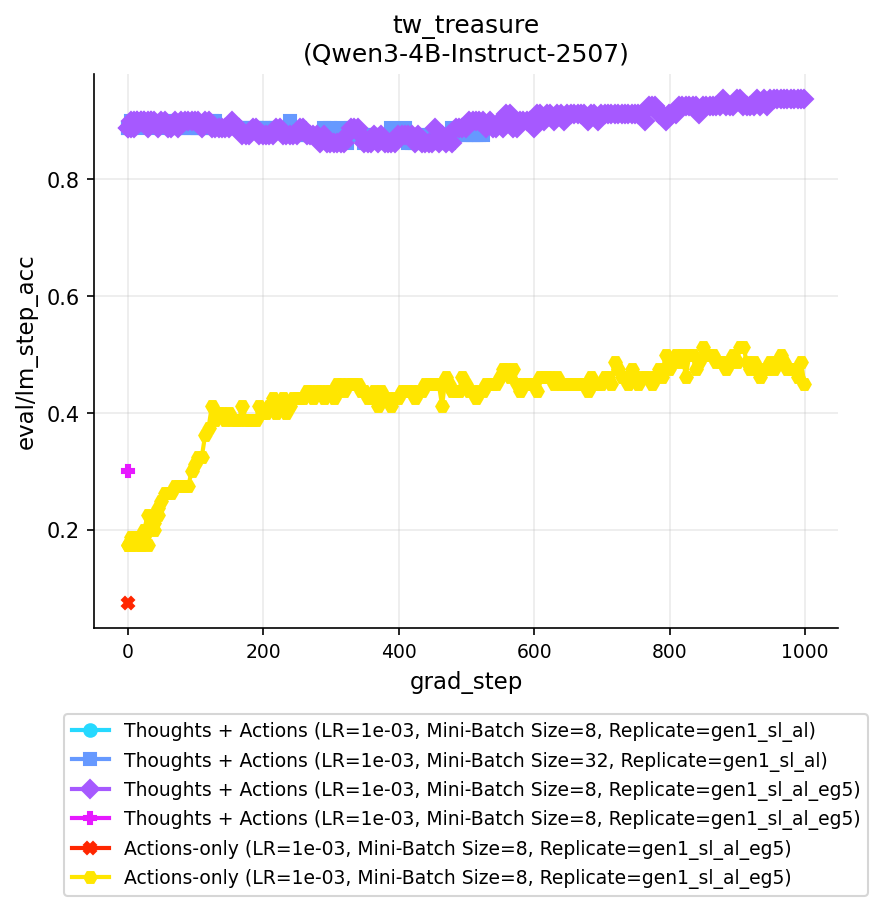

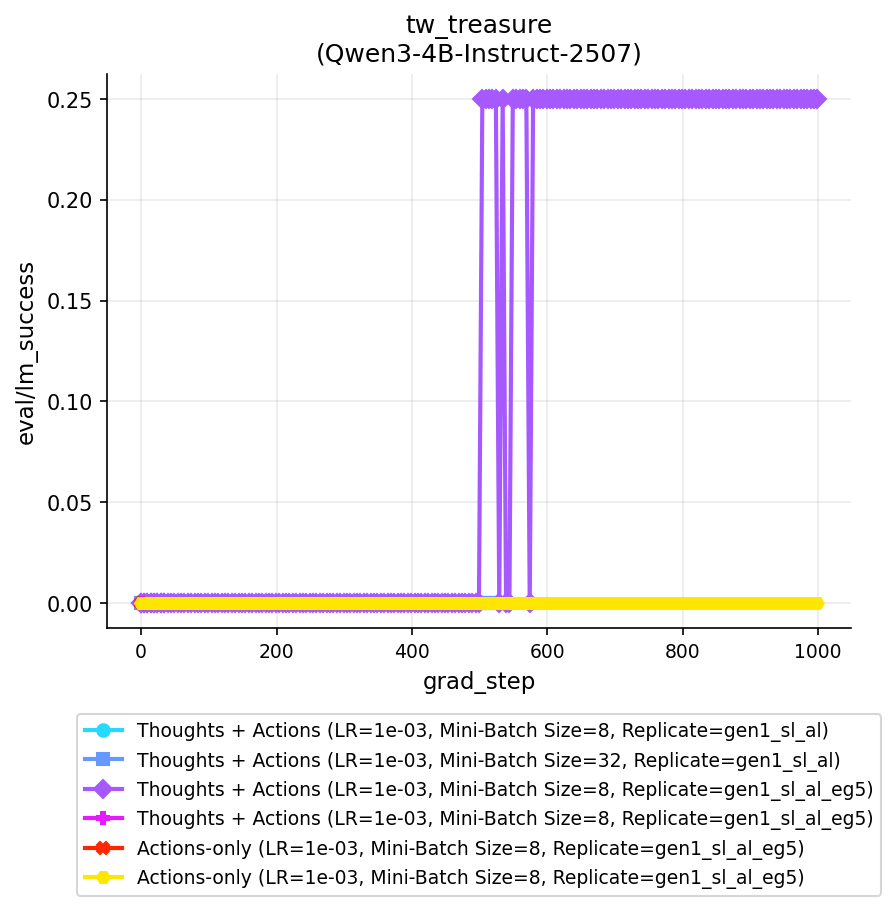

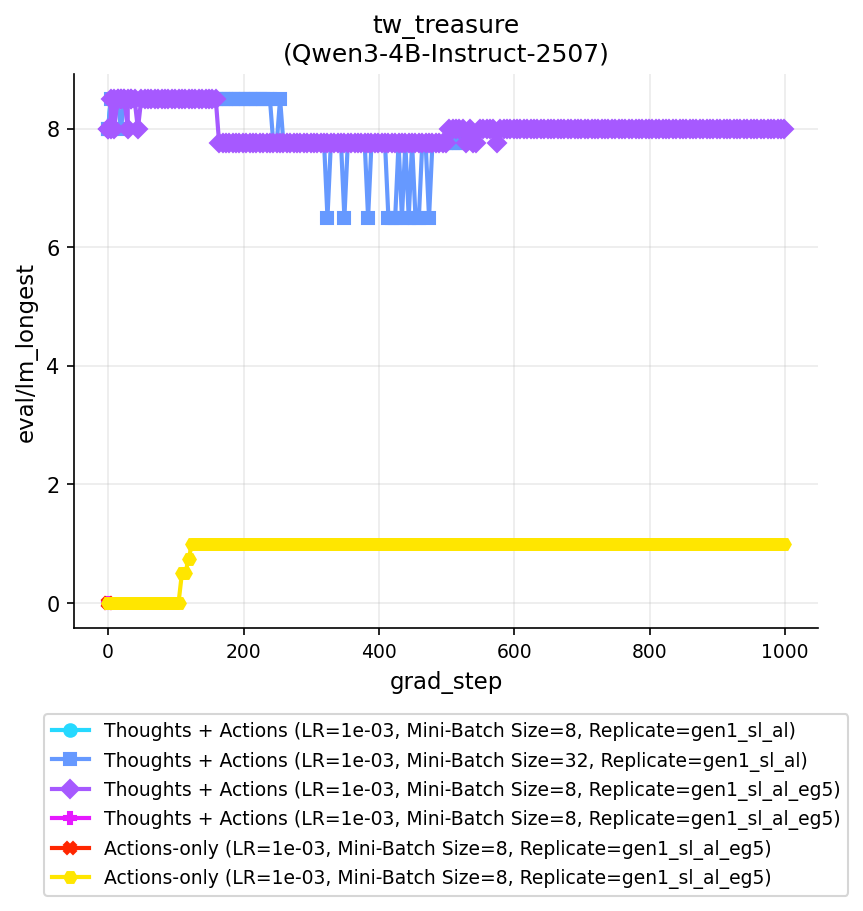

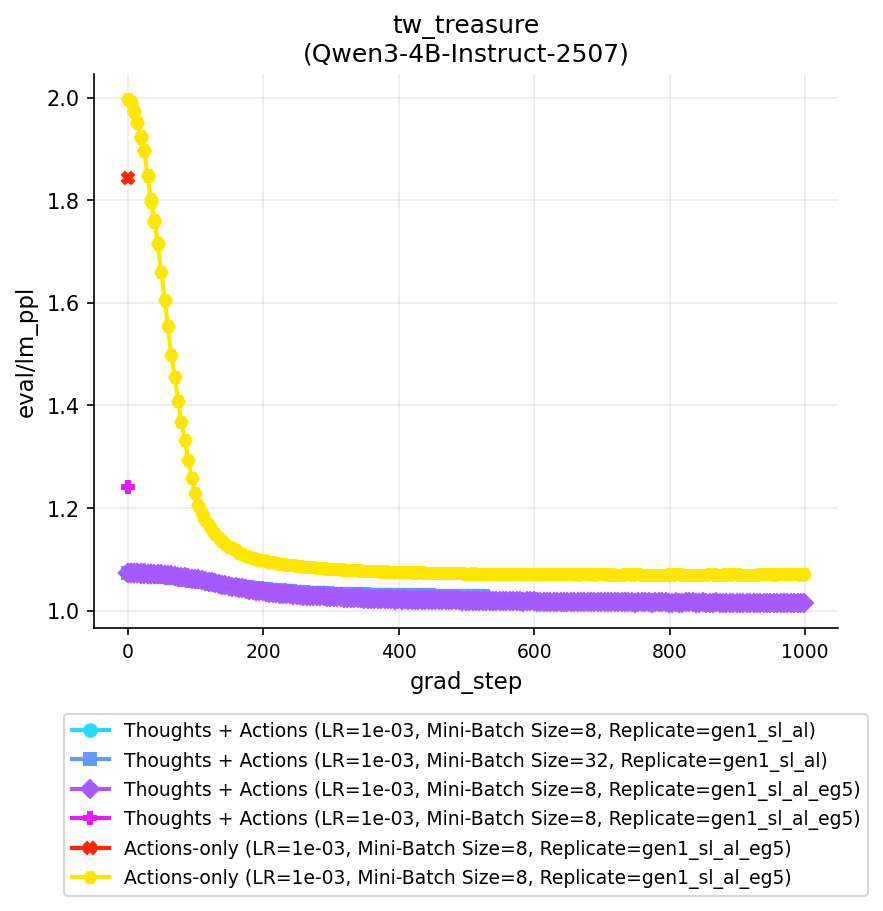

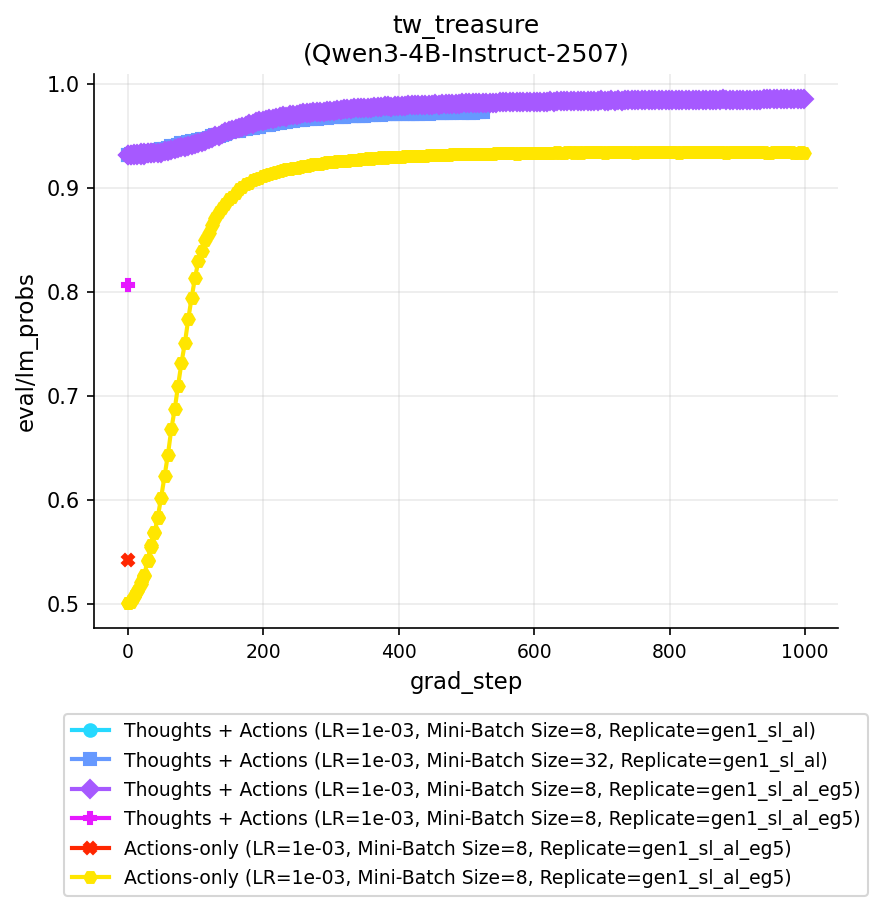

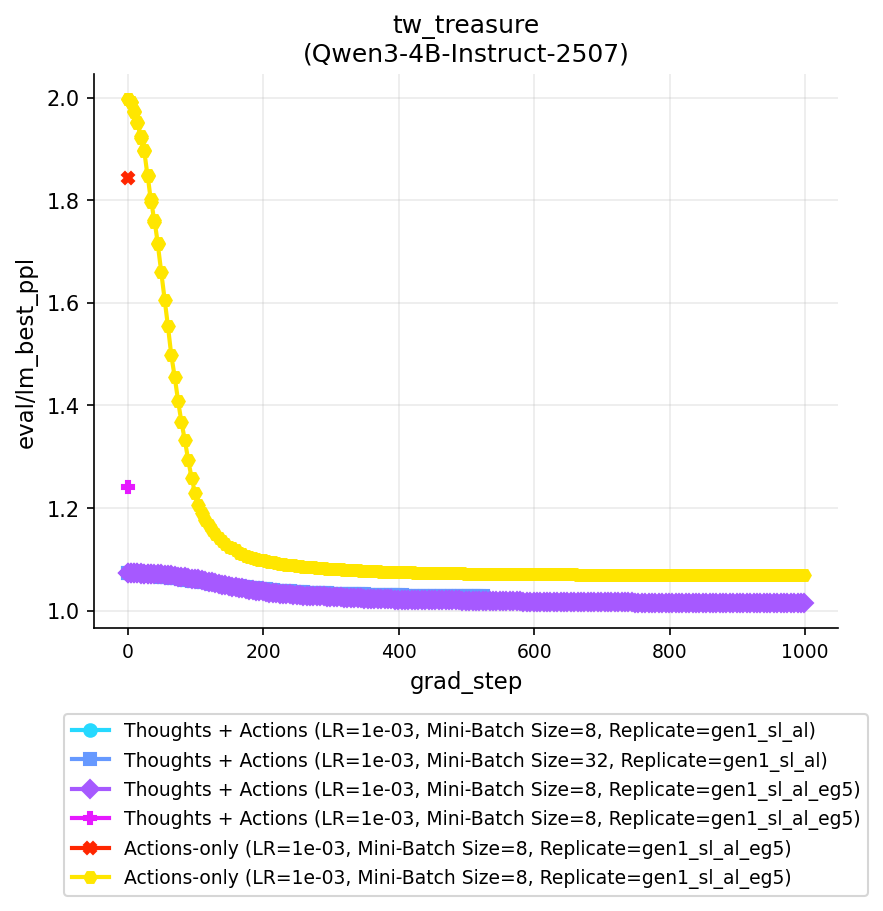

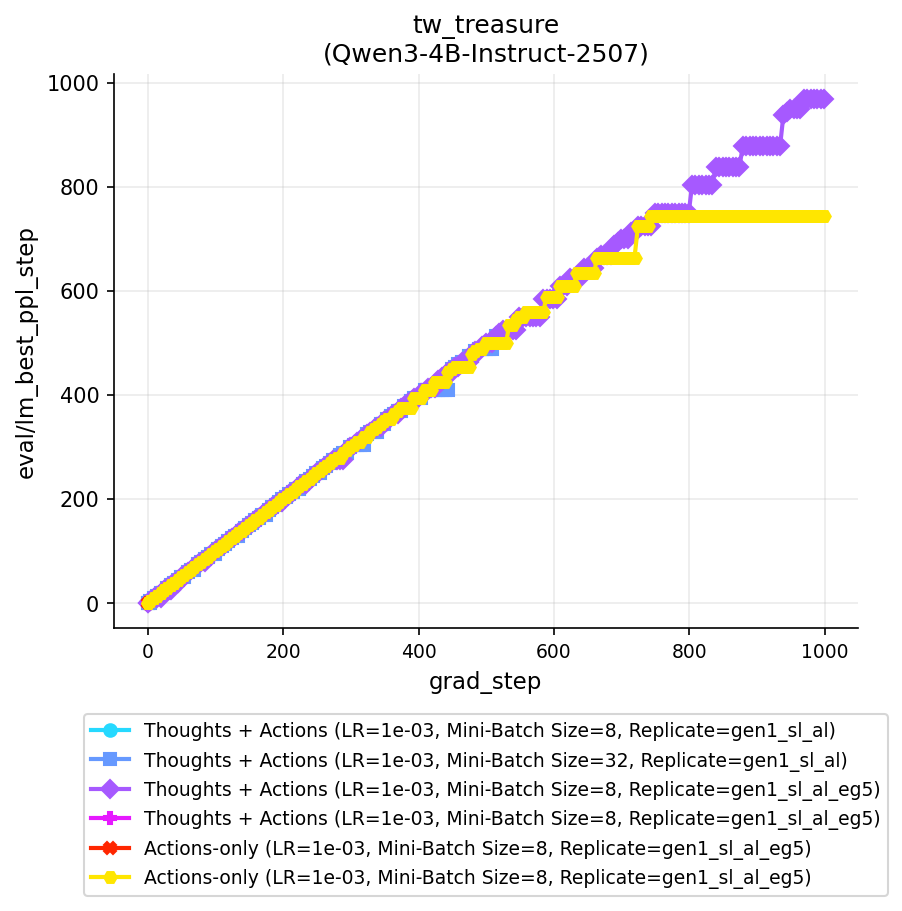

In [ ]:
# base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_8B")

verbose_labels = True

FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files['jsonl'][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]
# eval_gen_cols, eval_lm_cols

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    # Build labels once so we can count cool vs warm
    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    # Optional: reset marker index per-figure
    marker_idx = 0

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception as e:
            # print(f"Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`\n{e.__class__.__name__}: {e}")
            # print(f"df.columns: {df.columns}")
            # Try to reconcile keys
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        # df = df.rename(columns={k: v})
                        df[v] = df[k]
                    elif v in df.columns:  # reverse mapping
                        # df = df.rename(columns={v: k})
                        df[k] = df[v]
                        
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print("Error with `df.rename(columns={KEY_MAP_FWD.items()})`")
                print(f"{e.__class__.__name__}: {e}")
                print(f"df.columns: {df.columns}")
                print(f"Offending file: {fname}")
                display(df.head())         
        label = labels[_idx]

        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=get_color(label),
        )
        marker_idx += 1

    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    # center-bottom legend (inside)
    y_anchor = -len(labels) / 6 * 0.5
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),   # x=middle, y=just above bottom
        # ncol=2,                       # optional: wrap into multiple columns
        ncol=1,
        frameon=True,
    )

    plt.show()
    plt.close()

In [ ]:
act_lm_tw_treasure

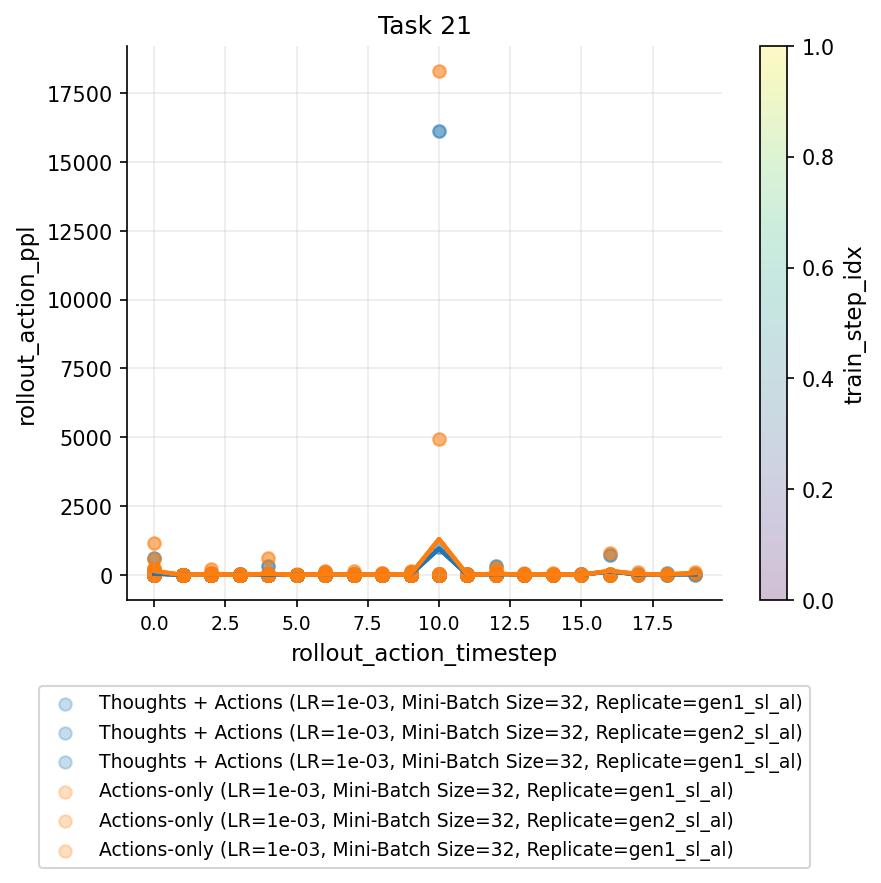

In [106]:
_x_label = "rollout_action_timestep"
# _y_label = "rollout_action_nll"
_y_label = "rollout_action_ppl"
_c_label = "train_step_idx"

verbose_labels = True

task_indices = pd.read_csv(valid_metrics_files["csv"][0])["task_idx"].unique()
names = unique_ids_from_strings(valid_metrics_files["csv"])
labels = []
for _idx, fname in enumerate(valid_metrics_files["csv"]):
    _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
    labels.append(_name)

n_cool = sum("Thoughts" in s for s in labels)
n_warm = len(labels) - n_cool
get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

# for _task_idx in task_indices:
for _idx, path_df in enumerate(valid_metrics_files["csv"]):
    label = labels[_idx]
    # color = get_color(label)
    color = "tab:blue" if "Thoughts" in label else "tab:orange"
    _df = pd.read_csv(path_df)
    _df = _df[_df["train_step_idx"] == 0]
    # _df_task = _df[_df["task_idx"] == _task_idx]
    _df_task = _df
    plt.scatter(_df_task[_x_label], _df_task[_y_label], label=label, color=color, alpha=0.25)  # c=_df_task[_c_label], 
    _df_task_mean = _df_task.groupby(_x_label).mean().reset_index()
    plt.plot(_df_task_mean[_x_label], _df_task_mean[_y_label], color=color)
    
plt.title(f"Task {_task_idx}")
plt.xlabel(_x_label)
plt.ylabel(_y_label)
plt.colorbar(label=_c_label)
plt.legend(
    loc="lower center",
    bbox_to_anchor=(0.5, -len(labels) / 6 * 0.5),
    ncol=1,
    frameon=True,
)
plt.show()


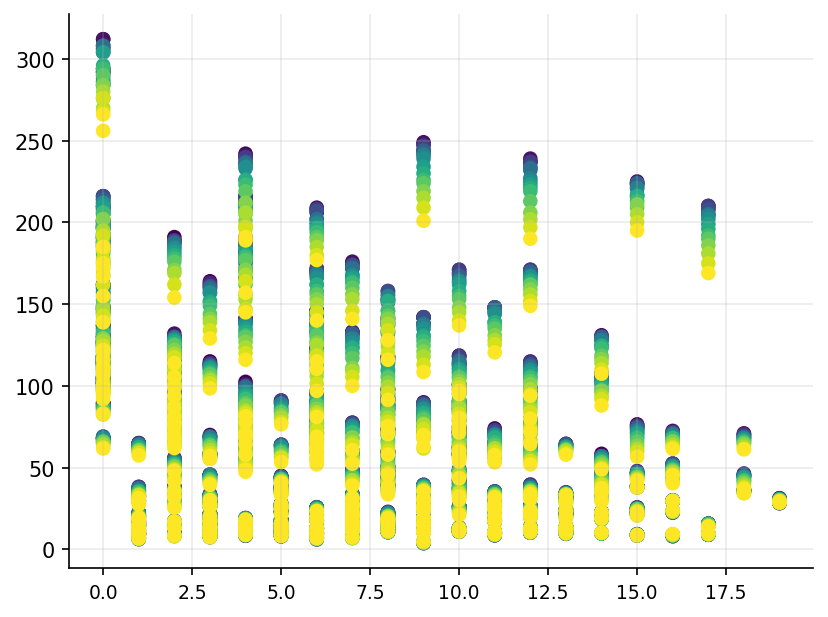

In [ ]:
_df = pd.read_csv(valid_metrics_files["csv"][0])


plt.scatter(_df["rollout_action_timestep"], _df["rollout_action_nll"], c=_df["train_step_idx"])
plt.show()

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,1.827827,0.0,0.0,0.0,6.220353,0.160763,6.220353,0.0,./logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-...,3.906250,49.7500,0.205891,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.343750,77.0000,0.150095,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.500000,12.1875,0.656100,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.406250,82.0000,1.000000,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.109375,8.2500,0.656100,NaN,NaN,NaN,NaN


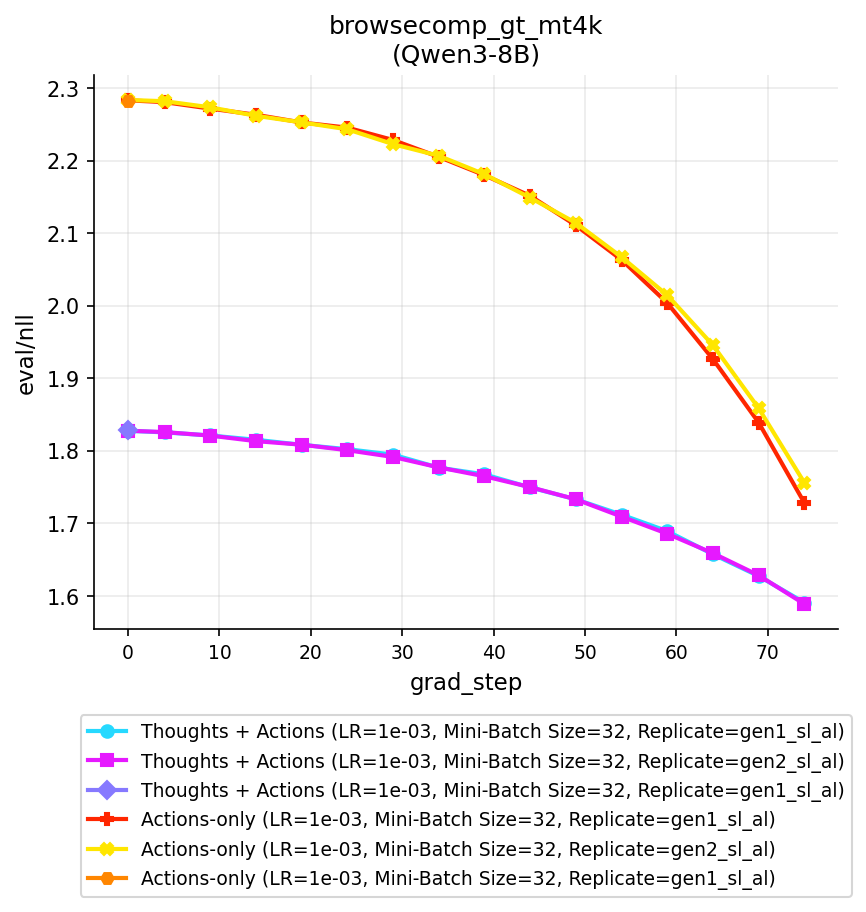

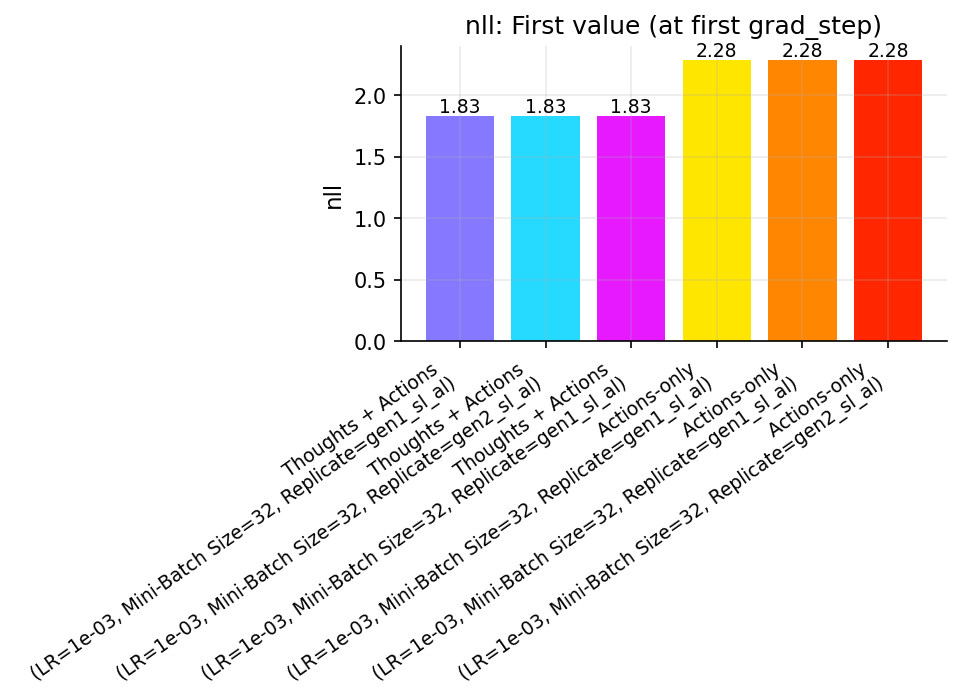

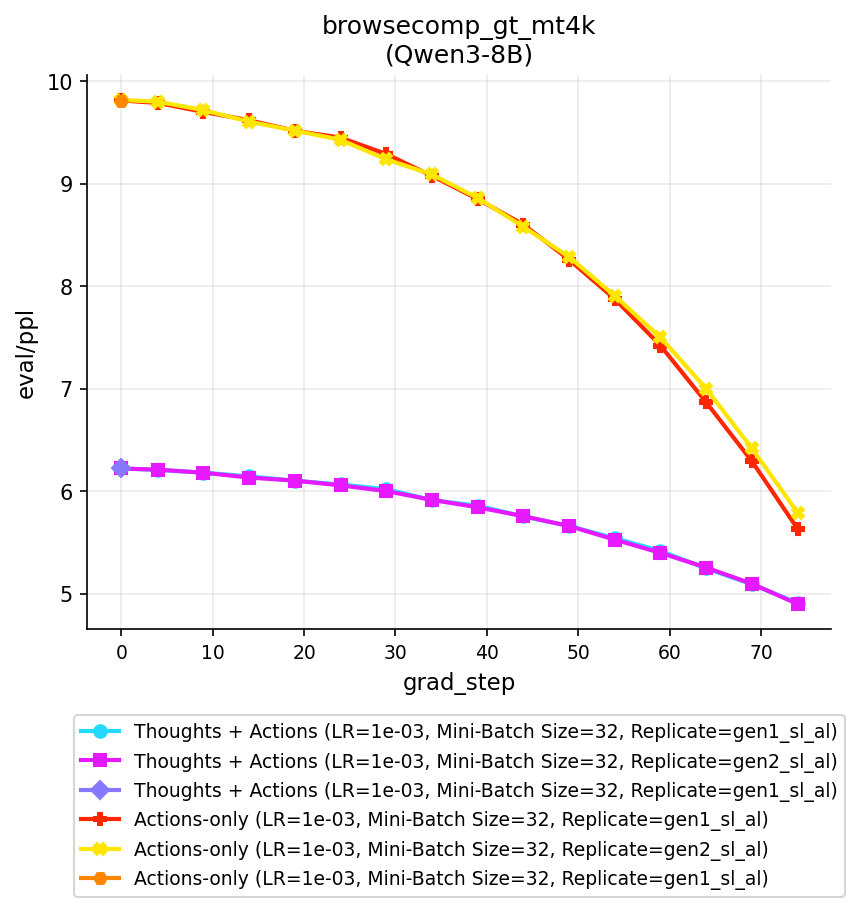

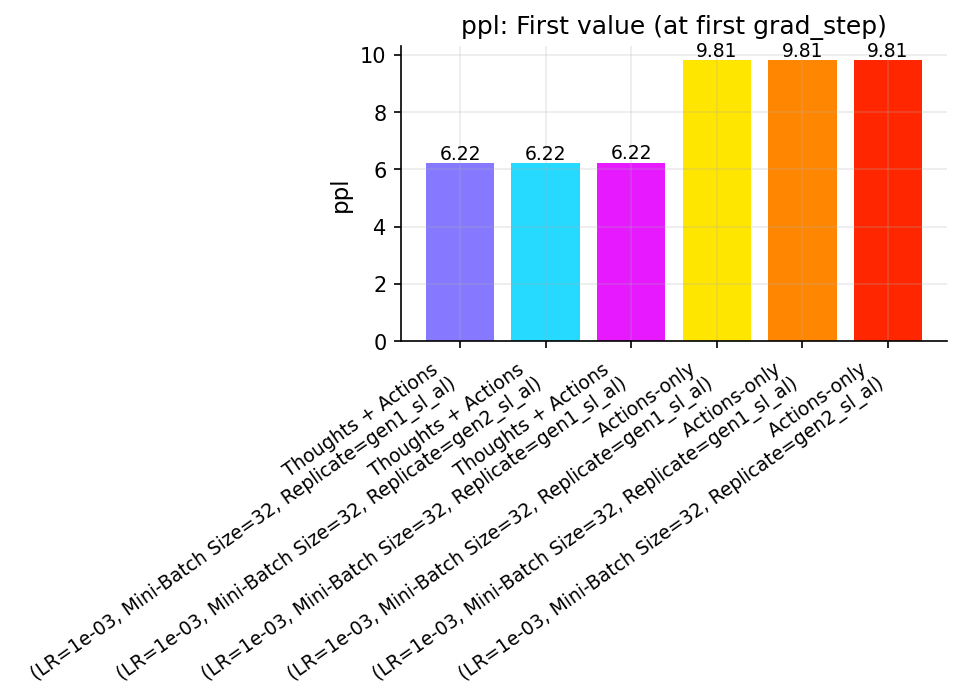

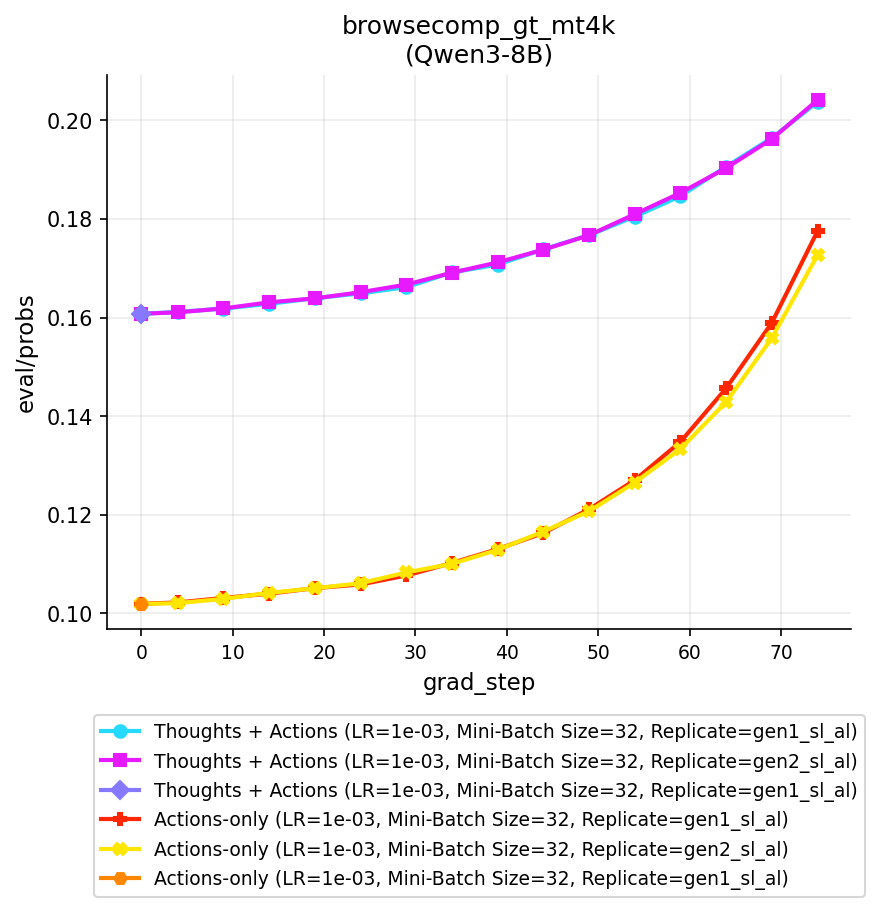

...

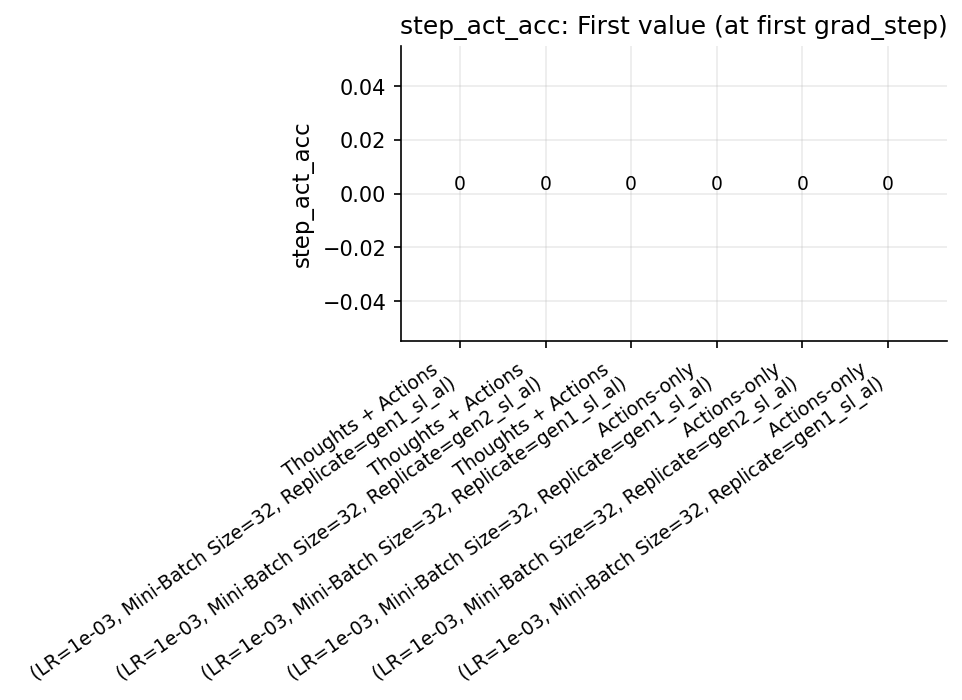

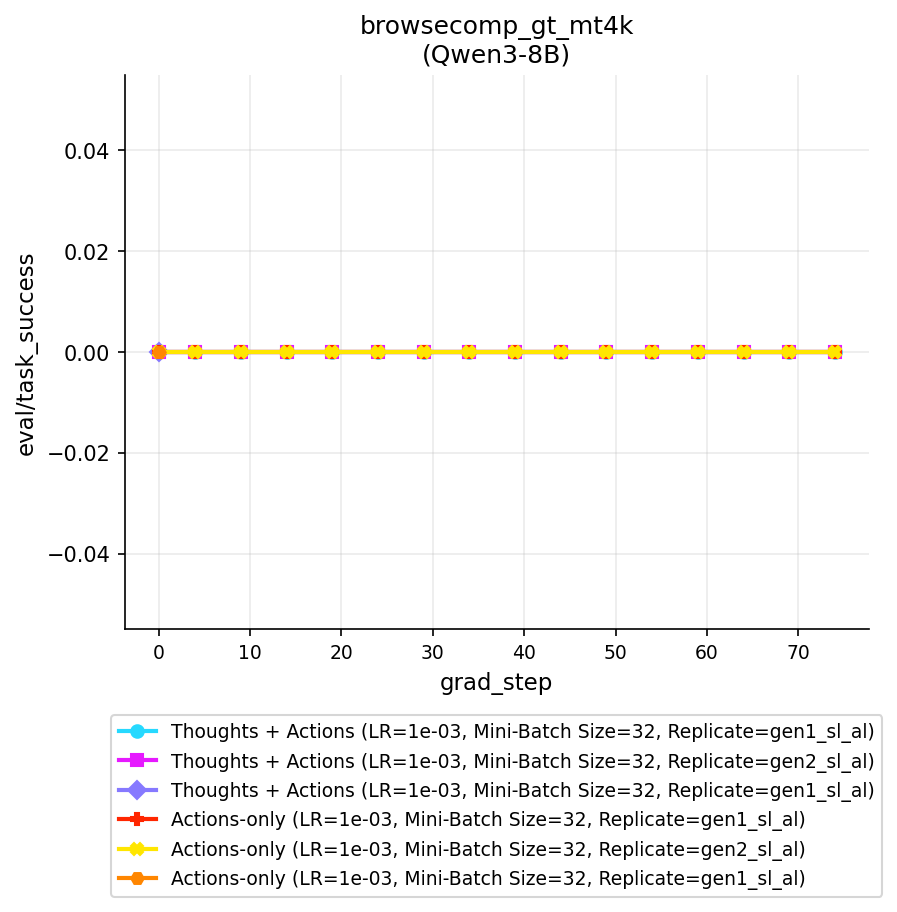

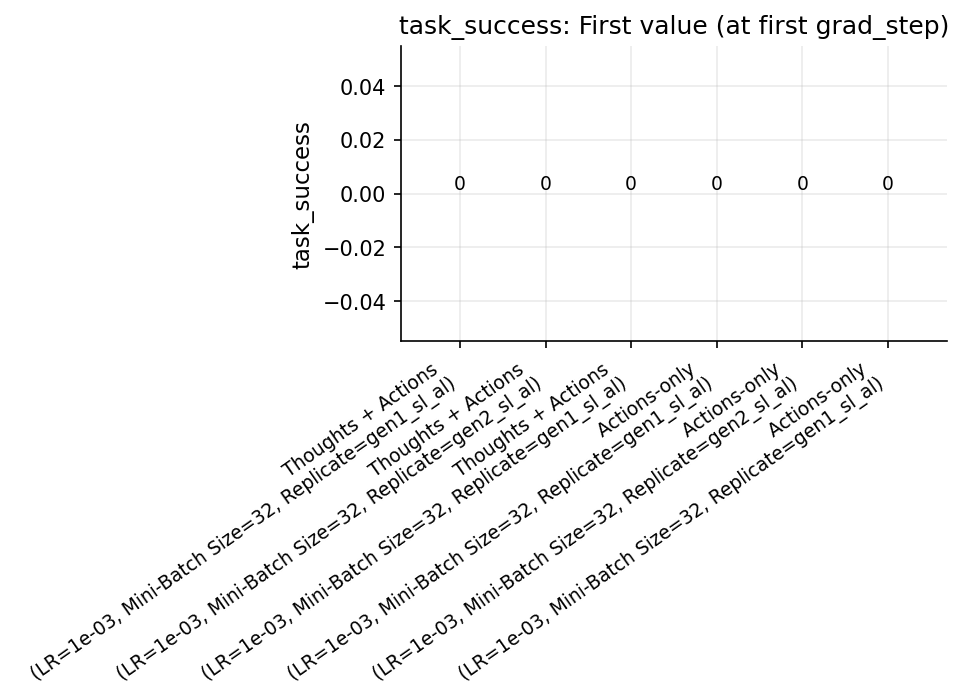

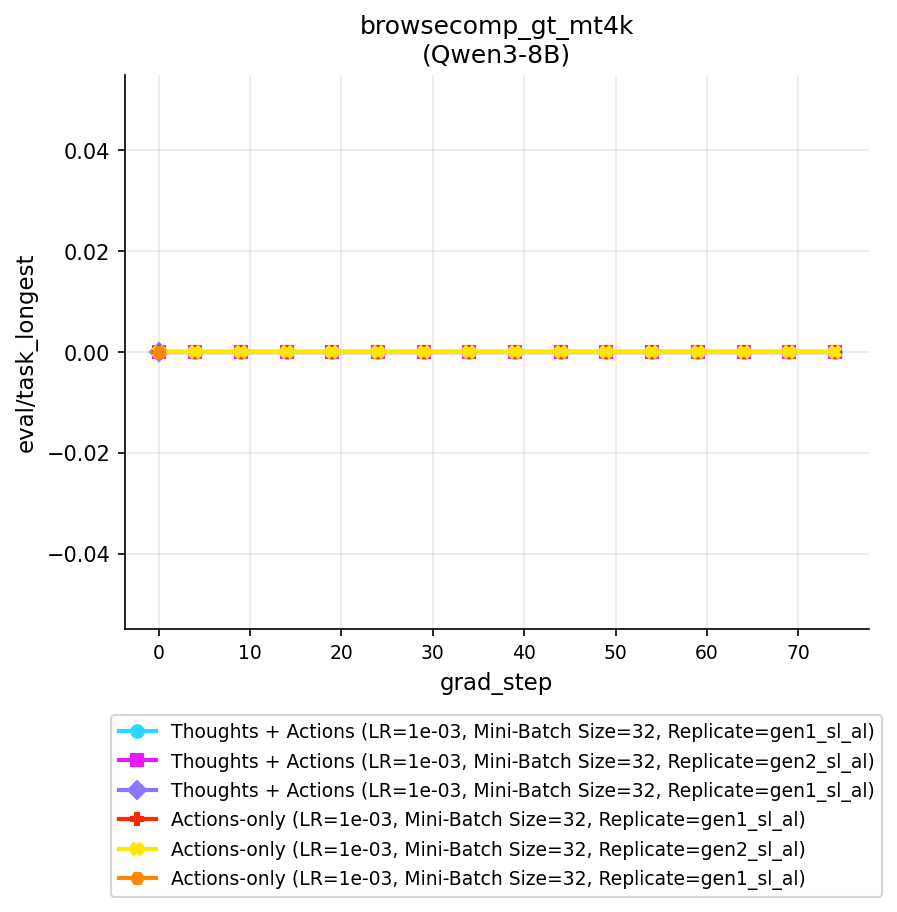

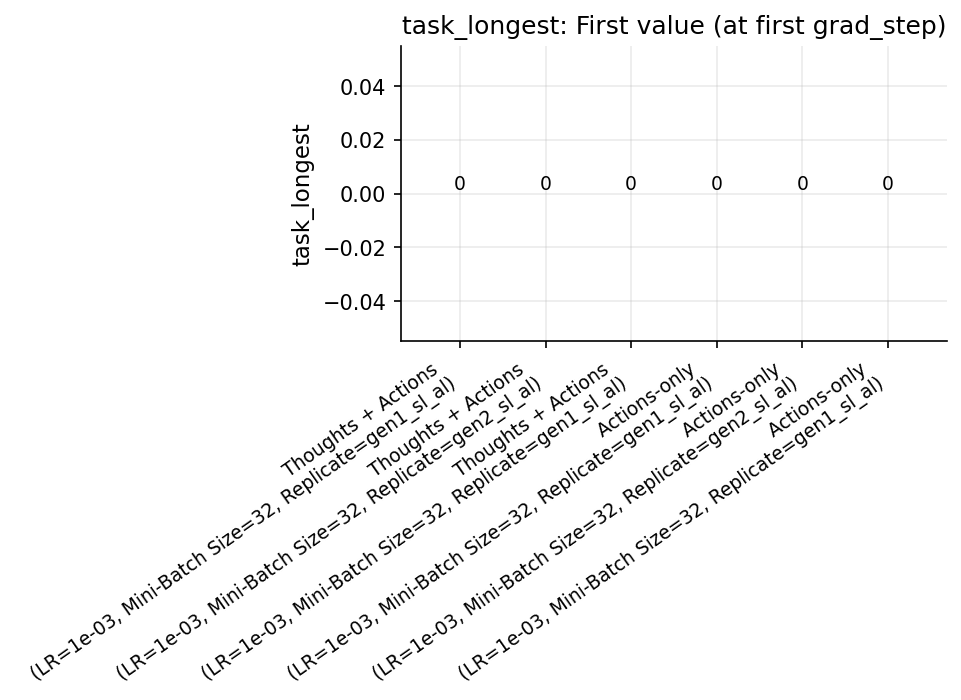

In [81]:
import numpy as np

# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_8B")

verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind) and "lera=0_001" in str(p):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=get_color(label),
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            bar_colors.append(get_color(label))  # use same palette logic per label
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            bar_colors.append(get_color(label))

    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) / 6 * 0.5
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar chart of first values ----
    # Filter out NaNs
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v)]
    if len(keep) == 0:
        continue

    # Optional: sort bars by value (makes comparison easier)
    order = sorted(keep, key=lambda i: first_vals[i])

    # fig, ax = plt.subplots(figsize=(8.0, 3.8))
    fig, ax = plt.subplots()
    x = np.arange(len(order))

    if BARCHART_TYPE == "first":
        vals = [first_vals[i] for i in order]
        steps = [first_steps[i] for i in order]
    else:
        vals = [last_vals[i] for i in order]
        steps = [last_steps[i] for i in order]
    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Split labels across multiple lines
    lbls = [lbl.replace("(", "\n(") for lbl in lbls]

    ax.bar(x, vals, color=cols)
    ax.set_title(f"{key.replace('eval/', '')}: {BARCHART_TYPE.capitalize()} value (at {BARCHART_TYPE} grad_step)")
    ax.set_ylabel(key.replace("eval/", ""))
    ax.set_xticks(x)
    ax.set_xticklabels(lbls, rotation=35, ha="right")

    # Print/annotate the value on top of each bar (what you asked for)
    for xi, v in zip(x, vals):
        ax.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)

    # Optional: also print which grad_step each “first value” came from
    # (useful if different runs start at different steps)
    # for xi, st in zip(x, steps):
    #     ax.text(xi, ax.get_ylim()[0], f"step={st:.0f}", ha="center", va="bottom", fontsize=8, rotation=90)

    fig.tight_layout()
    plt.show()
    plt.close(fig)


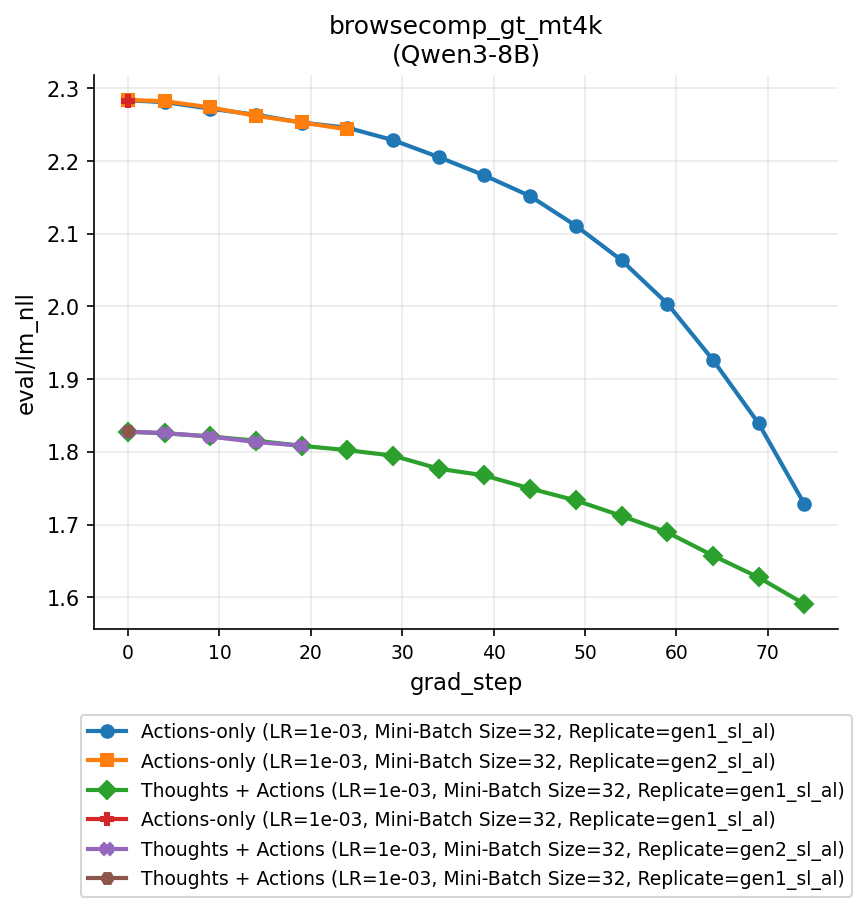

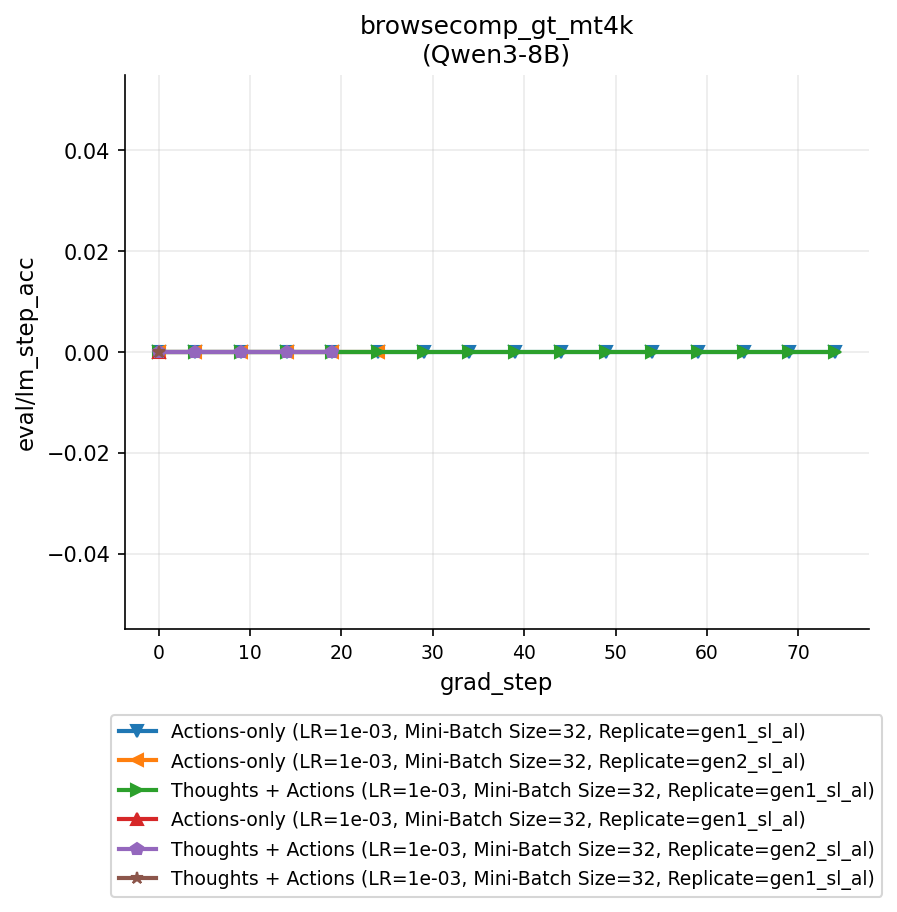

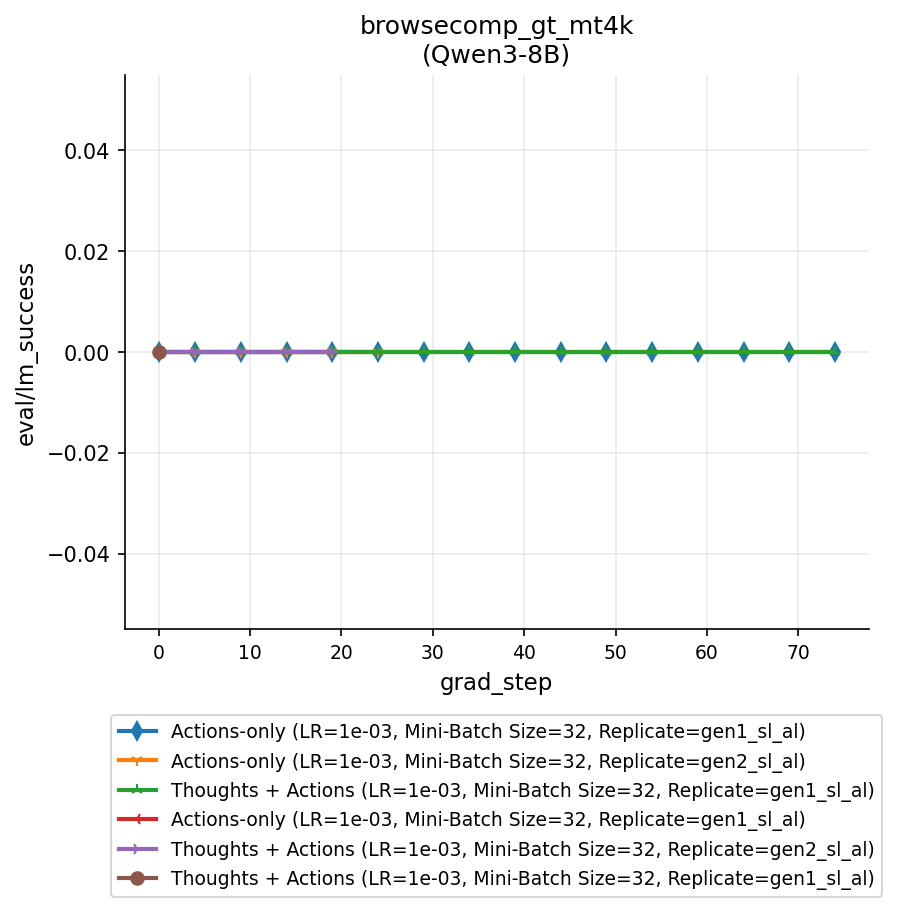

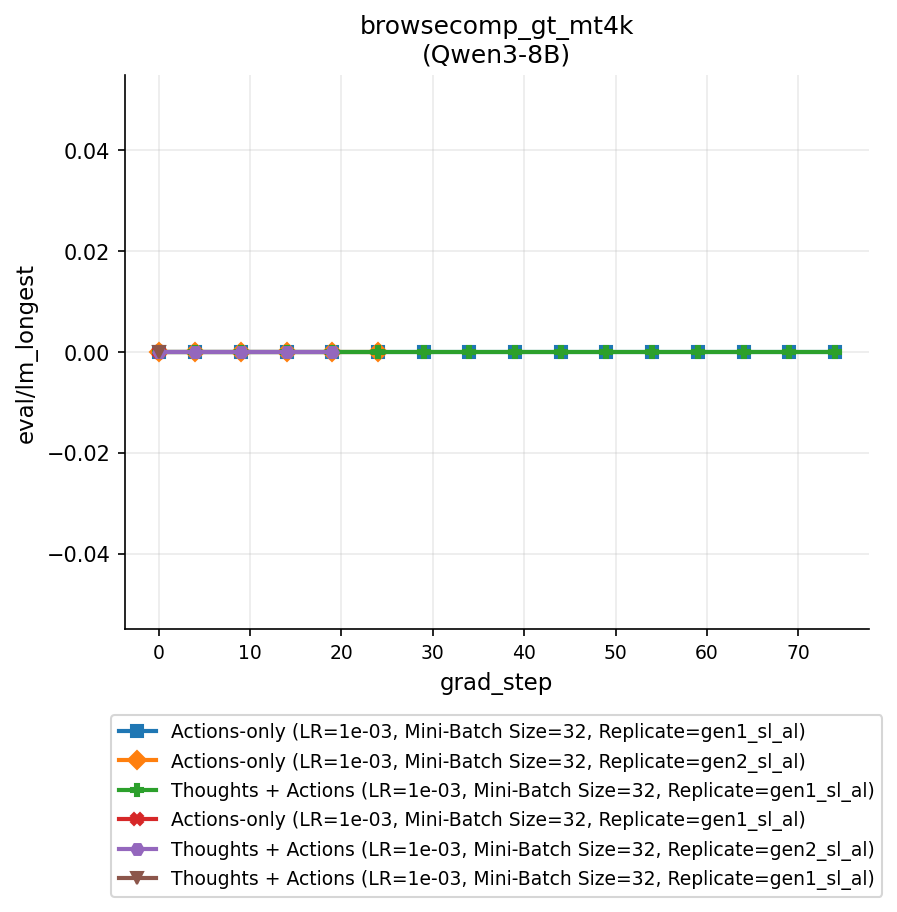

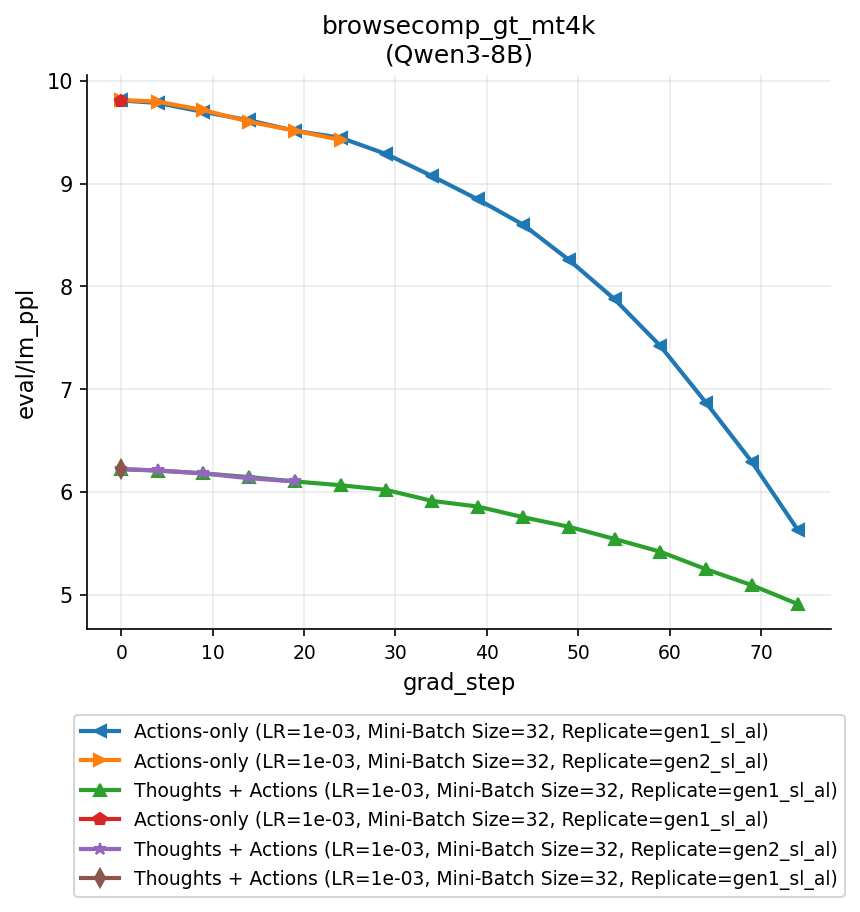

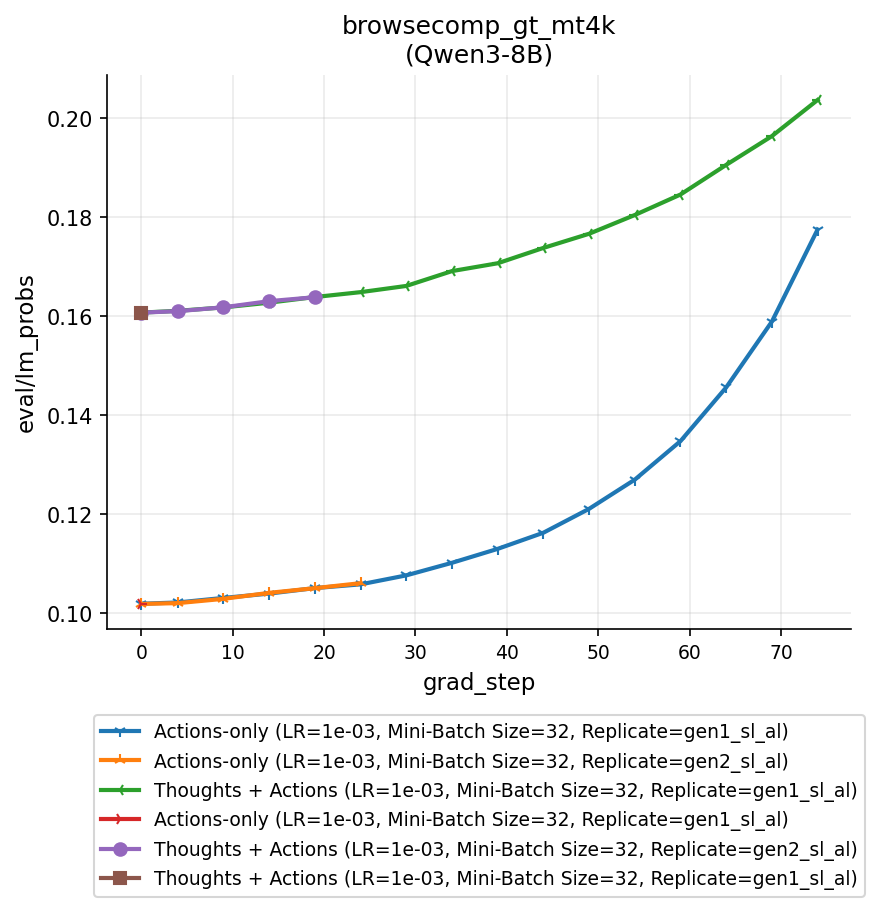

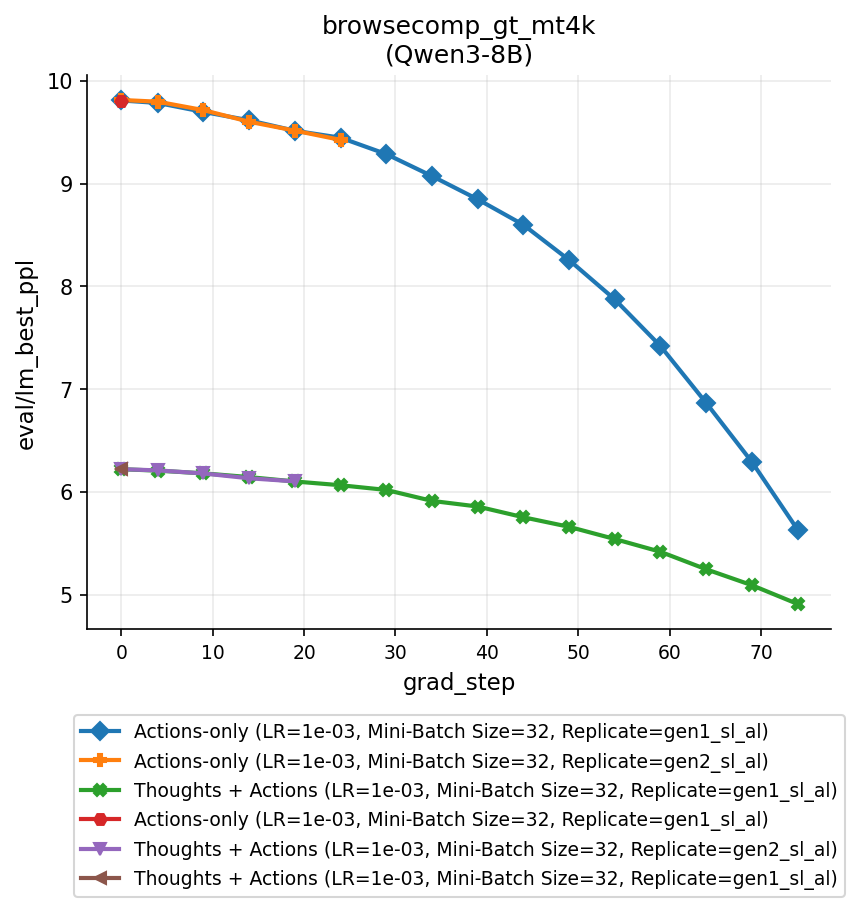

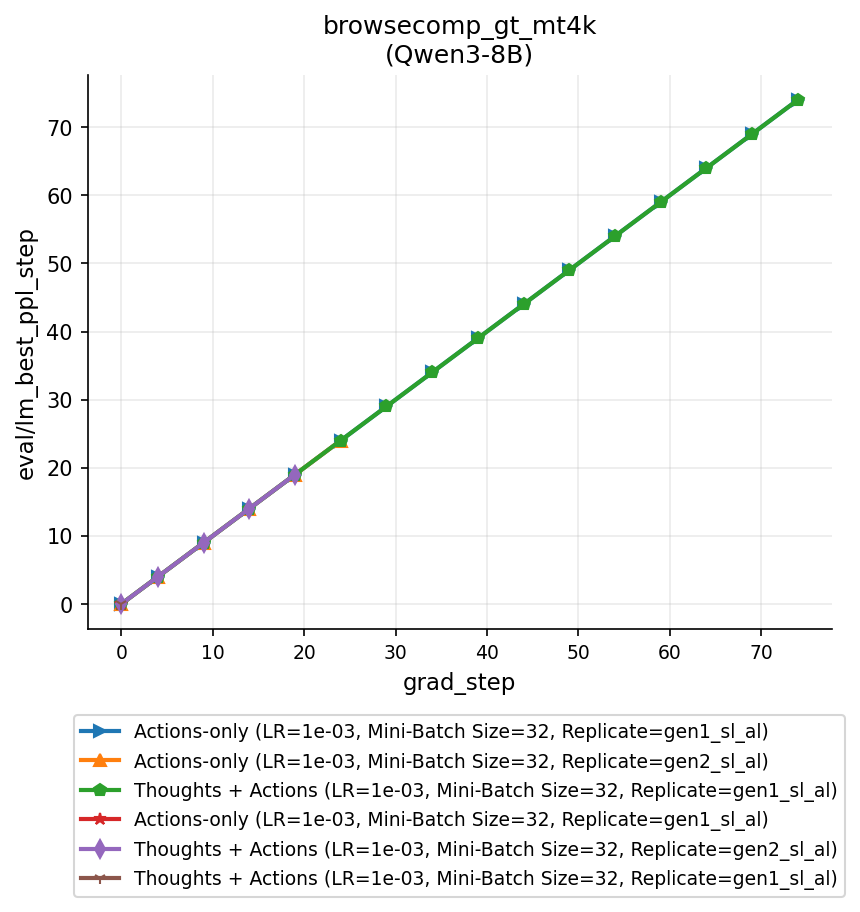

In [ ]:
verbose_labels = True

FILE_KIND = "jsonl"
EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"
    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        try:
            _df = df.dropna(subset=EVAL_COLS)
            _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
            plt.plot(_df[x_label], _df[y_label], label=_name, marker=markers[marker_idx % len(markers)])
            plt.xlabel(x_label)
            plt.ylabel(y_label)
            marker_idx += 1
        except Exception as e:
            print(f"Error plotting {fname}\n{e.__class__.__name__}: {e}")
            display(df.head())
    plt.title(_title)
    # plt.legend()
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, -0.5),   # x=middle, y=just above bottom
        # ncol=2,                       # optional: wrap into multiple columns
        ncol=1,
        frameon=True,
    )
    # plt.grid()
    plt.show()

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,2.283422,0.0,0.0,0.0,9.810192,0.101935,9.810192,0.0,./logs/act_lm_browsecomp_gt_mt4k/Qwen3_8B/act-...,2.71875,15.1875,0.656100,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.81250,16.6250,0.282429,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.15625,23.5000,0.531441,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.03125,56.2500,0.313810,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.28125,26.6250,0.254186,NaN,NaN,NaN,NaN


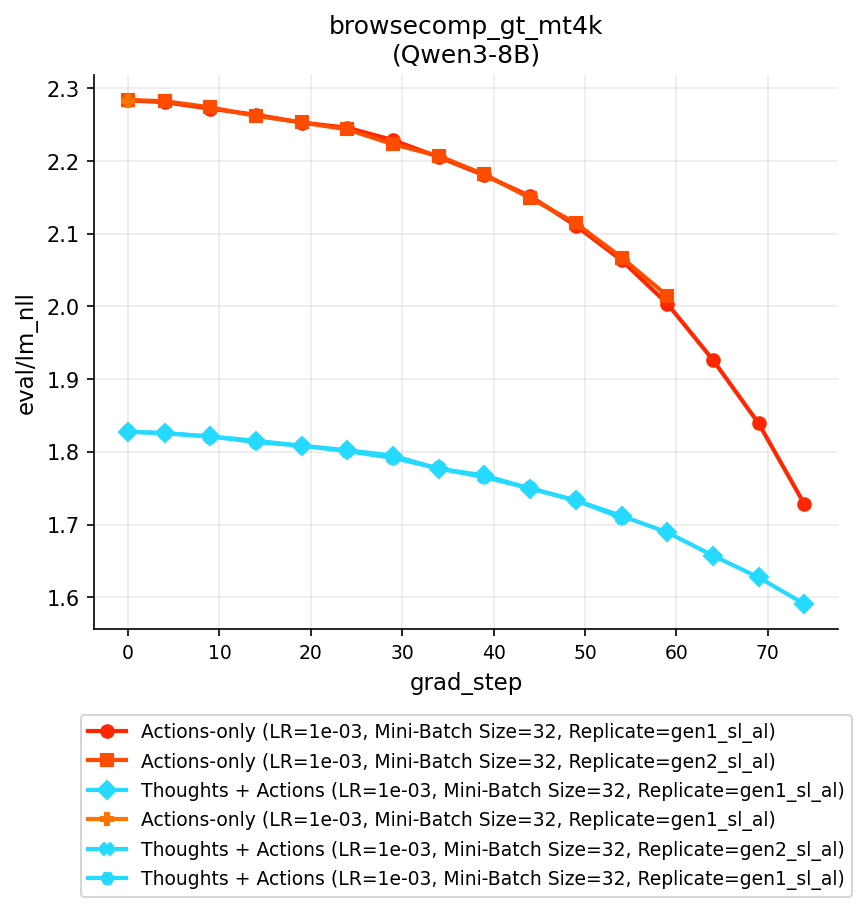

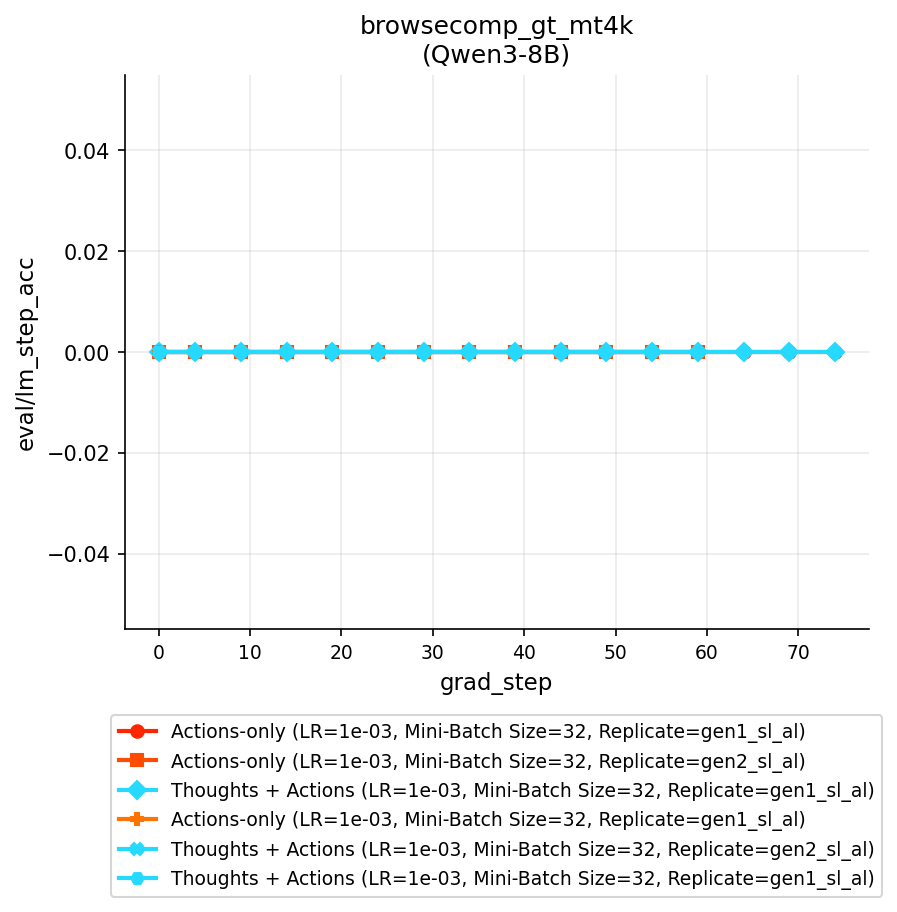

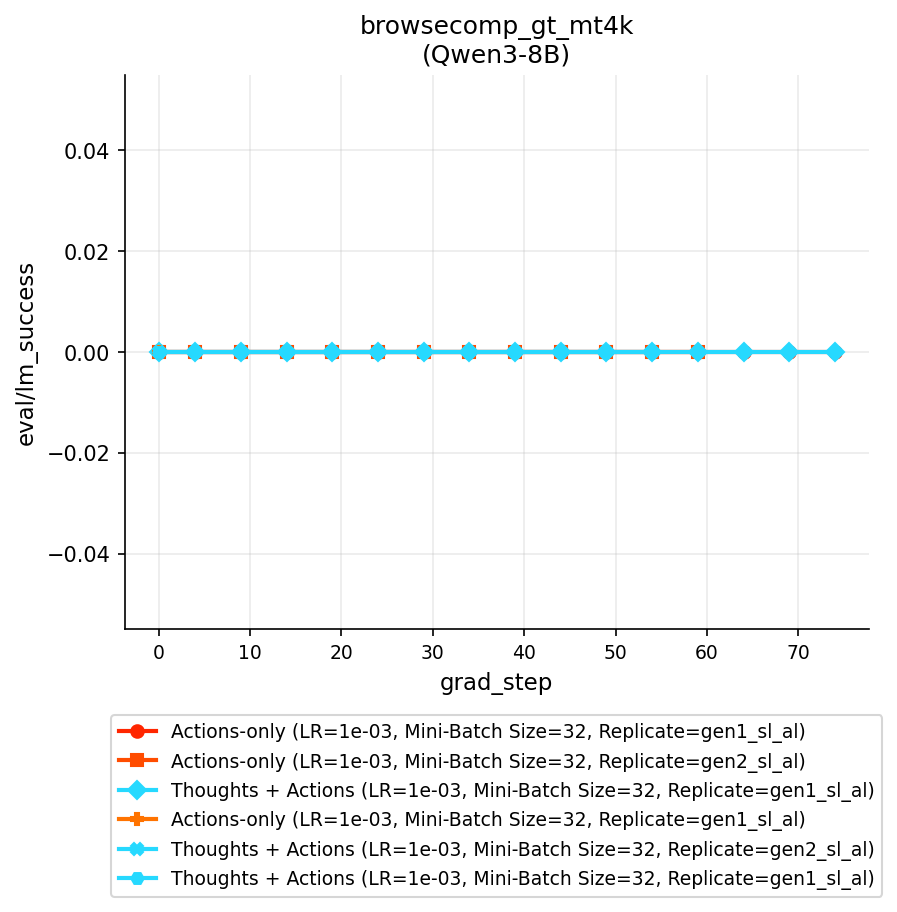

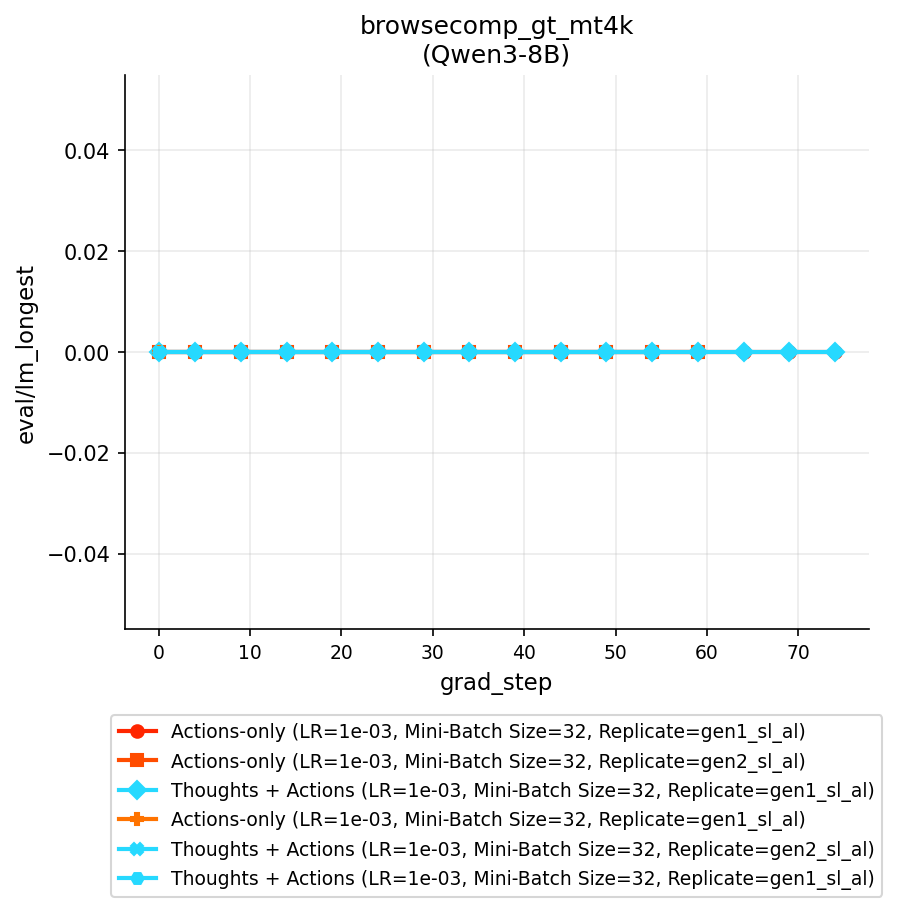

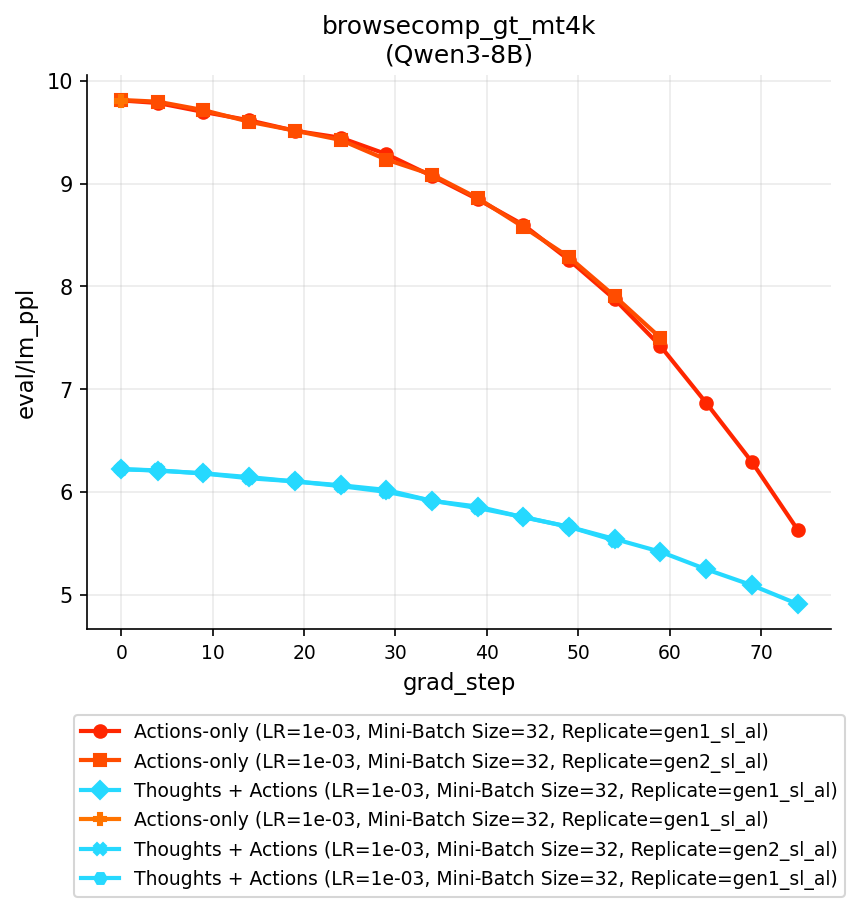

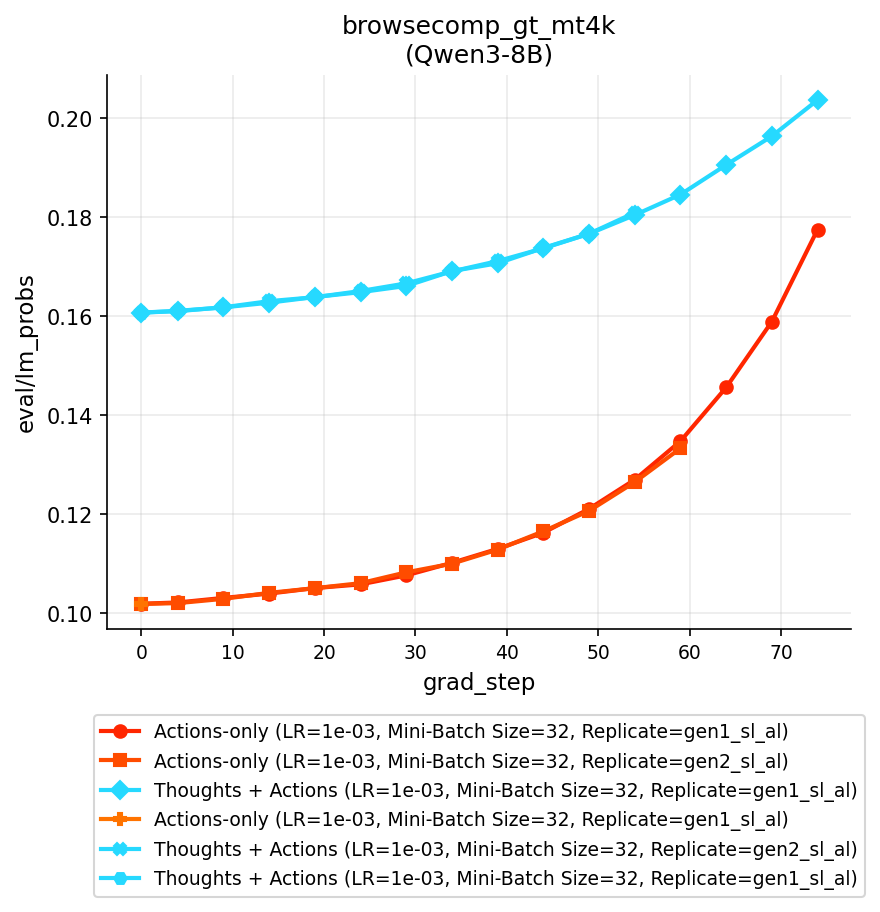

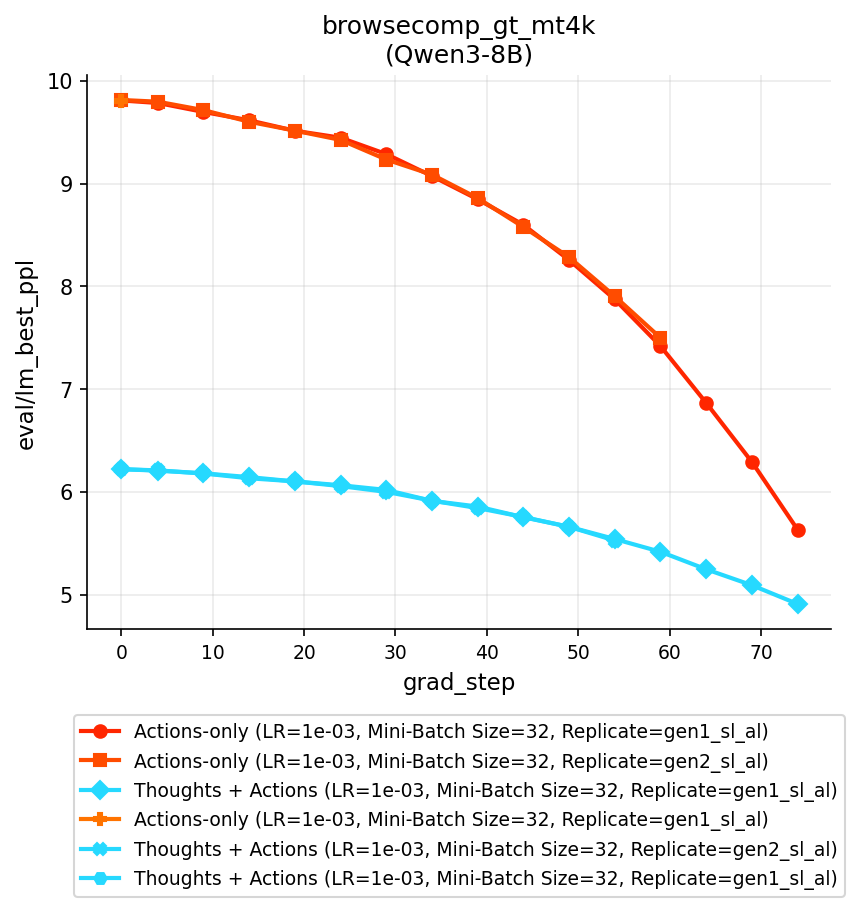

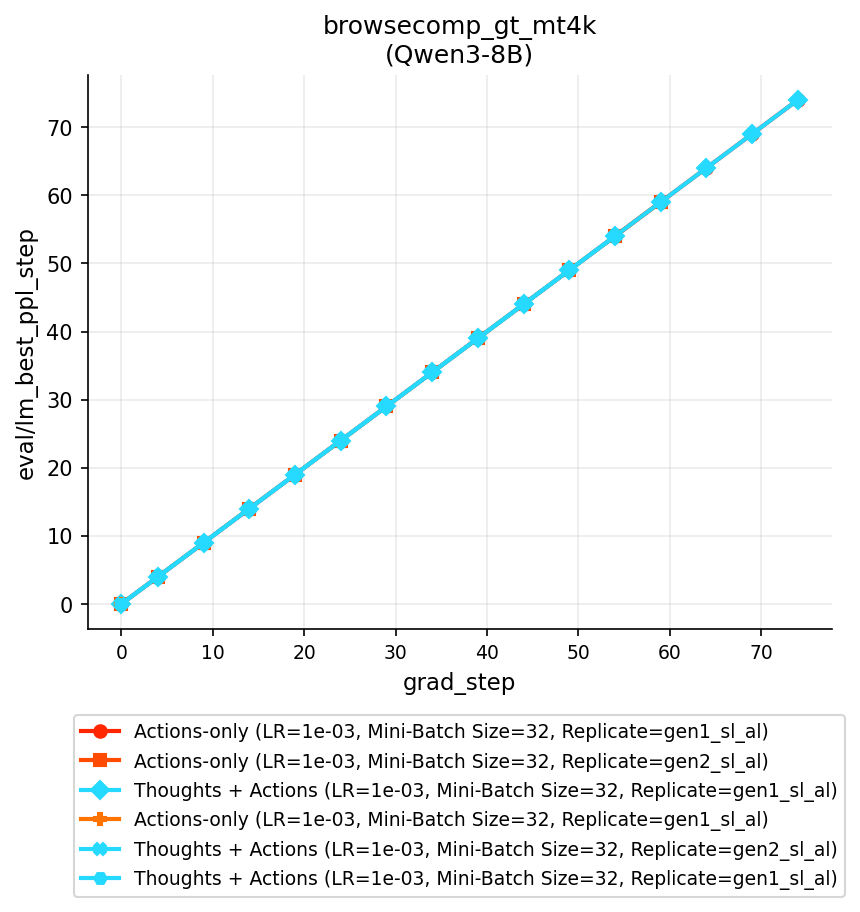

In [54]:
# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_8B")

verbose_labels = True

FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)


df = pd.read_json(valid_metrics_files['jsonl'][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]
# eval_gen_cols, eval_lm_cols

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    # Build labels once so we can count cool vs warm
    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Actions + Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    # Optional: reset marker index per-figure
    marker_idx = 0

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception as e:
            print(f"Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`\n{e.__class__.__name__}: {e}")
            print(f"df.columns: {df.columns}")
            # Try to reconcile keys
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        # df = df.rename(columns={k: v})
                        df[v] = df[k]
                    elif v in df.columns:  # reverse mapping
                        # df = df.rename(columns={v: k})
                        df[k] = df[v]
                        
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print("Error with `df.rename(columns={KEY_MAP_FWD.items()})`")
                print(f"{e.__class__.__name__}: {e}")
                print(f"df.columns: {df.columns}")
                display(df.head())         
        label = labels[_idx]

        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=get_color(label),
        )
        marker_idx += 1

    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    # center-bottom legend (inside)
    y_anchor = -len(labels) / 6 * 0.5
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),   # x=middle, y=just above bottom
        # ncol=2,                       # optional: wrap into multiple columns
        ncol=1,
        frameon=True,
    )

    plt.show()
    plt.close()

,grad_step,global_step,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest,eval/eval_idx,eval/best_ppl,eval/best_ppl_step,train/loss,train/ppl,train/weight
0,0,0,1.752296,5.767832,0.173375,0.074553,0.0,0.0,0.0,5.767832,0.0,6.000000,404.000,0.348678
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.593750,13.375,0.729000
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.828125,16.875,0.531441
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.546875,12.750,0.590490
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.562500,35.250,0.166772


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


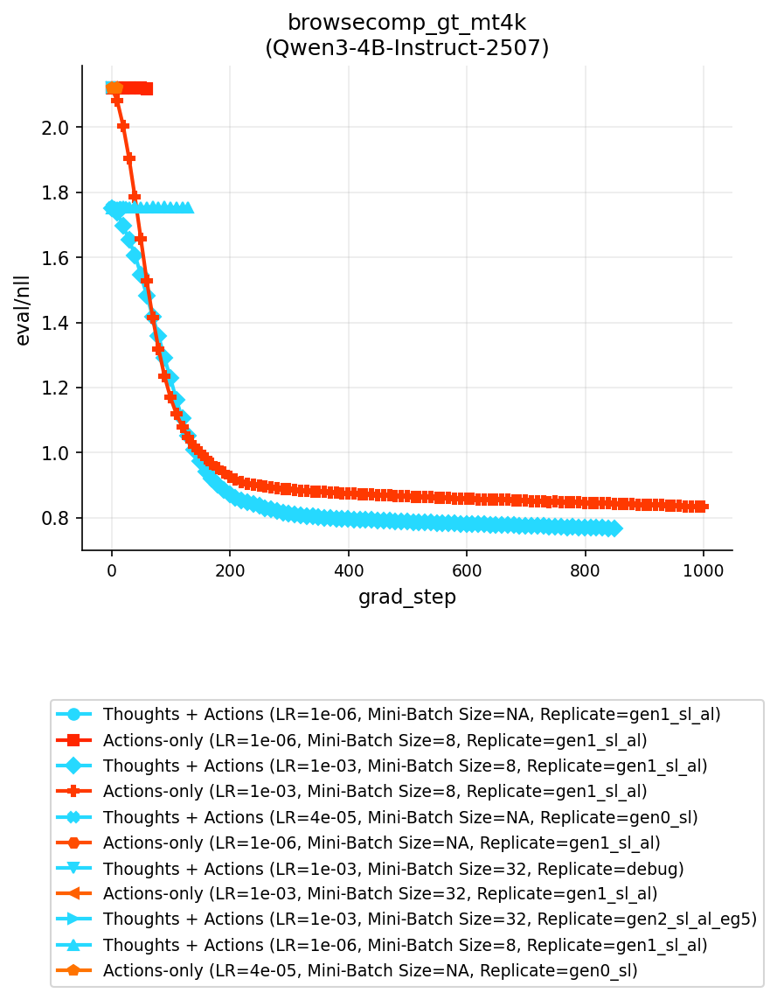

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


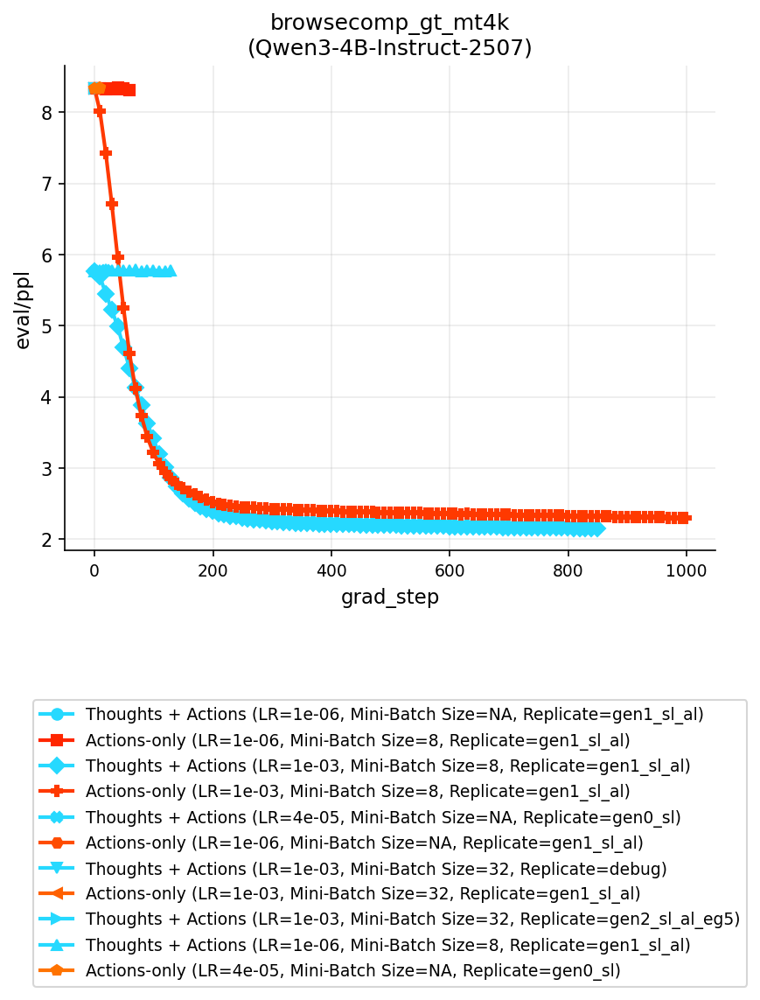

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


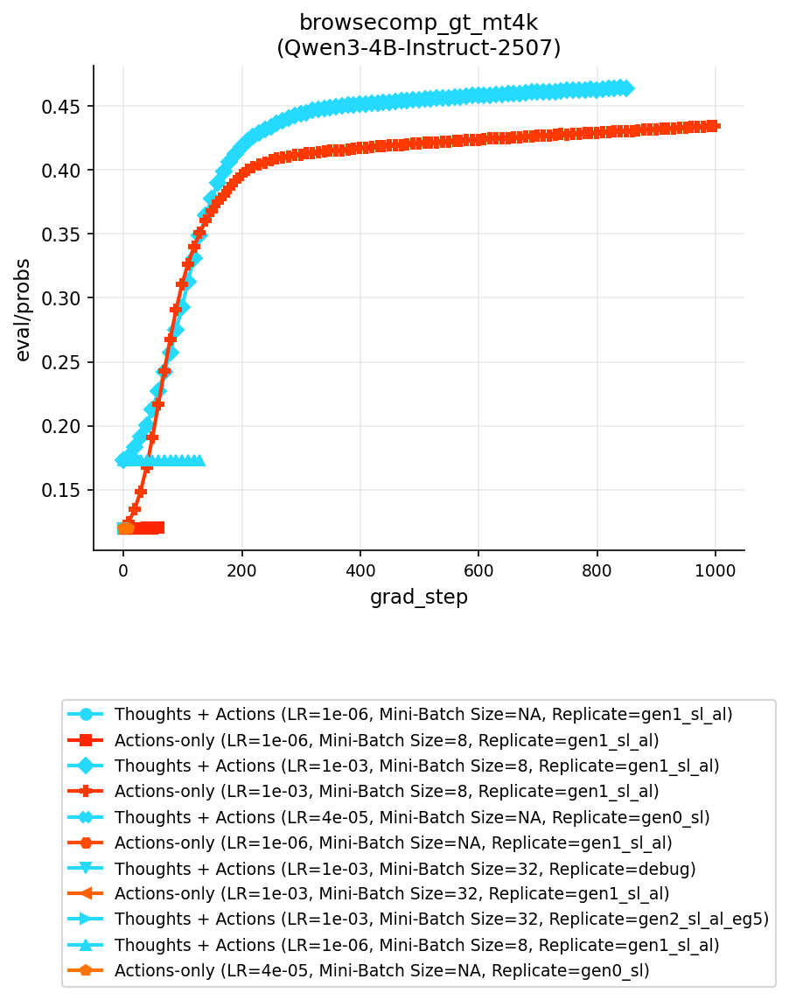

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


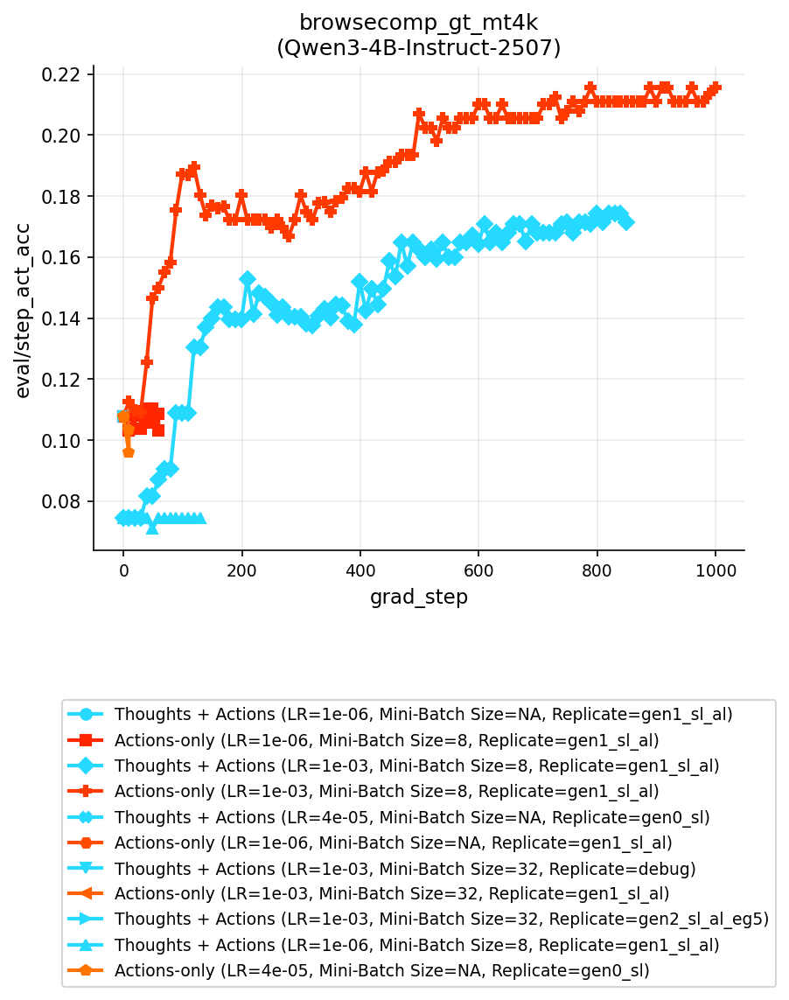

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


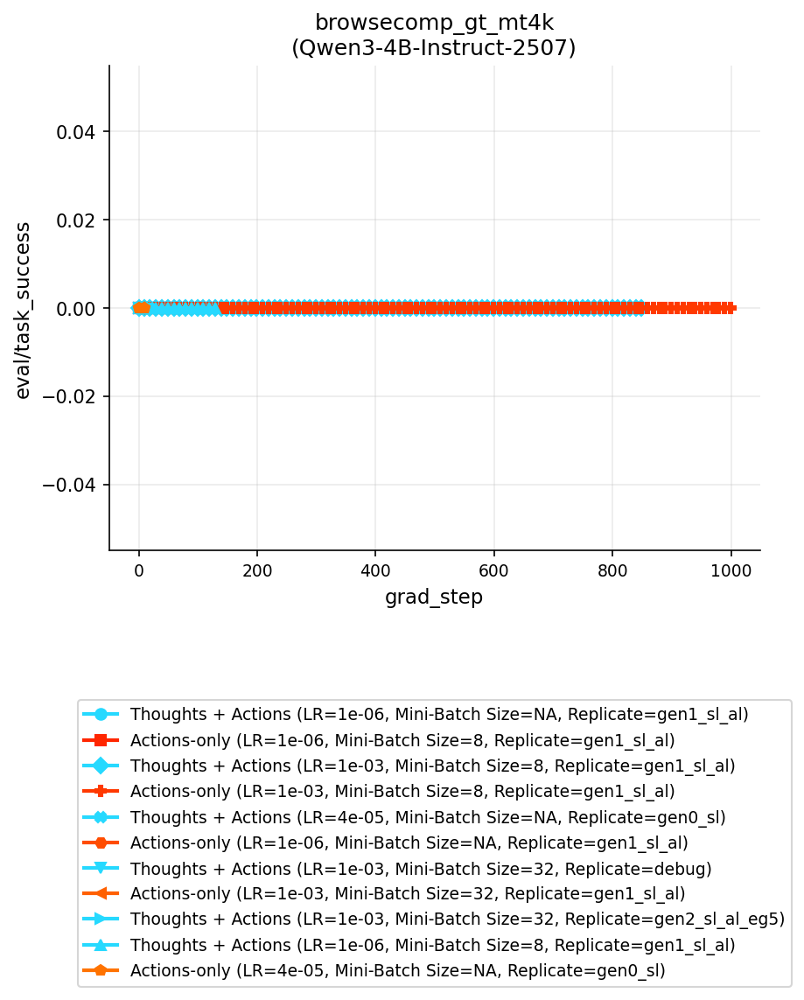

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


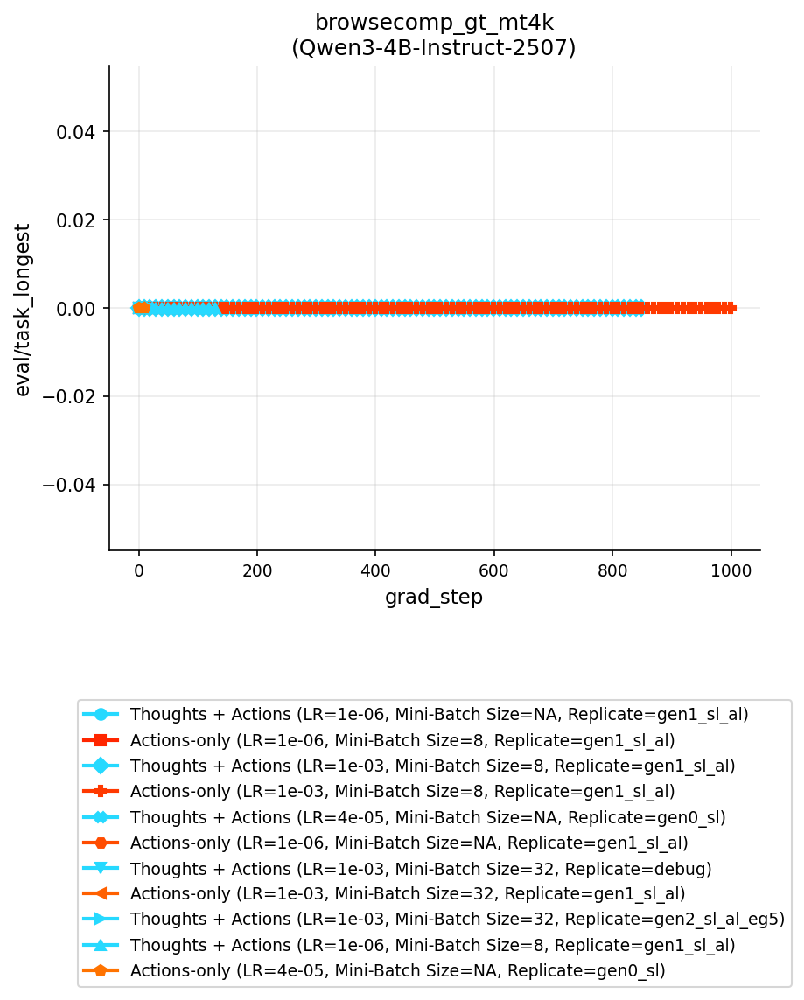

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


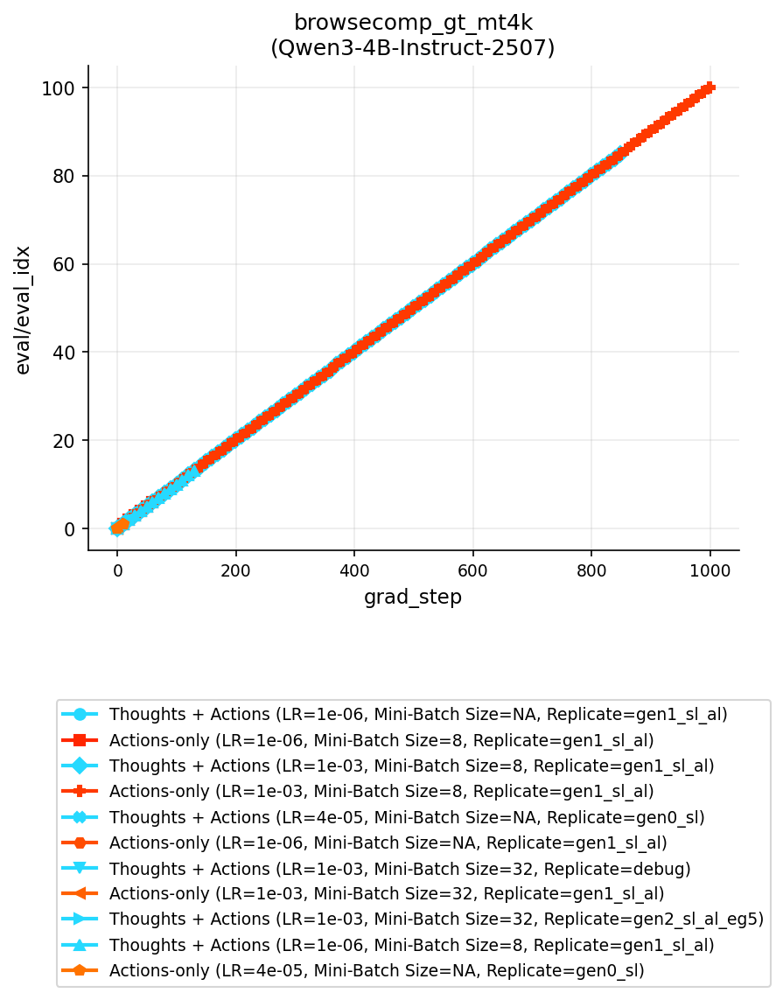

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


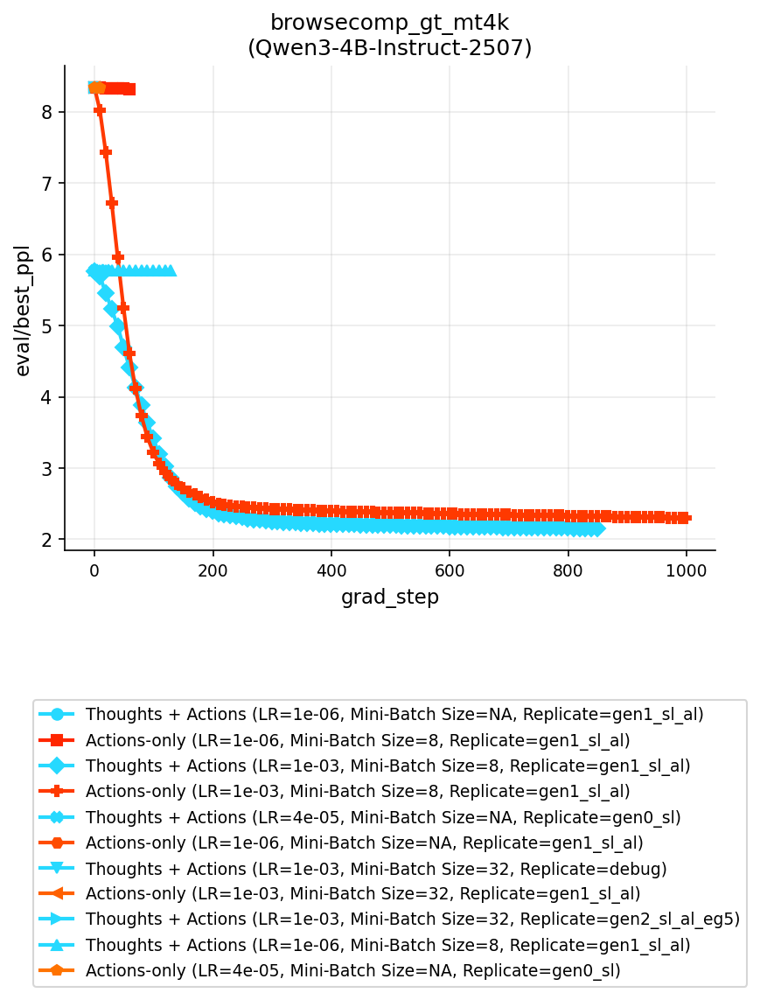

Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'train/loss', 'train/ppl', 'train/weight'], dtype='object')


,grad_step,global_step,train/loss,train/ppl,train/weight
0,0,0,3.359375,28.75000,0.387420
1,0,1,3.046875,21.00000,0.205891
2,0,2,2.062500,7.87500,0.282429
3,0,3,1.687500,5.40625,0.254186
4,0,4,2.375000,10.75000,0.430467


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,2.120748,0.107774,0.0,0.0,8.337371,0.119942,8.337371,0.0,...,NaN,NaN,NaN,NaN,2.120748,8.337371,0.119942,0.107774,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`
KeyError: ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data_lm_save_path', 'train/loss', 'train/ppl', 'train/weight',
       'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest',
       'actions_data_gen_save_path'],
      dtype='object')
Error with `df.rename(columns={KEY_MAP_FWD.items()})`
KeyError: ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
df.columns: Index(['grad_step', 'global_step', 'eval/lm_nll', 'eval/lm_step_acc',
       'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs',
       'eval/lm_best_ppl', 'eval/lm_best_ppl_step',
       'actions_data

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,...,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest
0,0,0,1.752756,0.074553,0.0,0.0,5.770485,0.173296,5.770485,0.0,...,NaN,NaN,NaN,NaN,1.752756,5.770485,0.173296,0.074553,0.0,0.0
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


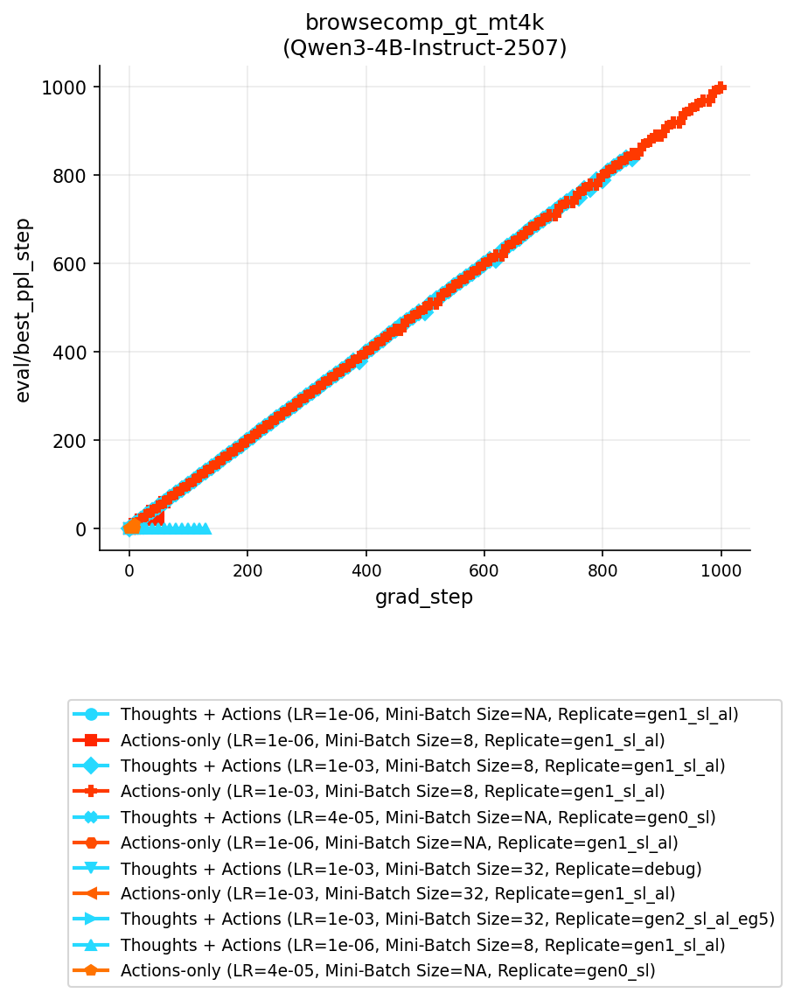

In [51]:
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_8B")

verbose_labels = True

FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        if is_valid_metrics_file(p, kind):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)


df = pd.read_json(valid_metrics_files['jsonl'][0], lines=True)
display(df.head())

eval_gen_cols = [c for c in df.columns if "eval/gen" in c]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols]
# eval_gen_cols, eval_lm_cols

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    # Build labels once so we can count cool vs warm
    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Actions + Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    # Optional: reset marker index per-figure
    marker_idx = 0

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception as e:
            print(f"Error with `df.dropna(subset=EVAL_COLS).sort_values(x_label)`\n{e.__class__.__name__}: {e}")
            print(f"df.columns: {df.columns}")
            # Try to reconcile keys
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        # df = df.rename(columns={k: v})
                        df[v] = df[k]
                    elif v in df.columns:  # reverse mapping
                        # df = df.rename(columns={v: k})
                        df[k] = df[v]
                        
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print("Error with `df.rename(columns={KEY_MAP_FWD.items()})`")
                print(f"{e.__class__.__name__}: {e}")
                print(f"df.columns: {df.columns}")
                display(df.head())         
        label = labels[_idx]

        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=get_color(label),
        )
        marker_idx += 1

    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    # center-bottom legend (inside)
    y_anchor = -len(labels) / 6 * 0.5
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),   # x=middle, y=just above bottom
        # ncol=2,                       # optional: wrap into multiple columns
        ncol=1,
        frameon=True,
    )

    plt.show()
    plt.close()